---
---
# **COVID-19: EVITANDO UM POSSÍVEL COLAPSO NOS SISTEMAS DE SAÚDE**
---
---


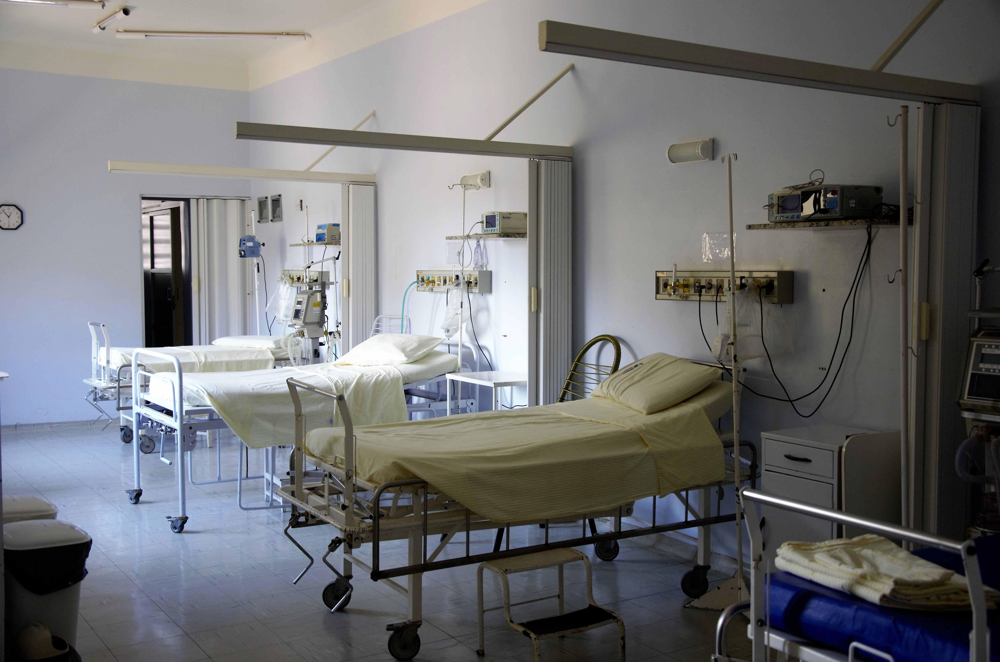

---
**Sobre mim:**
- Autor: Emerson Hideki Miady
- Github: https://github.com/Emersonmiady
- Linkedin: https://www.linkedin.com/in/emerson-miady-a518b318a/

---
# **1. CONTEXTUALIZAÇÃO**

A pandemia da COVID-19 atingiu o mundo inteiro, sobrecarregando assim os sistemas de saúde, os quais estavam despreparados para uma solicitação tão intensa e demorada de leitos de UTI, profissionais, equipamentos de proteção individual e recursos de saúde.

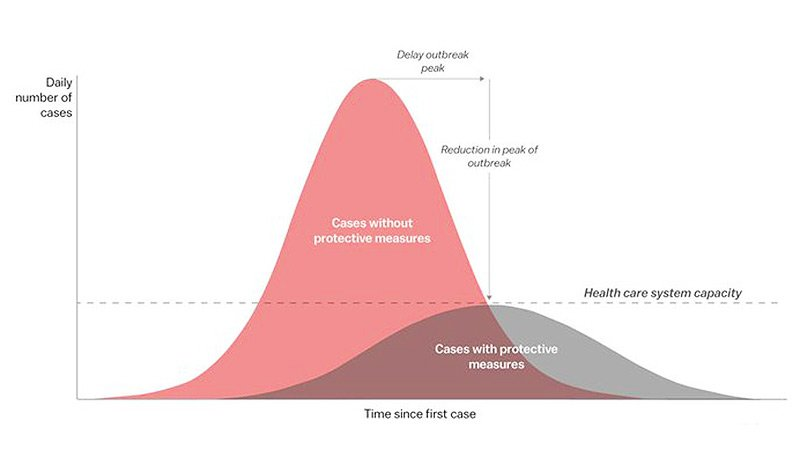

Acima vemos a curva **cinza** sendo o ideal, pois está abaixo da capacidade que o sistema está dispondo. Obviamente que, medidas como:


- **Lavar sempre as mãos**;

- **Passar álcool em gel frequentemente e usar máscaras ao sair de casa**;

- **Se possível, ainda adotar o isolamento social**.

Ajudam muito a reduzir esses aumentos de casos diários, deixando a curva vermelha mais parecida com a situação que queremos. Entretanto, se essas não forem seguidas, teríamos que aumentar a capacidade dos sistemas de saúde, e assim, exigindo verba e tempo até adquirir mais recursos médicos.

Mas o que devemos fazer se a quantidade de leitos ficar estável e não existirem muitos equipamentos sobrando? É aí que nos deparamos com um outro problema, relacionado a **gestão de pessoas que vão para a UTI do próprio hospital:**

- Se encontrarmos uma situação em que todos os leitos estão ocupados, precisamos de **agilidade para evitar um possível superlotamento do espaço**, e além disso, teríamos que **transferir as pessoas para a UTI de outros hospitais**!

- Se determinado hospital estiver com leitos disponíveis, poderíamos contatar os outros locais de saúde para **transferir mais pessoas neste**.

Sendo assim, pensando na **necessidade de ser ágil** para a ida e vinda de pacientes, o Hospital Sírio-Libanês está tentando buscar uma solução para o caso, isto é, **prever se a pessoa precisará de leito antecipadamente**. E é disso que se trata este *notebook*.

**Observação**: O link para a explicação do problema e a disponibilidade do *dataset* estão [aqui](https://www.kaggle.com/S%C3%ADrio-Libanes/covid19) (algumas descrições e a imagem foram retiradas de lá).

---
# **2. OBJETIVOS**

Criar um modelo preditivo (***Machine Learning***) que seja capaz de **auxiliar a equipe médica do Hospital Sírio-Libanês**, prevendo as seguintes situações:

**1. Admissão na UTI de casos confirmados de COVID-19;**

**2. NÃO admissão à UTI de casos confirmados de COVID-19.**

Tudo com a finalidade de dizer **antecipadamente** se, a pessoa atendida no hospital precisará de leito na UTI ou não, a partir dos dados de outros pacientes.

Além disso, tenho como objetivo fazer uma **Análise Exploratória** dos dados.

![](https://external-content.duckduckgo.com/iu/?u=https%3A%2F%2Fimgsapp2.correiobraziliense.com.br%2Fportlet%2F659%2F60862%2F20190503095254640725i.png&f=1&nofb=1)

Fonte da imagem acima: [Este link](https://www.correiobraziliense.com.br/app/noticia/parceiros/siriolibanes/2019/05/03/noticia-publicidade-siriolibanes,753002/sirio-libanes-amplia-sua-atuacao-em-brasilia.shtml).

---
# **3. DESCRIÇÃO DOS DADOS**

Este *dataset* contém dados do Hospital Sírio-Libanês, de São Paulo e de Brasília. Todos os dados foram tornados anônimos seguindo as melhores práticas e recomendações internacionais.

Os dados foram limpos e normalizados para caber entre -1 e 1.

## **3.1. Variáveis**

- **`ICU`**: **variável *target***, ou seja, a predição da pessoa se ela vai para a UTI;

- **`WINDOW`**: **intervalo de horas** em que os eventos (resultados dos testes de um determinado paciente) ocorreram a partir da admissão da pessoa no hospital:

  - 0 - 2 horas;
  - 2 - 4 horas;
  - 4 - 6 horas;
  - 6 - 12 horas;
  - Acima de 12 horas.

São 54 recursos no total, sendo:

- **3 Informações demográficas do paciente;**

- **9 Doenças anteriores agrupadas pelo paciente;**

- **36 Resultados de sangue;**

- **6 Sinais vitais.**

E quando pertinentes, eles são expandidos para:

- **`MEAN`** = média;

- **`MEDIAN`** = mediana;

- **`MAX`** = valor máximo;

- **`MIN`** = valor mínimo;

- **`DIFF`** = `MAX` - `MIN`;

- **`DIFF_REL`** = `DIFF` / `MEDIAN`.

## **3.2. Dicas do Sírio-Libanês**

### **3.2.1. NÃO use os dados com a variável destino presente**



Cuidado para NÃO usar os dados quando a variável de destino estiver presente, pois a ordem do evento é desconhecida (talvez o evento de destino tenha acontecido antes de os resultados serem obtidos). Eles foram mantidos lá para que possamos aumentar este conjunto de dados em outros resultados posteriormente. Sobre essa advertência, vamos entendê-la melhor depois!

- Exemplo 1:

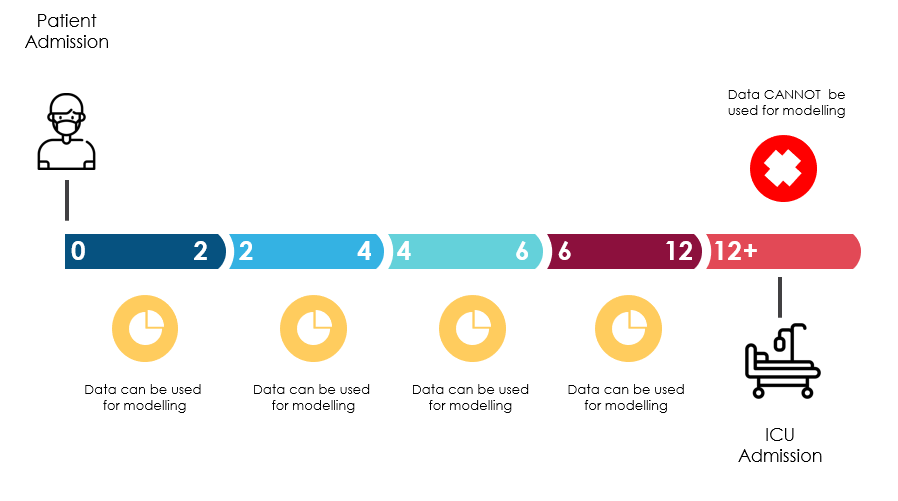

- Exemplo 2:

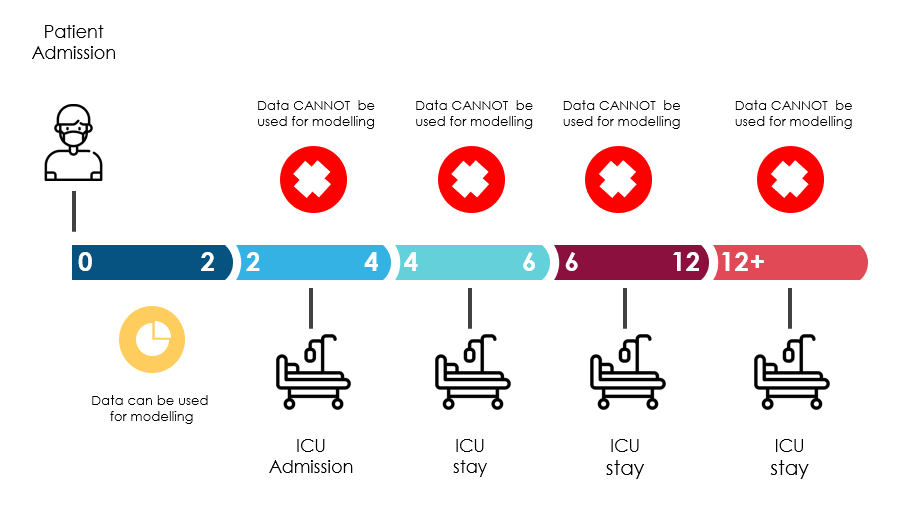

### **3.2.2. Medição estável entre as janelas**

**Problema:** 

Um dos maiores desafios de trabalhar com dados de saúde é que a taxa de amostragem varia entre os diferentes tipos de medições. Por exemplo, os sinais vitais são coletados com mais frequência (geralmente de hora em hora) do que os laboratórios de sangue (geralmente diariamente). Portanto, as janelas, muita das vezes, possuem valores nulos...

**Solução:**

É razoável supor que um paciente, que não tenha uma medição registrada em uma janela de tempo, esteja clinicamente estável, podendo apresentar sinais vitais e exames de sangue semelhantes às janelas vizinhas (baixa volatilidade). Portanto, **pode-se preencher os valores ausentes usando a entrada seguinte ou anterior**. Atenção aos problemas de **multicolinearidade** e **variância zero** nesses dados ao escolher seu algoritmo.

#### **3.2.3. Quanto mais cedo, melhor!**

**Problema:**

A identificação precoce dos pacientes que desenvolverão um curso adverso da doença (e precisam de cuidados intensivos) é a chave para um tratamento adequado (salvar vidas) e para gerenciar leitos e recursos.

**Solução:**

Enquanto um modelo preditivo usando todas as janelas de tempo provavelmente produzirá uma maior precisão, **um bom modelo usando apenas a primeira (0-2) provavelmente será clinicamente mais relevante**. A criatividade é muito bem-vinda, sinta-se à vontade com a engenharia de recursos e as janelas de tempo. Atenção às **medidas repetidas em indivíduos**, uma vez que esses valores são (positivamente) correlacionados ao brincar com os dados.

---
# **4. INFORMAÇÕES ADICIONAIS**

## **4.1. Importação das bibliotecas**

In [1]:
# Bibliotecas de manipulação e EDA
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from IPython.display import Javascript
import warnings

# Bibliotecas de ML
from boruta import BorutaPy
from sklearn.preprocessing import MinMaxScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_validate
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import train_test_split
from sklearn import metrics as m
import statsmodels.api as sm

# Biblioteca para salvar o modelo
import pickle

warnings.filterwarnings("ignore")

## **4.2. Importação do dataset e visão geral**

In [2]:
# Importando os dados e vendo as 10 primeiras linhas
link = 'data/Kaggle_Sirio_Libanes_ICU_Prediction.xlsx'

df = pd.read_excel(link)
df.head(10)

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,...,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0-2,0
1,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,2-4,0
2,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4-6,0
3,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,NaN,NaN,NaN,NaN,-1.000000,-1.000000,6-12,0
4,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-0.238095,-0.818182,-0.389967,0.407558,-0.230462,0.096774,-0.242282,-0.814433,ABOVE_12,1
5,1,1,90th,1,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0-2,1
6,1,1,90th,1,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,2-4,1
7,1,1,90th,1,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,4-6,1
8,1,1,90th,1,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.880952,-1.000000,-0.906832,-0.831132,-0.940967,-0.817204,-0.882574,-1.000000,6-12,1
9,1,1,90th,1,0.0,0.0,0.0,0.0,1.0,0.0,...,0.142857,-0.797980,0.315690,0.200359,-0.239515,0.645161,0.139709,-0.802317,ABOVE_12,1


Aqui conseguimos ver como funciona, na prática, a separação do **mesmo paciente** em **janelas (`WINDOW` - penultima variável deste *DataFrame*) distintas**. E caso um paciente tenha `ICU` (última variável) igual a 1 em alguma das janelas, todas a partir desta janela também terão um valor igual.

In [3]:
# Dimensão do DataFrame
print(f'Esse DataFrame possui {df.shape[0]} linhas e {df.shape[1]} colunas.')

Esse DataFrame possui 1925 linhas e 231 colunas.


Pois é, existem muitas colunas que nem sabemos o que significam... Sendo assim, um dos trabalhos que precisamos realizar é a redução do número de variáveis, para utilizar os algoritmos de *Machine Learning* com uma **eficiência maior**, além de evitar o ***overfitting*** do modelo.

In [4]:
# Verificando os tipos das colunas e suas quantidades
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1925 entries, 0 to 1924
Columns: 231 entries, PATIENT_VISIT_IDENTIFIER to ICU
dtypes: float64(225), int64(4), object(2)
memory usage: 3.4+ MB


In [5]:
# Observando a quantidade de pacientes no DataFrame
n_patients = len(df['PATIENT_VISIT_IDENTIFIER'].unique())
print(f'Foram contabilizados {n_patients} pacientes neste DataFrame.')

Foram contabilizados 385 pacientes neste DataFrame.


In [6]:
# Verificando a quantidade de valores NaN por coluna
df.isna().sum().sort_values(ascending=False)

P02_VENOUS_MIN              1104
LEUKOCYTES_MAX              1104
PC02_VENOUS_MEAN            1104
PC02_VENOUS_MIN             1104
PC02_VENOUS_MAX             1104
                            ... 
PATIENT_VISIT_IDENTIFIER       0
AGE_ABOVE65                    0
GENDER                         0
AGE_PERCENTIL                  0
ICU                            0
Length: 231, dtype: int64

Mais um problema, já citado pelo hospital, é a quantidade de valores faltantes.

Como podemos ver, a quantidade máxima de `NaN`, em uma determinada coluna, é 1104, ou seja, mais da metade das linhas naquela variável... Isso tem que ser preenchido, para não causar problemas com o aprendizado de máquina.

## **4.3. Funções utilizadas**

In [7]:
def complete_df(df):
    '''
    Esta função basicamente preenche os valores faltantes utilizando métodos 
    de "backfill" e "fowardfill", ou seja, todos os NA's que estiverem para 
    trás de determinado valor na coluna, será preenchido com este valor, e o 
    mesmo acontece com os valores para frente deste. 

    O retorno é o DataFrame modificado.
    '''

    # Separando as colunas contínuas e aplicando o processo de
    # preenchimento de NA's

    continuous_features_columns = df.iloc[:, 13:-2].columns
    continuous_features = df.groupby(
        'PATIENT_VISIT_IDENTIFIER',
        as_index=False)[continuous_features_columns].fillna(
            method='bfill').fillna(method='ffill')

    categorical_features = df.iloc[:, :13]

    output = df.iloc[:, -2:]

    # Concatenando tudo em um DataFrame final

    final_data = pd.concat([categorical_features, 
                            continuous_features, 
                            output],
                           ignore_index=True,
                           axis=1)
    final_data.columns = df.columns
    return final_data

In [8]:
def prepare_window(rows):
    '''
    Esta função analisa se, através de um "groupby" dos ID's dos pacientes,
    ou seja, dentre todas as janelas, existe um valor igual a 1 no "ICU".
    Caso exista, então é atribuído um valor igual a 1 em "ICU", quando
    a janela equivale a '0-2'. 

    O retorno é a linhas que apresenta a WINDOW igual a '0-2'.
    '''
    if np.any(rows['ICU']):
        rows.loc[rows['WINDOW'] == '0-2', 'ICU'] = 1
    return rows.loc[rows['WINDOW'] == '0-2']

In [9]:
def show_icu_countplot(df):
    '''
    Esta função apenas pega o ICU e vê a contagem de cada valor, 0 ou 1.

    O retorno da função é o plot do gráfico de barras.
    '''
    plt.style.use('seaborn-ticks')
    plt.figure(figsize=(8, 4))
    plots = sns.countplot(x='ICU', data=df, palette=['#9bdeac', '#e7305b'])
    for bar in plots.patches:
        plots.annotate(
            format(bar.get_height()),
            (bar.get_x() + bar.get_width() / 2, bar.get_height() + 1.5),
            ha='center',
            va='center',
            size=14,
            xytext=(0, 5),
            textcoords='offset points',
            color='#092532')
    plt.xticks([0, 1], ['No', 'Yes'], fontsize=12)
    plt.yticks([], [])
    plt.xlabel('\nICU\n', fontsize=14)
    plt.ylabel('')
    plt.title(f'\nTotal number of patients by ICU\n', fontsize=16)
    sns.despine(top=True, right=True, left=True, bottom=False)

In [10]:
def show_hue_countplot(x, df, order=None):
    '''
    Esta função pega uma variável qualitativa do DataFrame e plota um 
    gráfico de contagem, separando em ICU todas as barras.

    O retorno da função é o plot do gráfico de barras.
    '''
    plt.style.use('seaborn-ticks')
    plt.figure(figsize=(8, 4))
    plots = sns.countplot(x=x,
                          data=df,
                          hue='ICU',
                          palette=['#9bdeac', '#e7305b'],
                          order=order)
    for bar in plots.patches:
        plots.annotate(format(bar.get_height()),
                       (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                       ha='center',
                       va='center',
                       size=12,
                       xytext=(0, 5),
                       textcoords='offset points',
                       color='#092532')
    plt.legend(['No', 'Yes'],
               title='ICU?',
               bbox_to_anchor=(1.13, 0.75),
               fontsize=12,
               title_fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks([], [])
    plt.xlabel(f'\n{x}\n', fontsize=14)
    plt.ylabel('')
    plt.title(f'\nPatients {x} separated by ICU\n', fontsize=16)
    sns.despine(top=True, right=True, left=True, bottom=False)

In [11]:
def change_xticks_to(values):
    '''
    A entrada é uma lista contendo 2 valores.

    Esta função apenas altera os ticks no eixo x, de "0" - "1" para 
    "value_1" - "value_2", no gráfico de barras.

    O retorno é a alteração no gráfico.
    '''
    plt.xticks([0, 1], [values[0], values[1]], fontsize=12)
    plt.show()

In [12]:
def show_disease_by_icu_countplot_in_ax(x, df, ax=None):
    '''
    Esta função pega uma determinada doença do DataFrame e plota um 
    gráfico de contagem, separando em ICU todas as barras. Um detalhe é que,
    esta função irá ser usada em subplots, então o parâmetro 
    ax é importante!

    O retorno da função é o plot do gráfico de barras.
    '''
    plt.style.use('seaborn-ticks')
    plots = sns.countplot(x=x,
                          data=df,
                          hue='ICU',
                          palette=['#9bdeac', '#e7305b'],
                          ax=ax)
    for bar in plots.patches:
        plots.annotate(format(bar.get_height()),
                       (bar.get_x() + bar.get_width() / 2, bar.get_height()),
                       ha='center',
                       va='center',
                       xytext=(0, 5),
                       textcoords='offset points',
                       color='#092532')
    ax.legend('')
    ax.set_xlabel('')
    ax.set_ylabel('')
    ax.set_yticks([])
    ax.set_title(x)
    ax.set_xticklabels(("Don't have", "Have"))
    sns.despine()

In [13]:
def melt_df(clean_df):
    '''
    Recebe o DataFrame já no estado limpo e o desmancha. Tudo com o objetivo
    de plotar as variáveis e seus valores no violinplot.

    O retorno da função é o DataFrame desmanchado (melted).
    '''
    clean_df_without_patients_in_index = clean_df.iloc[:, 12:].reset_index()
    vars_to_melt = clean_df.iloc[:, 12:-1].columns

    melted_df = pd.melt(clean_df_without_patients_in_index,
                        id_vars=['PATIENT_VISIT_IDENTIFIER', 'ICU'],
                        value_vars=vars_to_melt)
    melted_df['ICU'] = melted_df['ICU'].replace({0: 'No', 1: 'Yes'})

    return melted_df

In [14]:
def show_hue_violinplot_in_df_melted(df_melted, figsize=(8, 50), order=None):
    '''
    Esta função mostra o violinplot de um DataFrame desmanchado (melted),
    com todas as colunas do Dataset em uma única variável (variable) e todos
    os seus valores também (value). Só avisando que ele vai separar na metade
    os valores de ICU.

    O retorno da função é o plot do gráfico de violino.
    '''
    plt.style.use('seaborn-ticks')
    plt.figure(figsize=figsize)
    sns.violinplot(x='value',
                   y='variable',
                   data=df_melted,
                   hue='ICU',
                   palette=['#e7305b', '#9bdeac'],
                   split=True,
                   order=order)
    plt.legend(title='ICU?', fontsize=12, title_fontsize=12)
    plt.title('Blood tests and vital signs variables by ICU\n', fontsize=20)
    sns.despine()

In [15]:
def describe(df):
    '''
    Esta função descreve as variáveis quantitativas com média, mediana
    e desvio padrão, todas comparando o ICU (0 e 1). Além disso,
    pinta os maiores valores com um tom mais avermelhado e os menores com um
    tom azulado.

    O retorno é o DataFrame com as descrições pintadas.
    '''
    wanted_columns = ['mean', '50%', 'std']

    describe_df_icu_0 = df.query('ICU == 0').describe().T[wanted_columns]
    describe_df_icu_0.columns = describe_df_icu_0.columns.map(
        lambda col: col + '_icu_0')
    describe_df_icu_0 = describe_df_icu_0[:-1]

    describe_df_icu_1 = df.query('ICU == 1').describe().T[wanted_columns]
    describe_df_icu_1.columns = describe_df_icu_1.columns.map(
        lambda col: col + '_icu_1')
    describe_df_icu_1 = describe_df_icu_1[:-1]

    describe_df = pd.concat([describe_df_icu_0, describe_df_icu_1], axis=1)
    describe_df = describe_df.T.rename({
        '50%_icu_0': 'median_icu_0',
        '50%_icu_1': 'median_icu_1'
    }).sort_index().T
    describe_df = round(describe_df, 3)
    
    describe_df['abs_mean_diff_icu'] = np.abs(describe_df['mean_icu_0'] -\
                                              describe_df['mean_icu_1'])
    
    describe_df['abs_median_diff_icu'] = np.abs(describe_df['median_icu_0'] -\
                                              describe_df['median_icu_1'])
    
    describe_df['abs_std_diff_icu'] = np.abs(describe_df['std_icu_0'] -\
                                              describe_df['std_icu_1'])

    describe_1 = describe_df[:16]
    describe_2 = describe_df[16:32]
    describe_3 = describe_df[32:]

    display(describe_1)
    print('\n')
    display(describe_2)
    print('\n')
    display(describe_3)

In [16]:
def show_hue_boxplot_in_df_melted(df_melted, figsize=(8, 20), order=None):
    '''
    Esta função mostra o boxplot de um DataFrame desmanchado (melted),
    com todas as colunas do Dataset em uma única variável (variable) e todos
    os seus valores também (value). Só avisando que ele vai separar os 
    valores de ICU.

    O retorno da função é o plot do gráfico de caixas.
    '''
    plt.style.use('seaborn-ticks')
    plt.figure(figsize=figsize)
    sns.boxplot(x='variable',
                y='value',
                data=df_melted,
                hue='ICU',
                palette=['#e7305b', '#9bdeac'],
                order=order)
    plt.xticks(rotation=90)
    plt.legend(title='ICU?', fontsize=12, title_fontsize=12)
    plt.title('Blood tests and vital signs variables by ICU\n', fontsize=20)
    plt.grid(linestyle='--')

In [17]:
def show_heatmap(df, size=(13, 13)):
    '''
    Esta função recebe um dataframe com todas as variáveis quantitativas e
    plota o mapa de calor das correlações de Pearson.

    O retorno é o mapa de calor das correlações.
    '''
    plt.figure(figsize=size)
    sns.heatmap(df.corr(),
                vmin=-1,
                vmax=1,
                cmap='RdBu_r',
                linewidths=0.01,
                linecolor='gray')
    plt.show()

In [18]:
def give_abs_corr_variables_above(threshold, quantitative_df):
    '''
    Esta função descobre as variáveis de um DataFrame que são 
    correlacionadas entre si, de acordo com um certo limiar:

    - São escolhidas as variáveis correlacionadas >= limiar;
    - São escolhidas as variáveis correlacionadas =< (-limiar).

    O retorno é um dicionário com as variáveis que são correlacionadas.
    '''
    corr_df = quantitative_df.corr()
    all_quantitative_columns = corr_df.columns

    high_corr_variables = []

    for column in all_quantitative_columns:
        for i in corr_df.index:
            if corr_df.loc[i, column] > threshold and i != column:
                high_corr_variables.append((column, i))

    return high_corr_variables

In [19]:
def show_multiple_regplots(all_vars, size, df, figsize=(10, 20), title=None):
    '''
    Esta função plota vários regplots do Seaborn (gráficos de regressão),
    recebendo o dicionário com todas as variáveis que serão relacionadas.
    Ela também tem que receber a dimensão que os gráficos serão plotados,
    e o tamanho da figura total, junto com o DataFrame.

    O retorno é o plot desse gráfico com todas as regpots.
    '''
    first_vars = [tup[0] for tup in all_vars]
    second_vars = [tup[1] for tup in all_vars]

    fig, axes = plt.subplots(size[0],
                             size[1],
                             figsize=figsize)
    
    k = 0
    if (size[0] == 1) | (size[1] == 1):
            for j in range(size[1]):
                sns.regplot(x=first_vars[k],
                            y=second_vars[k],
                            data=df,
                            ax=axes[j],
                            scatter_kws={'alpha': 0.3})
                axes[j].set_xlabel(f'{first_vars[k]}')
                axes[j].set_ylabel(f'{second_vars[k]}')
                sns.despine()
                k += 1
    
    else:
        for i in range(size[0]):
            for j in range(size[1]):
                sns.regplot(x=first_vars[k],
                            y=second_vars[k],
                            data=df,
                            ax=axes[i, j],
                            scatter_kws={'alpha': 0.3})
                axes[i, j].set_xlabel(f'{first_vars[k]}')
                axes[i, j].set_ylabel(f'{second_vars[k]}')
                sns.despine()
                k += 1
    fig.suptitle(title, fontsize=20)

In [20]:
def stylize_df(df, axis=None):
    '''
  Esta função estiliza o DataFrame com a cor "vlag", de acordo com os
  valores mais próximos de 1 (vermelho) e -1 (azul), em gradiente.

  O retorno é o DataFrame estilizado.
  '''
    style_df = df.style.set_table_attributes("class='dataframe'")\
                 .background_gradient(cmap='vlag',
                                      vmin=-1,
                                      vmax=1,
                                      axis=axis).set_precision(2)
    return style_df

In [21]:
def show_corr_matrix(df):
    '''
    Esta função plota todas as correlações existentes entre as variáveis
    quantitativas do dataframe "quantitative_df". Além disso, pinta os 
    valores de acordo com a função "stylize_df()".

    Ela foi quebrada em vários pedaços para caber na célula do Colab e
    não ficar ruim de ver, com o scroll da célula!

    O retorno são os plots em vários pedações, da matriz de correlação.
    '''
    corr_df = df.corr()

    display(stylize_df(corr_df.iloc[:16, :10]))
    print('\n')
    display(stylize_df(corr_df.iloc[:16, 10:20]))
    print('\n')
    display(stylize_df(corr_df.iloc[:16, 20:30]))
    print('\n')
    display(stylize_df(corr_df.iloc[:16, 30:40]))
    print('\n')
    display(stylize_df(corr_df.iloc[:16, 40:]))
    print('\n')

    display(stylize_df(corr_df.iloc[16:32, :10]))
    print('\n')
    display(stylize_df(corr_df.iloc[16:32, 10:20]))
    print('\n')
    display(stylize_df(corr_df.iloc[16:32, 20:30]))
    print('\n')
    display(stylize_df(corr_df.iloc[16:32, 30:40]))
    print('\n')
    display(stylize_df(corr_df.iloc[16:32, 40:]))
    print('\n')

    display(stylize_df(corr_df.iloc[32:, :10]))
    print('\n')
    display(stylize_df(corr_df.iloc[32:, 10:20]))
    print('\n')
    display(stylize_df(corr_df.iloc[32:, 20:30]))
    print('\n')
    display(stylize_df(corr_df.iloc[32:, 30:40]))
    print('\n')
    display(stylize_df(corr_df.iloc[32:, 40:]))

In [22]:
def histplot(data, xlabel, ylabel):
    '''
    Esta função plota um histograma de algum conjunto de dados.
    
    Retorna o plot desses dados.
    '''
    sns.histplot(data)
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel(ylabel, fontsize=12)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    sns.despine()

In [23]:
def boxplot(data, xlabel):
    '''
    Esta função plota um boxplot de algum conjunto de dados.
    
    Retorna o plot desses dados.
    '''
    sns.boxplot(data)
    plt.xlabel(xlabel, fontsize=12)
    plt.ylabel('')
    plt.xticks(fontsize=12)
    plt.yticks([], [])
    sns.despine(top=True, right=True, left=True, bottom=False)

In [24]:
def get_cv_model_stats(model, X, y, n_splits, n_repeats, scoring):
    '''
    Esta função faz o cross-validation e separa os resultados do "scoring".

    O retorno é a média e o desvio padrão dos scores.
    '''
    np.random.seed(0)
    cv = RepeatedStratifiedKFold(n_splits=n_splits, n_repeats=n_repeats)
    results = cross_validate(model, X, y, cv=cv, scoring=scoring)

    score_mean = np.mean(results['test_score'])
    score_std = np.std(results['test_score'])

    return score_mean, score_std

In [25]:
def show_ml_metrics_results(models, X, y, n_splits, n_repeats, scoring):
    '''
    Esta função pega os valores da média e desvio padrão dos scores de 
    determinada métrica (scoring) e coloca a média junto do intervalo de
    confiança em um DataFrame.

    O retorno é o display deste DataFrame.
    '''
    str_models = []
    models_score_mean = []
    models_score_ci_min = []
    models_score_ci_max = []
    ml_stats_df = pd.DataFrame(
        columns=['Model', 'CI min', 'Final score (mean)', 'CI max'])

    for model in models:
        score_mean, score_std = get_cv_model_stats(model, X, y, n_splits,
                                                   n_repeats, scoring)
        ci_min = score_mean - 2 * score_std
        ci_max = score_mean + 2 * score_std

        models_score_mean.append(score_mean)
        models_score_ci_min.append(ci_min)
        models_score_ci_max.append(ci_max)

    ml_stats_df['CI min'] = models_score_ci_min
    ml_stats_df['Final score (mean)'] = models_score_mean
    ml_stats_df['CI max'] = models_score_ci_max

    for model in models:
        word = []
        for letter in str(model):
            if letter != '(':
                word.append(letter)
            else:
                break
        word = ''.join(word)
        str_models.append(word)

    ml_stats_df['Model'] = str_models
    ml_stats_df.set_index('Model', inplace=True)
    ml_stats_df = ml_stats_df.sort_values('Final score (mean)',
                                          ascending=False)
    ml_stats_df = ml_stats_df.style.set_table_attributes(
        "class='dataframe'").background_gradient(cmap='Blues', axis=0)

    print(f'Score selected: {scoring}')
    display(ml_stats_df)

In [26]:
def show_barplot(x, y, df, title=None):
    '''
    Esta função plota um barplot estilizado.

    O retorno é o plot do barplot.
    '''
    plt.style.use('seaborn-ticks')
    plt.figure(figsize=(6, 4))
    ax = sns.barplot(x=x, y=y, data=df, palette='Blues_r_d')
    for p in ax.patches:
        ax.annotate("%.4f" % p.get_width(),
                    xy=(p.get_width(), p.get_y() + p.get_height() / 2),
                    xytext=(5, 0),
                    textcoords='offset points',
                    ha="left",
                    va="center",
                    color='#092532')
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.xlabel(f'\n{x}\n', fontsize=14)
    plt.ylabel(f'\n{y}\n', fontsize=14)
    plt.title(f'\n{title}\n', fontsize=20)
    sns.despine()

In [27]:
def confusion_matrix(y_test, y_pred):
    '''
    Esta função plota a matriz de confusão para a validação final.
    
    O retorno é o plot da matriz de confusão.
    '''
    cm = m.confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(6, 6))
    sns.heatmap(cm, annot=True, fmt='g', square=True);
    plt.title('Confusion Matrix', fontsize=12)
    plt.xlabel('Predicted labels', fontsize=12);
    plt.ylabel('True labels', fontsize=12)
    plt.show()

---
# **5. PRÉ-PROCESSAMENTO DOS DADOS**

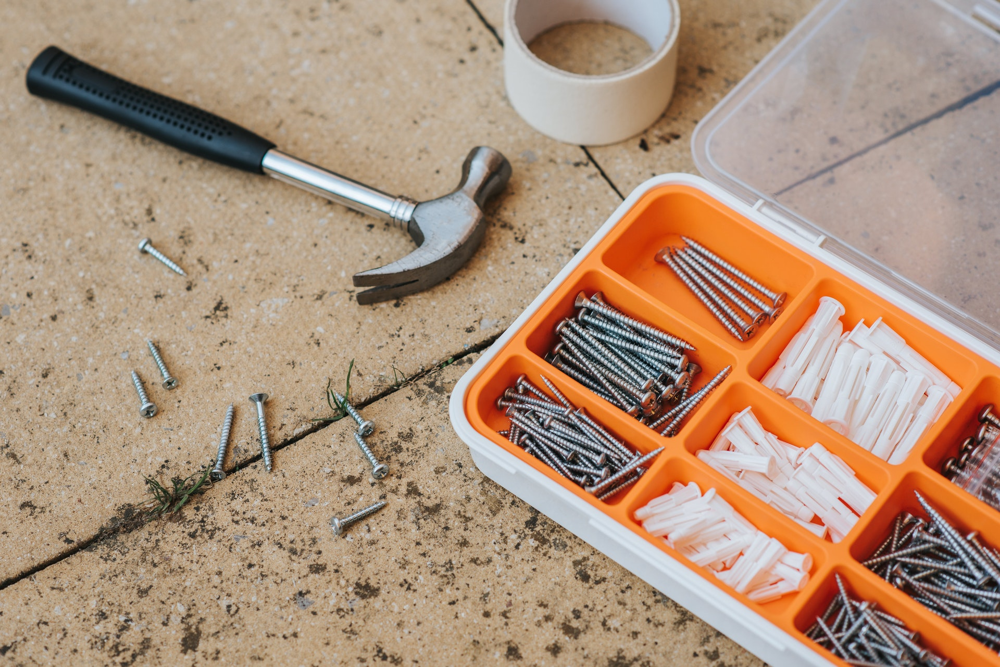

## **5.1. Preenchendo valores faltantes**

Seguindo a dica **3.2.2** do Sírio-Libanês, vou trocar os valores faltantes pelas janelas próximas.

O método consiste em, caso houver um valor "*NaN*", então irá ser preenchido com **o próximo que existir**. Caso não haja próximo, então irá preencher com o **valor anterior existente**. Assim, todas as colunas ficarão preenchidos com algum valor, mesmo que seja repetido de outra janela.

**Observação:** Se quiser entender mais sobre este funcionamento (*backfill* e *fowardfill*), visite o código da função `complete_df` em 4.3.

In [28]:
clean_df = complete_df(df)
clean_df.head()

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,...,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,ICU
0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0-2,0
1,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,2-4,0
2,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-0.389967,0.407558,-0.230462,0.096774,-1.000000,-1.000000,4-6,0
3,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-0.389967,0.407558,-0.230462,0.096774,-1.000000,-1.000000,6-12,0
4,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-0.238095,-0.818182,-0.389967,0.407558,-0.230462,0.096774,-0.242282,-0.814433,ABOVE_12,1


## **5.2. Criação da variável NLR**

Da seção 7.2, vemos que uma variável importante a ser criada, desde o começo, é a `NLR` (*Neutrophiles/Linfocitos Rate*). Mais detalhes deixarei nesta seção a respeito desta taxa.

Dado que ela é nova e quero deixá-la na mesma escala que as outras variáveis (-1 a 1), é de extrema importância que seja criada antes e já aplicar o *rescaling* (explicado na seção 7.3).

In [29]:
# Criando a NLR
clean_df['NLR'] = clean_df['NEUTROPHILES_MEAN'] / clean_df['LINFOCITOS_MEAN']

# Definindo o Scaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Aplicando o Rescaling nesta variável
clean_df['NLR'] = scaler.fit_transform(clean_df[['NLR']])

# Reordenando o ICU
clean_df['ICU_aux'] = clean_df['ICU'].copy()
clean_df.drop('ICU', axis=1, inplace=True)
clean_df.rename({'ICU_aux':'ICU'}, axis=1, inplace=True)

## **5.3. Retirando os pacientes que chegam no hospital e vão direto para a UTI**

De acordo com a dica **3.2.1**, não podemos utilizar os dados a partir do momento em que a pessoa apresenta `ICU` igual a 1. Se ela chega ao hospital e já precisa ir para a UTI, ou seja, **`ICU` igual a 1 no momento "0 - 2"**, não conseguimos utilizar os dados desta pessoa em **nenhuma** janela!

Portanto, a idéia é **retirar os dados deste paciente**.

In [30]:
patients_to_remove = clean_df\
                     .query('WINDOW == "0-2" and ICU == 1')\
                     ['PATIENT_VISIT_IDENTIFIER']\
                     .unique()
clean_df = clean_df.query('PATIENT_VISIT_IDENTIFIER not in @patients_to_remove')

In [31]:
amount_of_removed_patients = len(patients_to_remove)
print(f'Foram removidos {amount_of_removed_patients} pacientes.')

Foram removidos 32 pacientes.


## **5.4. Retirando mais dados faltantes**

Somente existe uma possibilidade de existir mais dados faltantes, em qualquer coluna:

- **Dado um paciente, não foram coletados nenhuma informação daquela determinada variável em nenhuma das janelas**.

In [32]:
# Vendo se existe algum paciente com dados faltantes em todas as janelas,
# dado uma determinada variável.
display(clean_df[clean_df.isna().any(axis=1)])

,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,...,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,NLR,ICU
995,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,0-2,0.440813,0
996,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,2-4,0.440813,0
997,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,4-6,0.440813,0
998,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,6-12,0.440813,0
999,199,0,10th,0,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.919192,-0.608696,-0.607383,-0.790037,-0.817204,-0.599662,-0.918403,ABOVE_12,0.440813,0


Como vemos acima, existe somente um paciente com valores "*NaN*". Sendo assim, é interessante **removê-lo** para os futuros algoritmos!

In [33]:
# Removendo os dados faltantes que restaram
clean_df = clean_df.dropna()

In [34]:
# Só para confirmar se ainda existem valores NaN
na_count = clean_df.isna().sum().sum()
print(f'Existem {na_count} valores faltantes.')

Existem 0 valores faltantes.


In [35]:
n_patients_final = len(clean_df['PATIENT_VISIT_IDENTIFIER'].unique())
print(f'No final, estamos avaliando {n_patients_final} pacientes.')

No final, estamos avaliando 352 pacientes.


## **5.5. Pegando os dados de uma única janela**

Para os modelos de Machine Learning, ficar repetindo o mesmo paciente no modelo, não é interessante... Sendo assim, seguindo a dica **3.2.3**, quanto **mais cedo** a janela que irei pegar, mais relevante são os dados, do ponto de vista clínico.

Logo, dentro de um mesmo paciente, pegarei os dados do momento "**0 - 2**".

**Observação:** mais informações da função `prepare_window` na seção 4.3.

In [36]:
clean_df = clean_df.groupby('PATIENT_VISIT_IDENTIFIER').apply(prepare_window)
clean_df.head()

,,PATIENT_VISIT_IDENTIFIER,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,...,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,WINDOW,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,,,,,,,,,,,,,,,,
0,0,0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0-2,0.402205,1
2,10,2,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.959596,-0.515528,-0.351328,-0.747001,-0.756272,-1.000000,-0.961262,0-2,0.345092,1
3,15,3,0,40th,1,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0-2,0.400939,0
4,20,4,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.979798,-1.000000,-0.883669,-0.956805,-0.870968,-0.953536,-0.980333,0-2,0.438918,0
5,25,5,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.979798,-0.860870,-0.714460,-0.986481,-1.000000,-0.975891,-0.980129,0-2,0.579625,0


Aparentemente o index ficou bem estranho, além de que temos a coluna `WINDOW` sem nenhuma informação relevante, pois todos os valores desta coluna são iguais. Vou só remodelá-lo para ser somente a variável `PATIENT_VISIT_IDENTIFIER` e também excluir a `WINDOW`.

In [37]:
clean_df.set_index('PATIENT_VISIT_IDENTIFIER', inplace=True)
clean_df.drop('WINDOW', axis=1, inplace=True)

In [38]:
display(clean_df)

,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,...,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,,,,,,,,,,,,,,,
0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.402205,1
2,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-0.959596,-0.515528,-0.351328,-0.747001,-0.756272,-1.000000,-0.961262,0.345092,1
3,0,40th,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.400939,0
4,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.952381,-0.979798,-1.000000,-0.883669,-0.956805,-0.870968,-0.953536,-0.980333,0.438918,0
5,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.976190,-0.979798,-0.860870,-0.714460,-0.986481,-1.000000,-0.975891,-0.980129,0.579625,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,0,40th,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.390906,1
381,1,Above 90th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.619048,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.612627,-1.000000,0.397155,0
382,0,50th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.395824,1


## **5.6. Resumo**

Concluindo essa etapa de pré-processamento, fizemos então:

- O preenchimento dos valores faltantes;

- Criação da variável ``NLR``;

- A retirada dos pacientes que chegam no hospital e vão direto para a UTI;

- Exclusão dos dados faltantes que restaram;

- Captura dos dados da janela "0 - 2". 

Como resultado, saímos de um DataFrame com 1925 linhas e 231 colunas (apresentando valores "*NaN*") e fomos para um de **352 linhas e 230 colunas** (sem algum valor "*NaN*").

---
# **6. ANÁLISE EXPLORATÓRIA DOS DADOS**

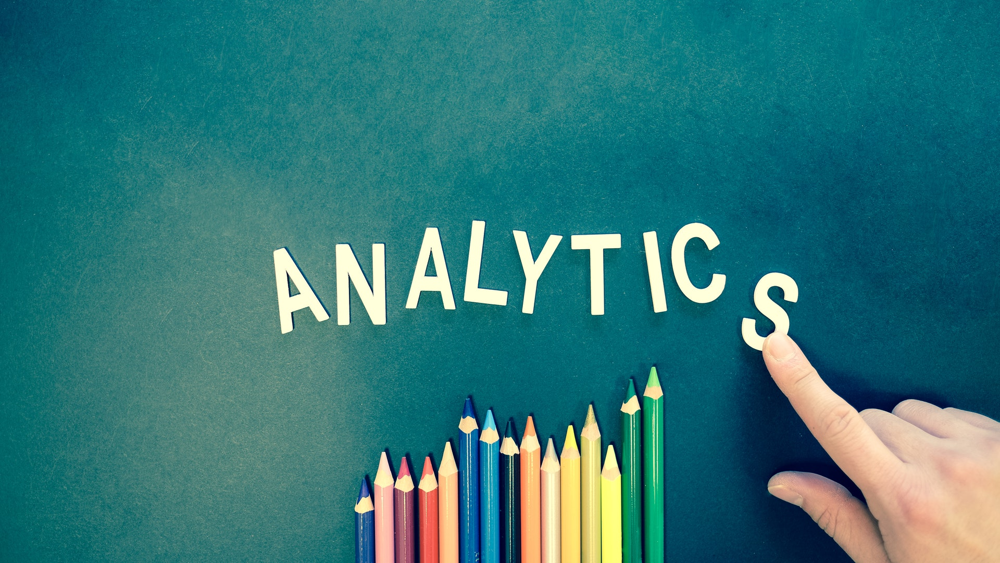

## **6.1. Qual o meu objetivo com a EDA?**

Quero entender como são os pacientes quando eles vão ou não para a UTI, ou seja, **analisarei as variáveis de acordo com a coluna `ICU`**. Então, para começar, nada mais justo que eu saber, simplesmente, a quantidade de pessoas separado por esta variável, em um **gráfico de barras**. 

**Observação:** 

**Só quero que entendam a minha incapacidade de gerar informações e conclusões fora do contexto dos dados, pois não tenho quase nada de conhecimento na área da saúde. Portanto, muitas das informações foram focadas em somente apontar o que está acontecendo naquela visualização, sem dizer os possíveis porquês de ocorrer aquilo.**

In [39]:
# Cópia do DataFrame na seção 5
df_eda = clean_df.copy()

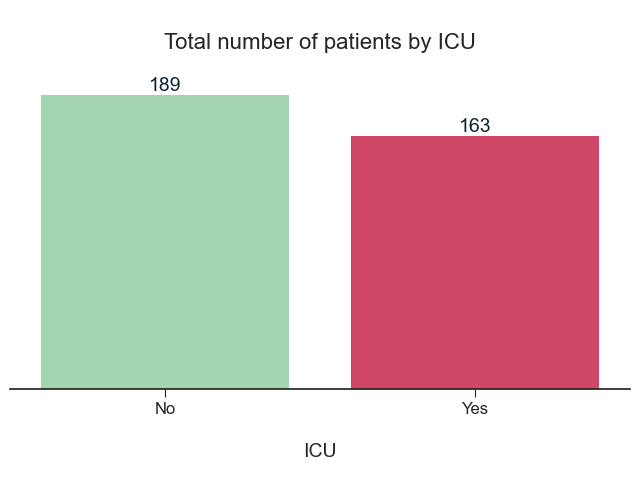

In [40]:
# Gráfico de barras da quantidade de ICU no DataFrame
show_icu_countplot(df_eda)

In [41]:
# Vendo a porcentagem de ICU
icu_pct = df_eda['ICU'].value_counts(normalize=True) * 100
print(f'No nosso DataFrame, temos {round(icu_pct[1], 2)}% que foram para UTI.')

No nosso DataFrame, temos 46.31% que foram para UTI.


Podemos ver que a quantidade de pessoas que vão para a UTI (46,31%) é bem próxima das que não vão. É bom saber disso pois traz um treinamento mais eficaz do nosso futuro modelo (os dados são bem balanceados).

## **6.2. Informações demográficas**

### **6.2.1. Idade acima de 65**

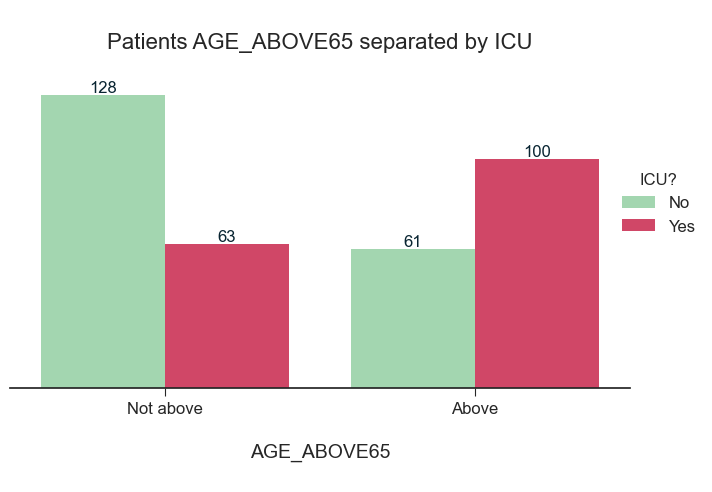

In [42]:
show_hue_countplot('AGE_ABOVE65', df_eda)
change_xticks_to(['Not above', 'Above'])

- Tivemos **mais pacientes abaixo de 65 anos** (191 pessoas) no *Dataset*;

- Das pessoas que são **acima de 65 anos**, existe uma **quantidade maior das que foram para a UTI** (100 pessoas);

- Das pessoas que são **abaixo de 65 anos**, aproximadamente o **dobro não foi para a UTI** (128 pessoas).

Tudo isso bate com a idéia do grupo de risco da COVID-19. Vamos ver como são distribuídos estes números aprofundando um pouco mais, agora de acordo com a idade percentil.

### **6.2.2. Idade percentil**

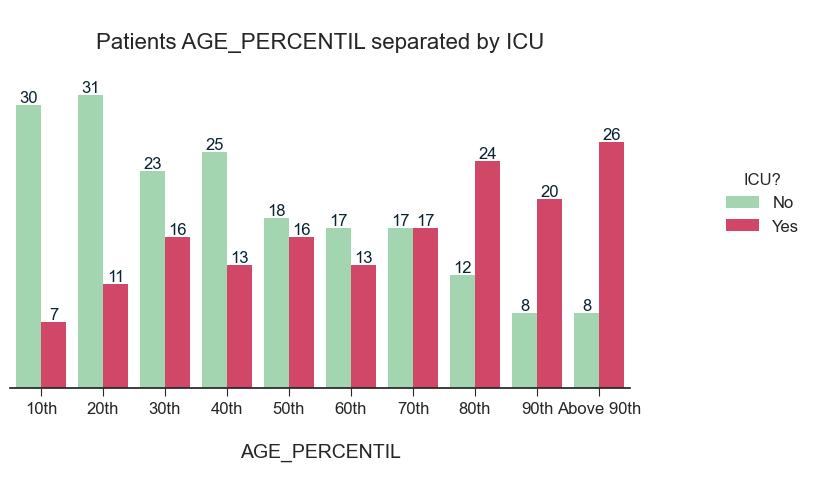

In [43]:
age_percentil_sorted = sorted(df_eda['AGE_PERCENTIL'].unique())
show_hue_countplot('AGE_PERCENTIL', df_eda, order=age_percentil_sorted)

- O **maior número de pacientes** que foram para o hospital estão em um **percentil de 20 anos** (42 pessoas);

- Pode-se notar uma **tendência crescente no número de ocorrências de UTI, conforme se aumenta a idade**;

- Da mesma forma o oposto acontece, ou seja, a **tendência é decrescente no número de pessoas que não foram para a UTI, conforme se aumenta a idade**.

### **6.2.3. Gênero**

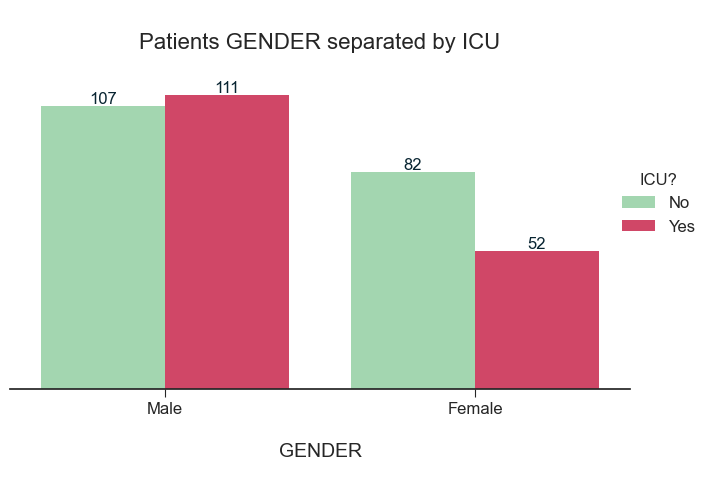

In [44]:
show_hue_countplot('GENDER', df_eda)
change_xticks_to(['Male', 'Female'])

- Existem **muito mais homens hospitalizados** no *Dataset* (218 homens e 114 mulheres, quase o dobro);

- Tivemos **mais homens sendo internados na UTI** (111 pessoas), **comparado com as mulheres** (52 pessoas);

- **Dos homens, temos pouca diferença entre os que vão para a UTI ou não, são quantidades praticamente iguais**;

- **Das mulheres, podemos notar que uma quantidade maior de pessoas não foram para a UTI** (82 pessoas).

## **6.3. Conjunto de Doenças**

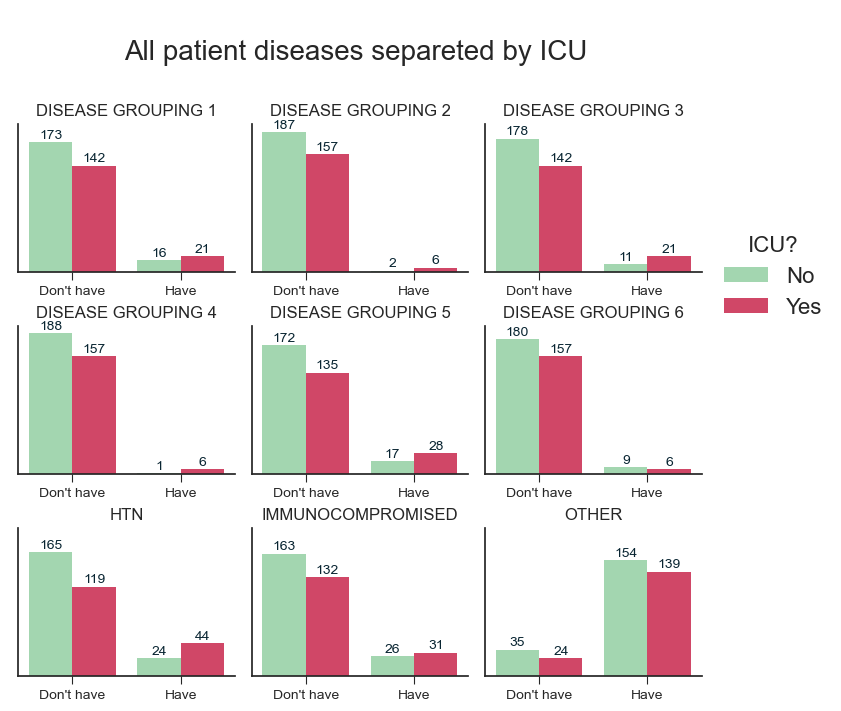

In [45]:
# Definindo as colunas das variáveis de doenças
diseases = df_eda.iloc[:, 3:12].columns

fig, axes = plt.subplots(nrows=3,
                         ncols=3,
                         figsize=(7, 7),
                         sharey=True,
                         constrained_layout=True)

# Colocando as indexações para os subplots, loop dentro de loop
count_disease = 0
for i in range(3):
    for j in range(3):
        show_disease_by_icu_countplot_in_ax(diseases[count_disease],
                                            df_eda,
                                            ax=axes[i][j])
        count_disease += 1

# Colocando informações da figura inteira
fig.legend(['No', 'Yes'],
           title='ICU?',
           bbox_to_anchor=(1.195, 0.7),
           fontsize=16,
           title_fontsize=16)
fig.suptitle('\nAll patient diseases separeted by ICU\n', fontsize=20)
plt.show()

- **Em quase todas as visualizações de doença, a maioria das pessoas não as tiveram, com excessão de `OTHER`**;

- **Dos que tiveram as doenças, em quase todos os gráficos tivemos um maior número de pacientes indo para a UTI, apenas não aconteceu em `DISEASE GROUPING 6` e `OTHER`**;

- **Quando a pessoa estava com determinada doença, a `HTN` (depois de `OTHER`) foi a que teve mais casos de UTI, totalizando 44 pacientes**.

## **6.4. Resultados de Sangue e Sinais Vitais**

### **6.4.1. Visualização de todas as variáveis**

Olhando novamente para o nosso *DataFrame*, parecia que as variáveis da `ALBUMIN` (primeira quantitativa) eram todas iguais, incluindo a `MEDIAN`, `MEAN`, `MIN`  e `MAX`... Será que isso ocorre para as outras também?

A minha maior preocupação não é agora na EDA, mas sim quando formos rodar nossos algoritmos, eles vão ficar viciados por valores que são muito parecidos (alta correlação), ou até idênticos. Isso é extremamente ruim!

In [46]:
# Mostrando novamente o meu DataFrame para olhar os valores quantitativos
display(df_eda)

,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,...,TEMPERATURE_DIFF,OXYGEN_SATURATION_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,,,,,,,,,,,,,,,
0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.402205,1
2,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-0.959596,-0.515528,-0.351328,-0.747001,-0.756272,-1.000000,-0.961262,0.345092,1
3,0,40th,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.400939,0
4,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.952381,-0.979798,-1.000000,-0.883669,-0.956805,-0.870968,-0.953536,-0.980333,0.438918,0
5,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.976190,-0.979798,-0.860870,-0.714460,-0.986481,-1.000000,-0.975891,-0.980129,0.579625,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
380,0,40th,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.390906,1
381,1,Above 90th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.619048,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.612627,-1.000000,0.397155,0
382,0,50th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.395824,1


Além disso, o problema para analisar essas variáveis, é que são **MUITAS**!

Bom, um modo bem mais rápido e generalista, é utilizando **gráficos de violino**. Neste, conseguimos ter uma idéia da dispersão das variáveis, e como ele pode ser **dividido na metade** em ICU = 0 e ICU = 1, é bem mais compacto que o *boxplot* por exemplo.

Vamos ver como são todas as nossas informações de sangue e sinais vitais.

**Observações:** 

- O *violinplot*, ou gráfico de violino, é uma visualização em que estima a densidade de uma determinada variável quantitativa. Bem parecido com o Histograma, porém em um formato mais "abrangente", por meio de uma curva.

- **O gráfico seguinte, mostra muitas informações e poderá ser bem confuso, mas a idéia principal é ter uma visão geral da dispersão das variáveis nos casos de `MEAN`, `MEDIAN`, `MIN`, `MAX`, `DIFF` e `DIFF_REL`.**

In [47]:
# Criando um DataFrame desmanchado (melt), com todas as variáveis
# quantitativas em uma única coluna, e seus valores em uma outra.
# Reelembrando que não podemos desmembrar o ICU, pois é nossa 
# característica de interesse, para comparação!

blood_vital_signs_df = melt_df(df_eda)
blood_vital_signs_df.head()

,PATIENT_VISIT_IDENTIFIER,ICU,variable,value
0,0,Yes,ALBUMIN_MEDIAN,0.605263
1,2,Yes,ALBUMIN_MEDIAN,0.605263
2,3,No,ALBUMIN_MEDIAN,-0.263158
3,4,No,ALBUMIN_MEDIAN,0.605263
4,5,No,ALBUMIN_MEDIAN,0.605263


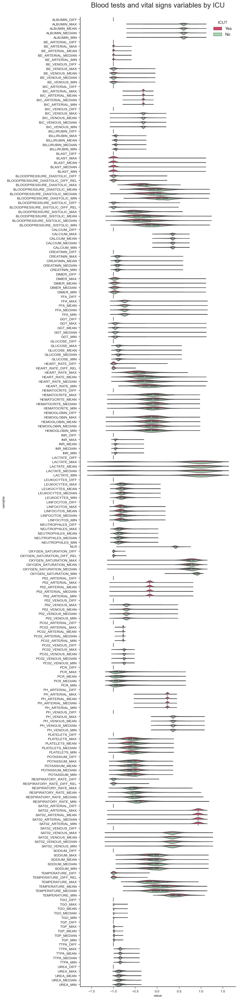

In [48]:
# Sorteando por ordem alfabética para deixar todas do mesmo tipo juntas,
# como por exemplo, "ALBUMIN_X", com o X variando entre todas as medidas
# já mencionadas.

blood_vital_signs_df_var_sorted = sorted(blood_vital_signs_df['variable']\
                                         .unique())

show_hue_violinplot_in_df_melted(blood_vital_signs_df, 
                                 order=blood_vital_signs_df_var_sorted)

Eu sei, esse gráfico não ficou bom, pois está muito comprido e não conseguimos olhar os valores do eixo X. Entretanto, é possível retirar informações dele:

- Comprovamos nossa hipótese, as diferentes medidas para a mesma variáveis são **MUITO parecidas**, salvo excessões como a `TEMPERATURE`, `HEART_RATE`, `BLOOD_PREASSURE_SISTOLIC` e `BLOOD_PREASSURE_DIASTOLIC`;

- Existem variáveis que possuem somente 1 único valor, e quase sempre acontece na medida `DIFF`.

Essas informações são bem úteis, pois precisamos **limpar** ainda mais o nosso *Dataset*!

**Solução:**

Excluir as colunas com `MIN`, `MAX`, `MEDIAN` e `DIFF`, deixando apenas aquelas com `MEAN` e `DIFF_REL`. Mas por quê?

- Estou pegando apenas **uma** das medidas para resumir determinada variável, e essa é de tendência central, a **média**. Não selecionei a mediana pois ela é utilizada no denominador da `DIFF_REL`, daí achei que, de alguma forma, esta poderia carregar a mediana como informação;

- Olhando para todas as `DIFF_REL`'s, nenhuma possui valores únicos, como a `DIFF`. Se eu excluir essa variável, podemos estar perdendo informação...

Como vimos que, para as variáveis `TEMPERATURE`, `HEART_RATE`, `BLOOD_PREASSURE_SISTOLIC` e `BLOOD_PREASSURE_DIASTOLIC` as medidas `MIN`, `MAX`, `MEDIAN` e `DIFF` possuem uma diferença maior na distribuição, então apenas para essas manterei estas métricas.

### **6.4.2. Retirando colunas parecidas ou com valores únicos**

In [49]:
# Variável para comparar a quantidade de colunas anterior com a posterior
old_number_of_cols = df_eda.shape[1]

# Criação do novo DataFrame e as terminações não desejadas
clean_df_aux = df_eda.copy()
terminations = ['MIN', 'MAX', 'MEDIAN', 'DIFF']

In [50]:
# Selecionando as colunas
columns_to_exclude = []
all_columns = clean_df_aux.columns
        
for term in terminations:
    for col in all_columns:
        if col.endswith(term):
            columns_to_exclude.append(col)
            
# Não removendo as colunas já citadas
wanted_cols = ['TEMPERATURE', 'HEART_RATE', 
               'BLOOD_PREASSURE_SISTOLIC', 
               'BLOOD_PREASSURE_DIASTOLIC']
            
for col in wanted_cols: 
    for termination in terminations:
        columns_to_exclude = [value for value in columns_to_exclude if \
                              value != f'{col}_{termination}']

# Dropando as variáveis não desejadas
clean_df_aux.drop(columns_to_exclude, axis=1, inplace=True)

In [51]:
actual_number_of_cols = clean_df_aux.shape[1]
number_of_removed_cols = old_number_of_cols - actual_number_of_cols
old_number_of_cols = actual_number_of_cols
clean_df_aux.head()

,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,...,HEART_RATE_DIFF,TEMPERATURE_DIFF,BLOODPRESSURE_DIASTOLIC_DIFF_REL,BLOODPRESSURE_SISTOLIC_DIFF_REL,HEART_RATE_DIFF_REL,RESPIRATORY_RATE_DIFF_REL,TEMPERATURE_DIFF_REL,OXYGEN_SATURATION_DIFF_REL,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,,,,,,,,,,,,,,,
0,1,60th,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.402205,1
2,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.603053,-1.000000,-0.515528,-0.351328,-0.747001,-0.756272,-1.000000,-0.961262,0.345092,1
3,0,40th,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,0.400939,0
4,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.923664,-0.952381,-1.000000,-0.883669,-0.956805,-0.870968,-0.953536,-0.980333,0.438918,0
5,0,10th,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,-0.984733,-0.976190,-0.860870,-0.714460,-0.986481,-1.000000,-0.975891,-0.980129,0.579625,0


In [52]:
print(f'Foram removidas {number_of_removed_cols} colunas.')
print(f'Agora, estamos com {actual_number_of_cols} colunas em nosso DataFrame.')

Foram removidas 160 colunas.
Agora, estamos com 70 colunas em nosso DataFrame.


### **6.4.3. Média, mediana e desvio padrão**

O meu intuito nesta seção é ver o quanto as medidas de tendência central e o desvio padrão de todas as variáveis se alteram, comparando também o `ICU`. Ficará mais claro ao ver as figuras abaixo.

In [53]:
quantitative_df_with_icu = clean_df_aux.iloc[:, 12:]
describe(quantitative_df_with_icu)

,mean_icu_0,mean_icu_1,median_icu_0,median_icu_1,std_icu_0,std_icu_1,abs_mean_diff_icu,abs_median_diff_icu,abs_std_diff_icu
ALBUMIN_MEAN,0.591,0.561,0.605,0.605,0.091,0.171,0.030,0.000,0.080
BE_ARTERIAL_MEAN,-1.000,-0.995,-1.000,-1.000,0.000,0.036,0.005,0.000,0.036
BE_VENOUS_MEAN,-0.970,-0.945,-1.000,-1.000,0.094,0.133,0.025,0.000,0.039
BIC_ARTERIAL_MEAN,-0.317,-0.320,-0.317,-0.317,0.000,0.048,0.003,0.000,0.048
BIC_VENOUS_MEAN,-0.313,-0.329,-0.317,-0.317,0.060,0.115,0.016,0.000,0.055
BILLIRUBIN_MEAN,-0.947,-0.944,-0.939,-0.939,0.027,0.058,0.003,0.000,0.031
BLAST_MEAN,-1.000,-0.986,-1.000,-1.000,0.000,0.158,0.014,0.000,0.158
CALCIUM_MEAN,0.344,0.306,0.357,0.357,0.065,0.098,0.038,0.000,0.033
CREATININ_MEAN,-0.907,-0.876,-0.908,-0.908,0.034,0.135,0.031,0.000,0.101
FFA_MEAN,-0.740,-0.717,-0.742,-0.742,0.112,0.211,0.023,0.000,0.099


,mean_icu_0,mean_icu_1,median_icu_0,median_icu_1,std_icu_0,std_icu_1,abs_mean_diff_icu,abs_median_diff_icu,abs_std_diff_icu
LEUKOCYTES_MEAN,-0.786,-0.756,-0.808,-0.792,0.111,0.132,0.030,0.016,0.021
LINFOCITOS_MEAN,-0.739,-0.788,-0.763,-0.822,0.131,0.147,0.049,0.059,0.016
NEUTROPHILES_MEAN,-0.850,-0.809,-0.878,-0.844,0.104,0.128,0.041,0.034,0.024
P02_ARTERIAL_MEAN,-0.171,-0.178,-0.171,-0.171,0.000,0.126,0.007,0.000,0.126
P02_VENOUS_MEAN,-0.700,-0.698,-0.704,-0.704,0.111,0.141,0.002,0.000,0.030
PC02_ARTERIAL_MEAN,-0.779,-0.780,-0.779,-0.779,0.000,0.015,0.001,0.000,0.015
PC02_VENOUS_MEAN,-0.758,-0.774,-0.755,-0.755,0.039,0.064,0.016,0.000,0.025
PCR_MEAN,-0.873,-0.738,-0.915,-0.845,0.167,0.265,0.135,0.070,0.098
PH_ARTERIAL_MEAN,0.234,0.231,0.234,0.234,0.000,0.062,0.003,0.000,0.062
PH_VENOUS_MEAN,0.373,0.394,0.364,0.364,0.071,0.117,0.021,0.000,0.046


,mean_icu_0,mean_icu_1,median_icu_0,median_icu_1,std_icu_0,std_icu_1,abs_mean_diff_icu,abs_median_diff_icu,abs_std_diff_icu
TGP_MEAN,-0.987,-0.987,-0.988,-0.990,0.011,0.019,0.000,0.002,0.008
TTPA_MEAN,-0.838,-0.834,-0.847,-0.847,0.047,0.052,0.004,0.000,0.005
UREA_MEAN,-0.868,-0.828,-0.880,-0.851,0.070,0.087,0.040,0.029,0.017
DIMER_MEAN,-0.959,-0.951,-0.978,-0.978,0.126,0.159,0.008,0.000,0.033
BLOODPRESSURE_DIASTOLIC_MEAN,0.012,-0.095,0.012,-0.111,0.240,0.281,0.107,0.123,0.041
BLOODPRESSURE_SISTOLIC_MEAN,-0.336,-0.287,-0.377,-0.338,0.248,0.337,0.049,0.039,0.089
HEART_RATE_MEAN,-0.229,-0.256,-0.264,-0.296,0.257,0.301,0.027,0.032,0.044
RESPIRATORY_RATE_MEAN,-0.509,-0.417,-0.525,-0.458,0.190,0.245,0.092,0.067,0.055
TEMPERATURE_MEAN,0.087,0.134,0.071,0.107,0.253,0.286,0.047,0.036,0.033
OXYGEN_SATURATION_MEAN,0.774,0.728,0.789,0.737,0.103,0.199,0.046,0.052,0.096


As variáveis que mais apresentam diferenças em suas médias, comparando os ``ICU``'s, são:
- ``LACTATE_MEAN`` (diferença, em módulo, de 0.334);
- ``PCR_MEAN`` (diferença, em módulo, de 0.135);
- ``BLOODPRESSURE_DIASTOLIC_MEAN`` (diferença, em módulo, de 0.107);
- ``SODIUM_MEAN`` (diferença, em módulo, de 0.095);
- ``RESPIRATORY_RATE_MEAN`` (diferença, em módulo, de 0.092).

Analogamente para as medianas, temos:
- ``BLOODPRESSURE_DIASTOLIC_MEAN`` (diferença, em módulo, de 0.123);
- ``SODIUM_MEAN`` (diferença, em módulo, de 0.114).

E para finalizar, de forma análoga no caso dos desvios padrões, temos:
- ``SAT02_ARTERIAL_MEAN`` (diferença, em módulo, de 0.203);
- ``LACTATE_MEAN`` (diferença, em módulo, de 0.188);
- ``BLAST_MEAN`` (diferença, em módulo, de 0.158);
- ``P02_ARTERIAL_MEAN`` (diferença, em módulo, de 0.126).

As diferenças em módulo estão servindo para uma noção inicial de importância de variáveis, dado que estas diferenças de medidas amostrais entre os grupos de ``ICU`` são, no fundo, características de populações, ou seja, "quanto que uma população se difere da outra comparando sua amostra".

### **6.4.4. Vendo os boxplots das variáveis restantes**

Agora que temos as nossas variáveis mais "resumidas" (quantidade bem menor delas), podemos ver as diferenças nos ***boxplots***, estes sendo um pouco mais informativo (comparado com os *violinplots*).

**Observação:** O gráfico de *boxplot* possui a forma de caixa que é muito utilizada para uma análise gráfica do conjunto de dados. Ele fornece algumas informações, tais como: distribuição dos dados, simetria e detecção de candidatos a outliers.

<center>

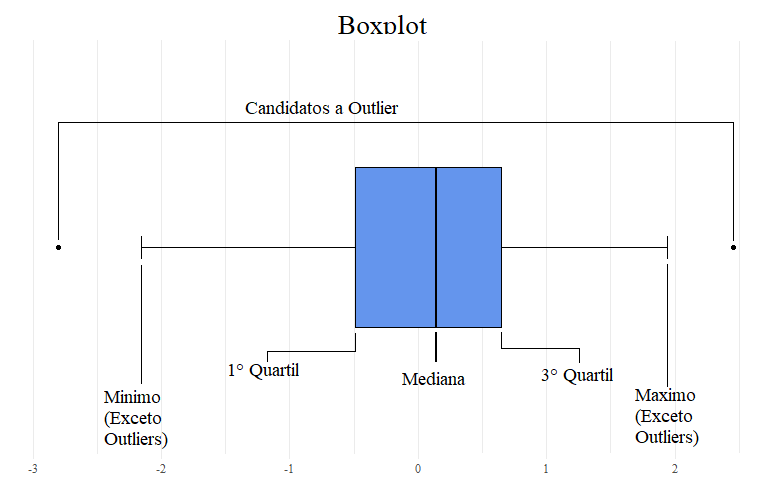

</center>

**1. Distribuição dos Dados:** 

A dispersão dos dados pode ser representada pelo intervalo interquartílico que é a diferença entre o terceiro quartil e o primeiro quartil (tamanho da caixa), ou ainda pela amplitude que é calculada da seguinte maneira: Diferença entre o valor máximo e mínimo. Embora a amplitude seja de fácil entendimento, o intervalo interquartílico é uma estatística mais robusta para medir variabilidade uma vez que não sofre influência de outliers.

**2. Simetria:** 

Um conjunto de dados que tem uma distribuição simétrica, terá a linha da mediana no centro do retângulo. Quando a linha da mediana está próxima ao primeiro quartil, os dados são assimétricos positivos e quando a posição da linha da mediana é próxima ao terceiro quartil, os dados são assimétricos negativos. Vale ressaltar que a mediana é a medida de tendência central mais indicada quando os dados possuem distribuição assimétrica, uma vez que a média aritmética é influenciada pelos valores extremos.

**3. Outliers:** 

Já os outliers indicam possíveis valores discrepantes. No boxplot, as observações são consideradas outliers quando estão abaixo ou acima do limite de detecção de outliers.

Fonte: Relatórios da **ICMC Júnior** (Empresa Júnior em que eu participava).

In [54]:
clean_df_mean_melted = melt_df(clean_df_aux)
new_order = sorted(clean_df_mean_melted['variable'].unique())

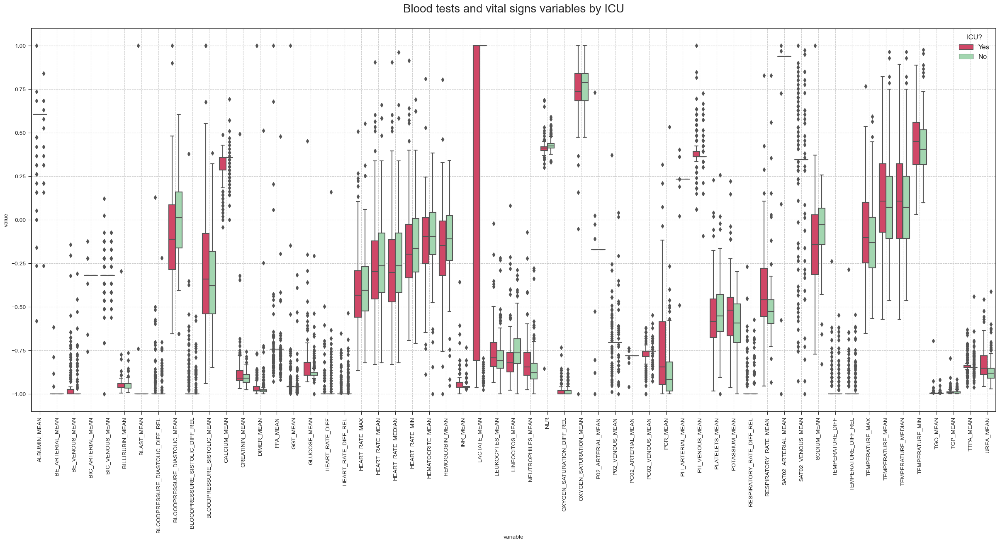

In [55]:
show_hue_boxplot_in_df_melted(clean_df_mean_melted, figsize=(30, 12), 
                              order=new_order)

- Uma variável que me chamou mais a atenção, é a **`LACTATE_MEAN`**, com uma dispersão extremamente alta dos dados de pacientes que vão para UTI, e muito pouco disperso no caso dos que não vão para a UTI;

- As variáveis que nem possuem "caixas" dos boxplots, irei descartar no futuro, pois não apresentam nenhuma diferença para a modelagem (ser de UTI ou não não faz diferença de acordo com determinada variável). São elas:

    - ``ALBUMIN_MEAN``;
    
    - ``BE_ARTERIAL_MEAN``;
    
    - ``BIC_VENOUS_MEAN``;
    
    - ``BIC_ARTERIAL_MEAN``;
    
    - ``BLAST_MEAN``;
    
    - ``BLOODPRESSURE_DIASTOLIC_DIFF_REL``;
    
    - ``BLOODPRESSURE_SISTOLIC_DIFF_REL``;
    
    - ``FFA_MEAN``;
    
    - ``HEART_RATE_DIFF``;
    
    - ``HEART_RATE_DIFF_REL``;
    
    - ``P02_ARTERIAL_MEAN``;
    
    - ``P02_VENOUS_MEAN``;
    
    - ``PC02_ARTERIAL_MEAN``;
    
    - ``PH_ARTERIAL_MEAN``;
    
    - ``RESPIRATORY_RATE_DIFF_REL``;
    
    - ``SAT02_ARTERIAL_MEAN``;
    
    - ``SAT02_VENOUS_MEAN``;
    
    - ``TEMPERATURE_DIFF``;
    
    - ``TEMPERATURE_DIFF_REL``.

- Não irei ficar listando todas as diferenças em cada variável pois são muitas! Vai ficar repetitivo e cansativo... Mas só de ver, dá para se ter uma noção de dispersão e das posições dos quartis, observando assim que **existem diferenças em muitas variáveis**, entre os pacientes que foram para a UTI e os que não foram! Exemplos:

  - `BLOODPRESSURE_SISTOLIC_MEAN`;

  - `HEART_RATE_MEAN`;

  - `PCR_MEAN`;

  - `RESPIRATORY_RATE_MEAN`;
  
  - `TEMPERATURE_MEAN`;

In [56]:
cols_drop = ['ALBUMIN_MEAN', 'BE_ARTERIAL_MEAN', 'BIC_VENOUS_MEAN',
             'BIC_ARTERIAL_MEAN', 'BLAST_MEAN', 'FFA_MEAN',
             'BLOODPRESSURE_DIASTOLIC_DIFF_REL', 'HEART_RATE_DIFF', 
             'HEART_RATE_DIFF_REL', 'BLOODPRESSURE_SISTOLIC_DIFF_REL', 
             'P02_ARTERIAL_MEAN', 'P02_VENOUS_MEAN', 'PC02_ARTERIAL_MEAN', 
             'PH_ARTERIAL_MEAN', 'RESPIRATORY_RATE_DIFF_REL', 
             'SAT02_ARTERIAL_MEAN', 'SAT02_VENOUS_MEAN', 'TEMPERATURE_DIFF', 
             'TEMPERATURE_DIFF_REL']

clean_df_aux.drop(cols_drop, axis=1, inplace=True)

In [57]:
actual_number_of_cols = clean_df_aux.shape[1]
number_of_removed_cols = old_number_of_cols - actual_number_of_cols
old_number_of_cols = actual_number_of_cols

In [58]:
print(f'Foram removidas {number_of_removed_cols} colunas.')
print(f'Agora, estamos com {actual_number_of_cols} colunas em nosso DataFrame.')

Foram removidas 19 colunas.
Agora, estamos com 51 colunas em nosso DataFrame.


### **6.4.5. Encoding de AGE_PERCENTIL**

In [59]:
# Transformando age percentil em numérico
age_percentile_dict = {'10th':1, '20th':2, '30th':3, '40th':4, '50th':5,
                       '60th':6, '70th':7, '80th':8, '90th':9, 
                       'Above 90th':10}

clean_df_aux['AGE_PERCENTIL'] = clean_df_aux['AGE_PERCENTIL']\
                                .map(age_percentile_dict)

In [60]:
clean_df_aux.head()

,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,...,OXYGEN_SATURATION_MEAN,HEART_RATE_MEDIAN,TEMPERATURE_MEDIAN,HEART_RATE_MIN,TEMPERATURE_MIN,HEART_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_DIFF_REL,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,,,,,,,,,,,,,,,
0,1,6,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.736842,-0.283019,-0.285714,-0.162393,0.208791,-0.432836,-0.420290,-1.000000,0.402205,1
2,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.935673,-0.056604,0.357143,-0.111111,0.604396,0.000000,0.101449,-0.961262,0.345092,1
3,0,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.684211,-0.528302,-0.285714,-0.384615,0.208791,-0.626866,-0.420290,-1.000000,0.400939,0
4,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.868421,0.160377,0.285714,0.196581,0.538462,-0.044776,0.072464,-0.980333,0.438918,0
5,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.815789,-0.537736,-0.196429,-0.401709,0.252747,-0.626866,-0.333333,-0.980129,0.579625,0


### **6.4.6. Correlações entre variáveis**

Para finalizar a EDA do meu *DataFrame* principal, vou ver como as variáveis se **correlacionam** entre si, independentemente do `ICU`. Para isso, farei o uso do **mapa de calor das correlações de Pearson**. 

**Observações:** 

1. A correlação de Pearson é um método de análise que permite verificar a existência ou não de uma "certa ligação" entre duas variáveis. Ela é descrita pela seguinte fórmula:

$$\rho = \frac{\sum_{i=1}^{n}(x_i - \bar{x})(y_i - \bar{y})}{(n-1)s_xs_y}$$

Onde:

- $\bar{x}$ : média da amostra para a variável $x$;

- $s_x$ : desvio padrão para a variável $x$;

- $\bar{y}$ : média da amostra para a variável $y$;

- $s_y$ : desvio padrão para a variável $y$;

- $n$ : número total de amostras coletadas.

Essa medida está definina entre o intervalo [-1,1]:

- Quanto mais próximo de 1, temos uma correlação positiva;

- Quanto mais próximo de -1, temos uma correlação negativa;

-  E quanto mais próximo do zero, mostra que as variáveis não possuem relação entre si. 

O seguinte quadro fornece um guia (em modulo) de como podemos descrever uma correlação em palavras dado o valor numérico. É claro que as interpretações dependem de cada contexto em particular, ou seja, esses intervalos podem mudar como eu quiser (contanto que não sejam muito diferentes da tabela).

<center>

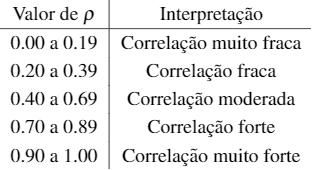

</center>

2. Não utilizarei as correlações mostrando seus valores numéricos, mas de uma forma colorida e mais intuitiva, em um mapa de calor. Estou usando este método pois são muitas variáveis, e vários números dentro de cada quadradinho no gráfico não ficará visualmente bom.

Fonte: algumas definições foram retiradas de relatórios da **ICMC Júnior** (Empresa Júnior em que eu participo).

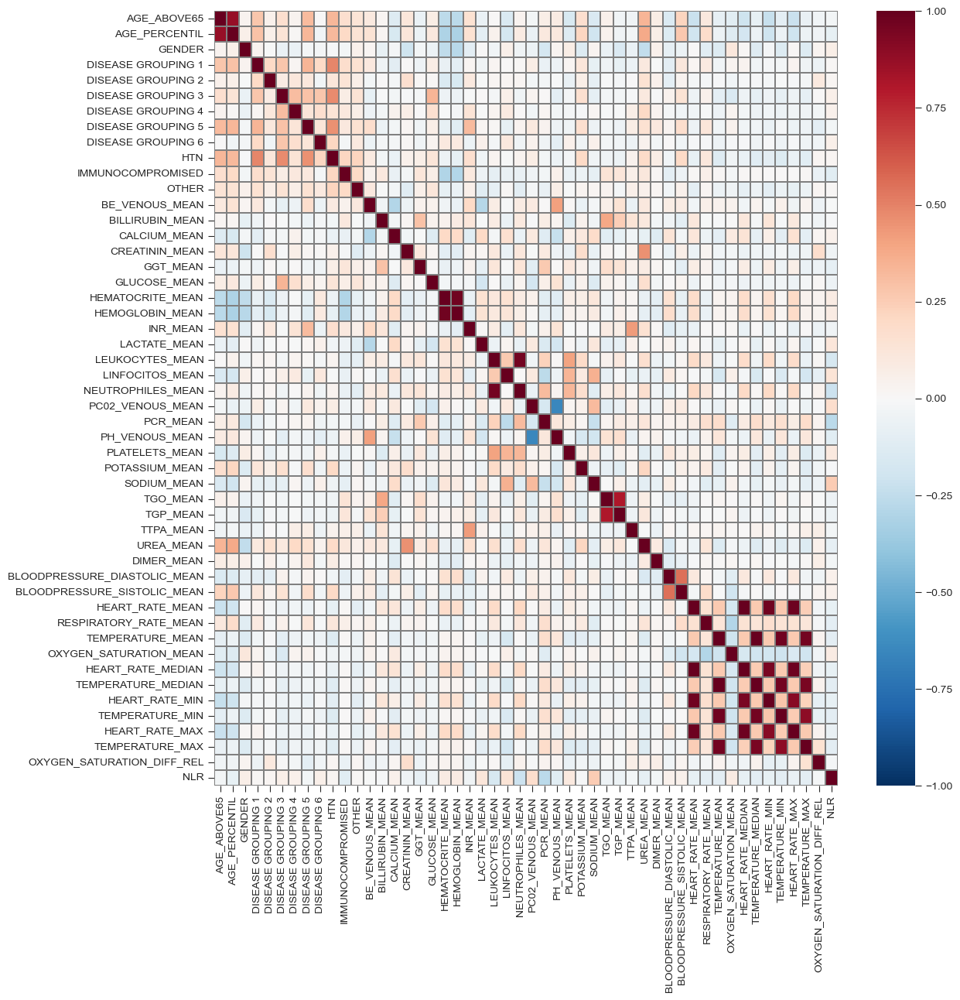

In [61]:
df_without_icu = clean_df_aux.iloc[:, :-1]
show_heatmap(df_without_icu)

No mapa acima, **quanto mais forte a coloração, tanto para o vermelho quanto para o azul, mais correlacionado é uma variável com a outra**. Mas como essa coloração é algo bem subjetivo, então vamos tentar achar uma outra forma para saber quais variáveis são altamente correlacionadas.

Um método que eu pensei, é fazer um *DataFrame* e filtrar somente as variáveis que possuem correlação **maior que 0.7** e **menor que -0.7**. Para isso, criei uma função chamada `give_abs_corr_variables_above()`, podendo estabelecer um limiar contínuo absoluto.

**Observação:** Para mais detalhes, visite o código da função `give_abs_corr_variables_above()` na seção 4.3.

In [62]:
high_corr_variables = give_abs_corr_variables_above(0.7, df_without_icu)
display(high_corr_variables)

[('AGE_ABOVE65', 'AGE_PERCENTIL'),
 ('AGE_PERCENTIL', 'AGE_ABOVE65'),
 ('HEMATOCRITE_MEAN', 'HEMOGLOBIN_MEAN'),
 ('HEMOGLOBIN_MEAN', 'HEMATOCRITE_MEAN'),
 ('LEUKOCYTES_MEAN', 'NEUTROPHILES_MEAN'),
 ('NEUTROPHILES_MEAN', 'LEUKOCYTES_MEAN'),
 ('TGO_MEAN', 'TGP_MEAN'),
 ('TGP_MEAN', 'TGO_MEAN'),
 ('HEART_RATE_MEAN', 'HEART_RATE_MEDIAN'),
 ('HEART_RATE_MEAN', 'HEART_RATE_MIN'),
 ('HEART_RATE_MEAN', 'HEART_RATE_MAX'),
 ('TEMPERATURE_MEAN', 'TEMPERATURE_MEDIAN'),
 ('TEMPERATURE_MEAN', 'TEMPERATURE_MIN'),
 ('TEMPERATURE_MEAN', 'TEMPERATURE_MAX'),
 ('HEART_RATE_MEDIAN', 'HEART_RATE_MEAN'),
 ('HEART_RATE_MEDIAN', 'HEART_RATE_MIN'),
 ('HEART_RATE_MEDIAN', 'HEART_RATE_MAX'),
 ('TEMPERATURE_MEDIAN', 'TEMPERATURE_MEAN'),
 ('TEMPERATURE_MEDIAN', 'TEMPERATURE_MIN'),
 ('TEMPERATURE_MEDIAN', 'TEMPERATURE_MAX'),
 ('HEART_RATE_MIN', 'HEART_RATE_MEAN'),
 ('HEART_RATE_MIN', 'HEART_RATE_MEDIAN'),
 ('HEART_RATE_MIN', 'HEART_RATE_MAX'),
 ('TEMPERATURE_MIN', 'TEMPERATURE_MEAN'),
 ('TEMPERATURE_MIN', 'TEMPERATU

É obvio que:

- ``AGE_ABOVE65`` e ``AGE_PERCENTIL``;

- ``HEART_RATE`` e suas diferentes medidas;

- ``TEMPERATURE`` e suas diferentes medidas;

possuem correlações altas. Agora, qual delas vamos escolher para o nosso modelo? Esta pergunta vamos responder mais para frente no projeto.

- A explicação para a correlação alta de ``HEMOGLOBIN_MEAN``/``HEMATOCRITE_MEAN``, pode estar relacionado com o que [este link](https://www.tuasaude.com/hematocrito-hct/) diz:

> O valor do hematócrito também pode refletir a quantidade de hemoglobina presente nas hemácias: quando o hematócrito está baixo, normalmente é indicativo de alguma situação em que há a diminuição da quantidade de hemácias ou de hemoglobina, como a anemia, por exemplo. Quando está alto, pode ser indicativo de pouco líquido no sangue, o que pode significar desidratação grave.

- A explicação para a correlação alta de ``NEUTROPHILES_MEAN``/``LEUKOCYTES_MEAN``, pode estar relacionado com o que [este link](https://www.tuasaude.com/neutrofilos/) diz:

> Os neutrófilos são um tipo de leucócitos e, por isso, são responsáveis pela defesa do organismo, tendo sua quantidade aumentada no sangue quando há alguma infecção ou inflamação ocorrendo.

- A explicação para a correlação alta de ``TGP_MEAN``/``TGO_MEAN``, pode estar relacionado com o que [este link](https://medicoresponde.com.br/o-que-e-tgo-e-tgp/) diz:

> TGO (transaminase glutâmico-oxalacética) e TGP (transaminase glutâmico-pirúvica) são enzimas transaminases (ou aminotransferases);

> A TGO está presente no interior de diversas células do corpo (fígado, miocárdio do coração, músculo esquelético, pâncreas, rins, glóbulos vermelhos), enquanto que a TGP é encontrada quase que unicamente nas células do fígado. São responsáveis pela metabolização de algumas proteínas (L-aspartato, alfacetoglutarato, alanina, etc);

> Têm como utilidade o diagnóstico diferencial de doenças do sistema hepatobiliar e do pâncreas (TGO e TGP) ou colaborar com a identificação de infarto de miocárdio e miopatias (TGP). Ou seja, a alto correlação entre essas 2 variáveis é compreensível.

Aqui vão os gráficos de regressão dessas variáveis.

In [63]:
# Variáveis com correlação alta
all_vars = [('HEMATOCRITE_MEAN', 'HEMOGLOBIN_MEAN'),
            ('LEUKOCYTES_MEAN', 'NEUTROPHILES_MEAN'),
            ('TGO_MEAN', 'TGP_MEAN'),
            ('HEART_RATE_MEAN', 'HEART_RATE_MEDIAN'),
            ('HEART_RATE_MEAN', 'HEART_RATE_MIN'),
            ('HEART_RATE_MEAN', 'HEART_RATE_MAX'),
            ('TEMPERATURE_MEAN', 'TEMPERATURE_MEDIAN'),
            ('TEMPERATURE_MEAN', 'TEMPERATURE_MIN'),
            ('TEMPERATURE_MEAN', 'TEMPERATURE_MAX'),
            ('HEART_RATE_MEDIAN', 'HEART_RATE_MIN'),
            ('HEART_RATE_MEDIAN', 'HEART_RATE_MAX'),
            ('TEMPERATURE_MEDIAN', 'TEMPERATURE_MIN'),
            ('TEMPERATURE_MEDIAN', 'TEMPERATURE_MAX'),
            ('HEART_RATE_MIN', 'HEART_RATE_MAX'),
            ('TEMPERATURE_MIN', 'TEMPERATURE_MAX')]

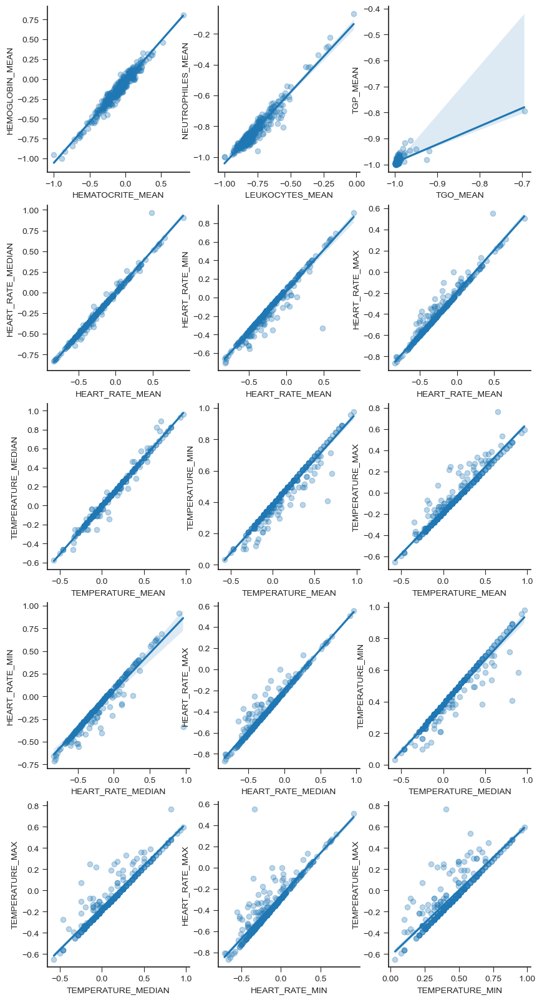

In [64]:
show_multiple_regplots(all_vars, (5, 3), df_without_icu)

- Com estas visualizações, podemos observar a tendência positiva por meio de uma reta, além de sabermos o intervalo de confiança;

- Também temos que notar a baixa variabilidade de ``TGP_MEAN`` e ``TGO_MEAN``... perceba que seus números quase que não se alteram, indicando que provavelmente não são relevantes para o modelo futuro.

##### **Extra: Todas as correlações**

Caso realmente queira saber todas as correlações entre as variáveis, deixarei a matriz destas abaixo (valores arredondados com 2 casas decimais) - Boa sorte para vê-las! D:

In [65]:
show_corr_matrix(clean_df_aux)

,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN
AGE_ABOVE65,1.00,0.87,0.03,0.28,0.05,0.17,0.03,0.31,0.00,0.33
AGE_PERCENTIL,0.87,1.00,0.06,0.29,0.06,0.13,0.01,0.33,-0.04,0.32
GENDER,0.03,0.06,1.00,0.04,-0.00,-0.06,-0.07,-0.02,-0.02,-0.01
DISEASE GROUPING 1,0.28,0.29,0.04,1.00,0.20,0.28,0.02,0.34,0.20,0.49
DISEASE GROUPING 2,0.05,0.06,-0.00,0.20,1.00,0.08,0.11,0.11,-0.03,0.12
DISEASE GROUPING 3,0.17,0.13,-0.06,0.28,0.08,1.00,0.31,0.29,0.28,0.47
DISEASE GROUPING 4,0.03,0.01,-0.07,0.02,0.11,0.31,1.00,0.13,0.17,0.14
DISEASE GROUPING 5,0.31,0.33,-0.02,0.34,0.11,0.29,0.13,1.00,0.13,0.46
DISEASE GROUPING 6,0.00,-0.04,-0.02,0.20,-0.03,0.28,0.17,0.13,1.00,0.22
HTN,0.33,0.32,-0.01,0.49,0.12,0.47,0.14,0.46,0.22,1.00


,IMMUNOCOMPROMISED,OTHER,BE_VENOUS_MEAN,BILLIRUBIN_MEAN,CALCIUM_MEAN,CREATININ_MEAN,GGT_MEAN,GLUCOSE_MEAN,HEMATOCRITE_MEAN,HEMOGLOBIN_MEAN
AGE_ABOVE65,0.17,0.14,0.10,0.02,-0.13,0.12,-0.07,0.08,-0.26,-0.27
AGE_PERCENTIL,0.20,0.15,0.15,0.02,-0.16,0.12,-0.05,0.11,-0.31,-0.32
GENDER,-0.03,0.05,0.02,-0.08,-0.02,-0.21,-0.03,-0.06,-0.25,-0.27
DISEASE GROUPING 1,0.18,0.15,0.10,-0.05,-0.10,0.00,-0.05,0.07,-0.08,-0.10
DISEASE GROUPING 2,0.14,0.07,-0.03,0.00,-0.02,0.17,0.02,0.01,-0.15,-0.16
DISEASE GROUPING 3,0.08,0.14,-0.08,-0.01,-0.03,-0.01,-0.02,0.34,-0.05,-0.06
DISEASE GROUPING 4,0.10,0.06,-0.05,-0.03,0.04,0.07,0.01,0.16,-0.00,-0.02
DISEASE GROUPING 5,0.11,0.15,0.17,-0.06,-0.03,0.02,-0.04,0.07,-0.08,-0.11
DISEASE GROUPING 6,-0.02,0.09,-0.06,-0.02,-0.02,0.01,-0.04,0.03,0.10,0.09
HTN,0.21,0.22,0.09,-0.03,-0.06,0.05,0.07,0.13,-0.06,-0.08


,INR_MEAN,LACTATE_MEAN,LEUKOCYTES_MEAN,LINFOCITOS_MEAN,NEUTROPHILES_MEAN,PC02_VENOUS_MEAN,PCR_MEAN,PH_VENOUS_MEAN,PLATELETS_MEAN,POTASSIUM_MEAN
AGE_ABOVE65,0.15,-0.07,0.00,-0.15,0.03,-0.03,0.07,0.09,-0.16,0.17
AGE_PERCENTIL,0.15,-0.10,0.05,-0.17,0.08,-0.07,0.10,0.11,-0.13,0.21
GENDER,-0.11,0.00,-0.03,0.06,-0.04,-0.06,-0.17,0.03,0.07,-0.14
DISEASE GROUPING 1,0.02,-0.04,0.02,0.00,0.02,0.08,-0.07,-0.05,0.02,0.12
DISEASE GROUPING 2,0.09,-0.00,0.02,0.02,0.02,-0.03,-0.03,-0.00,-0.07,0.07
DISEASE GROUPING 3,-0.01,0.00,-0.02,0.06,-0.04,0.02,0.00,-0.09,-0.02,0.16
DISEASE GROUPING 4,0.13,-0.01,0.03,0.09,0.00,-0.03,0.02,-0.03,-0.02,-0.01
DISEASE GROUPING 5,0.32,0.02,0.01,-0.09,0.03,0.10,0.03,-0.05,-0.05,0.17
DISEASE GROUPING 6,-0.06,0.05,-0.02,0.10,-0.04,0.04,-0.04,-0.10,0.05,-0.04
HTN,0.17,-0.04,0.03,-0.01,0.03,0.07,-0.03,-0.06,-0.02,0.20


,SODIUM_MEAN,TGO_MEAN,TGP_MEAN,TTPA_MEAN,UREA_MEAN,DIMER_MEAN,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN
AGE_ABOVE65,-0.16,0.05,-0.04,-0.04,0.34,0.07,-0.15,0.22,-0.22,0.10
AGE_PERCENTIL,-0.20,0.04,-0.04,-0.03,0.38,0.06,-0.14,0.27,-0.20,0.19
GENDER,0.03,-0.07,-0.15,-0.07,-0.25,0.05,-0.09,-0.06,0.01,-0.11
DISEASE GROUPING 1,-0.08,-0.04,-0.08,-0.06,0.09,-0.01,-0.11,0.11,0.02,0.09
DISEASE GROUPING 2,-0.09,-0.00,-0.02,0.00,0.16,0.05,-0.10,0.03,-0.02,-0.02
DISEASE GROUPING 3,-0.09,-0.02,-0.03,-0.01,0.09,-0.01,0.05,0.14,-0.05,0.05
DISEASE GROUPING 4,0.02,-0.01,-0.00,0.06,0.20,0.03,-0.02,-0.03,-0.03,-0.00
DISEASE GROUPING 5,-0.05,-0.03,-0.05,0.08,0.15,0.11,0.03,0.17,-0.05,0.12
DISEASE GROUPING 6,0.05,-0.03,-0.03,-0.05,0.04,-0.02,0.00,-0.04,-0.01,-0.01
HTN,-0.05,-0.05,-0.06,0.04,0.19,0.07,-0.03,0.20,-0.08,0.12


,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,HEART_RATE_MEDIAN,TEMPERATURE_MEDIAN,HEART_RATE_MIN,TEMPERATURE_MIN,HEART_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_DIFF_REL,NLR,ICU
AGE_ABOVE65,-0.09,-0.11,-0.21,-0.08,-0.23,-0.09,-0.22,-0.08,-0.03,-0.03,0.29
AGE_PERCENTIL,-0.06,-0.13,-0.19,-0.06,-0.20,-0.06,-0.21,-0.06,-0.04,-0.08,0.35
GENDER,-0.14,0.12,0.01,-0.13,-0.02,-0.14,0.02,-0.14,0.03,0.07,-0.12
DISEASE GROUPING 1,-0.04,0.03,0.03,-0.03,-0.02,-0.02,0.03,-0.04,-0.06,0.01,0.07
DISEASE GROUPING 2,-0.01,-0.03,-0.01,-0.01,-0.02,-0.01,-0.02,-0.02,0.10,0.02,0.09
DISEASE GROUPING 3,-0.10,-0.15,-0.05,-0.09,-0.05,-0.09,-0.05,-0.09,0.01,0.06,0.12
DISEASE GROUPING 4,-0.05,0.02,-0.03,-0.05,-0.03,-0.06,-0.04,-0.04,-0.03,0.05,0.11
DISEASE GROUPING 5,-0.04,0.04,-0.04,-0.04,-0.06,-0.02,-0.06,-0.05,-0.10,-0.03,0.12
DISEASE GROUPING 6,-0.05,-0.01,-0.01,-0.05,-0.01,-0.05,-0.01,-0.05,-0.03,0.06,-0.03
HTN,-0.13,-0.04,-0.06,-0.12,-0.11,-0.13,-0.06,-0.11,0.02,0.02,0.18


,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN
GGT_MEAN,-0.07,-0.05,-0.03,-0.05,0.02,-0.02,0.01,-0.04,-0.04,0.07
GLUCOSE_MEAN,0.08,0.11,-0.06,0.07,0.01,0.34,0.16,0.07,0.03,0.13
HEMATOCRITE_MEAN,-0.26,-0.31,-0.25,-0.08,-0.15,-0.05,-0.00,-0.08,0.10,-0.06
HEMOGLOBIN_MEAN,-0.27,-0.32,-0.27,-0.10,-0.16,-0.06,-0.02,-0.11,0.09,-0.08
INR_MEAN,0.15,0.15,-0.11,0.02,0.09,-0.01,0.13,0.32,-0.06,0.17
LACTATE_MEAN,-0.07,-0.10,0.00,-0.04,-0.00,0.00,-0.01,0.02,0.05,-0.04
LEUKOCYTES_MEAN,0.00,0.05,-0.03,0.02,0.02,-0.02,0.03,0.01,-0.02,0.03
LINFOCITOS_MEAN,-0.15,-0.17,0.06,0.00,0.02,0.06,0.09,-0.09,0.10,-0.01
NEUTROPHILES_MEAN,0.03,0.08,-0.04,0.02,0.02,-0.04,0.00,0.03,-0.04,0.03
PC02_VENOUS_MEAN,-0.03,-0.07,-0.06,0.08,-0.03,0.02,-0.03,0.10,0.04,0.07


,IMMUNOCOMPROMISED,OTHER,BE_VENOUS_MEAN,BILLIRUBIN_MEAN,CALCIUM_MEAN,CREATININ_MEAN,GGT_MEAN,GLUCOSE_MEAN,HEMATOCRITE_MEAN,HEMOGLOBIN_MEAN
GGT_MEAN,0.12,0.06,0.04,0.29,-0.00,0.10,1.00,0.01,-0.07,-0.05
GLUCOSE_MEAN,0.06,0.12,0.04,0.04,-0.13,0.02,0.01,1.00,-0.03,-0.02
HEMATOCRITE_MEAN,-0.30,-0.08,-0.04,0.05,0.20,-0.10,-0.07,-0.03,1.00,0.98
HEMOGLOBIN_MEAN,-0.29,-0.07,-0.07,0.08,0.19,-0.11,-0.05,-0.02,0.98,1.00
INR_MEAN,0.10,0.06,0.20,0.12,-0.11,0.03,0.04,-0.02,-0.08,-0.10
LACTATE_MEAN,-0.05,-0.11,-0.28,-0.01,0.20,0.02,-0.09,-0.18,0.16,0.15
LEUKOCYTES_MEAN,-0.09,-0.09,0.07,0.08,-0.02,0.10,0.12,0.01,0.11,0.10
LINFOCITOS_MEAN,-0.08,0.01,-0.01,-0.06,0.16,-0.07,-0.01,-0.07,0.15,0.13
NEUTROPHILES_MEAN,-0.08,-0.10,0.08,0.10,-0.06,0.12,0.13,0.03,0.08,0.07
PC02_VENOUS_MEAN,-0.04,-0.02,0.09,-0.01,0.09,-0.01,-0.11,-0.18,0.05,0.01


,INR_MEAN,LACTATE_MEAN,LEUKOCYTES_MEAN,LINFOCITOS_MEAN,NEUTROPHILES_MEAN,PC02_VENOUS_MEAN,PCR_MEAN,PH_VENOUS_MEAN,PLATELETS_MEAN,POTASSIUM_MEAN
GGT_MEAN,0.04,-0.09,0.12,-0.01,0.13,-0.11,0.26,0.00,0.10,0.05
GLUCOSE_MEAN,-0.02,-0.18,0.01,-0.07,0.03,-0.18,0.06,0.14,-0.07,0.05
HEMATOCRITE_MEAN,-0.08,0.16,0.11,0.15,0.08,0.05,-0.11,-0.12,0.06,0.06
HEMOGLOBIN_MEAN,-0.10,0.15,0.10,0.13,0.07,0.01,-0.09,-0.09,0.05,0.03
INR_MEAN,1.00,0.01,0.08,-0.09,0.11,-0.03,0.05,0.13,-0.01,0.00
LACTATE_MEAN,0.01,1.00,-0.06,0.03,-0.07,0.10,-0.14,-0.19,0.02,-0.05
LEUKOCYTES_MEAN,0.08,-0.06,1.00,0.26,0.96,-0.04,0.23,0.01,0.41,0.20
LINFOCITOS_MEAN,-0.09,0.03,0.26,1.00,0.00,0.09,-0.27,-0.06,0.34,0.09
NEUTROPHILES_MEAN,0.11,-0.07,0.96,0.00,1.00,-0.07,0.32,0.03,0.33,0.17
PC02_VENOUS_MEAN,-0.03,0.10,-0.04,0.09,-0.07,1.00,-0.16,-0.65,0.02,0.05


,SODIUM_MEAN,TGO_MEAN,TGP_MEAN,TTPA_MEAN,UREA_MEAN,DIMER_MEAN,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN
GGT_MEAN,-0.04,0.18,0.14,0.05,0.08,0.02,-0.01,-0.10,0.08,0.04
GLUCOSE_MEAN,-0.14,0.04,0.02,-0.05,0.17,-0.03,0.00,0.03,-0.05,-0.00
HEMATOCRITE_MEAN,0.12,-0.04,0.03,0.02,-0.08,-0.10,0.15,-0.08,0.18,-0.06
HEMOGLOBIN_MEAN,0.08,-0.04,0.05,0.02,-0.09,-0.10,0.17,-0.07,0.17,-0.07
INR_MEAN,-0.01,0.09,0.08,0.43,0.15,0.01,-0.12,-0.08,-0.07,0.01
LACTATE_MEAN,0.11,-0.10,-0.09,0.05,-0.00,0.02,0.05,-0.03,0.02,-0.02
LEUKOCYTES_MEAN,-0.02,0.04,0.11,-0.00,0.16,-0.06,-0.03,0.02,0.19,0.10
LINFOCITOS_MEAN,0.35,-0.09,-0.01,-0.09,-0.06,-0.09,0.09,0.02,-0.02,-0.03
NEUTROPHILES_MEAN,-0.11,0.07,0.12,0.02,0.17,-0.03,-0.06,0.00,0.20,0.11
PC02_VENOUS_MEAN,0.32,-0.11,-0.08,0.05,-0.05,-0.05,0.06,0.09,0.00,-0.03


,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,HEART_RATE_MEDIAN,TEMPERATURE_MEDIAN,HEART_RATE_MIN,TEMPERATURE_MIN,HEART_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_DIFF_REL,NLR,ICU
GGT_MEAN,-0.06,-0.02,0.07,-0.06,0.09,-0.05,0.06,-0.07,-0.05,-0.09,0.08
GLUCOSE_MEAN,-0.03,-0.02,-0.05,-0.04,-0.05,-0.04,-0.05,-0.02,0.01,-0.05,0.16
HEMATOCRITE_MEAN,0.03,0.03,0.18,0.03,0.16,0.01,0.20,0.04,0.04,0.08,-0.10
HEMOGLOBIN_MEAN,0.03,0.03,0.17,0.03,0.15,0.02,0.19,0.05,0.03,0.08,-0.11
INR_MEAN,0.00,0.01,-0.07,0.01,-0.06,-0.01,-0.08,0.01,-0.06,-0.04,0.17
LACTATE_MEAN,-0.09,-0.01,0.02,-0.08,0.01,-0.07,0.02,-0.10,-0.01,0.12,-0.21
LEUKOCYTES_MEAN,-0.05,-0.01,0.19,-0.04,0.19,-0.04,0.18,-0.07,0.02,-0.17,0.12
LINFOCITOS_MEAN,-0.17,0.06,-0.02,-0.16,-0.01,-0.16,-0.02,-0.18,-0.09,0.14,-0.17
NEUTROPHILES_MEAN,0.00,-0.03,0.20,0.01,0.20,0.01,0.20,-0.01,0.04,-0.21,0.17
PC02_VENOUS_MEAN,-0.07,0.01,-0.00,-0.07,0.01,-0.07,0.00,-0.06,-0.01,0.17,-0.16


,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN
TGP_MEAN,-0.04,-0.04,-0.15,-0.08,-0.02,-0.03,-0.00,-0.05,-0.03,-0.06
TTPA_MEAN,-0.04,-0.03,-0.07,-0.06,0.00,-0.01,0.06,0.08,-0.05,0.04
UREA_MEAN,0.34,0.38,-0.25,0.09,0.16,0.09,0.20,0.15,0.04,0.19
DIMER_MEAN,0.07,0.06,0.05,-0.01,0.05,-0.01,0.03,0.11,-0.02,0.07
BLOODPRESSURE_DIASTOLIC_MEAN,-0.15,-0.14,-0.09,-0.11,-0.10,0.05,-0.02,0.03,0.00,-0.03
BLOODPRESSURE_SISTOLIC_MEAN,0.22,0.27,-0.06,0.11,0.03,0.14,-0.03,0.17,-0.04,0.20
HEART_RATE_MEAN,-0.22,-0.20,0.01,0.02,-0.02,-0.05,-0.03,-0.05,-0.01,-0.08
RESPIRATORY_RATE_MEAN,0.10,0.19,-0.11,0.09,-0.02,0.05,-0.00,0.12,-0.01,0.12
TEMPERATURE_MEAN,-0.09,-0.06,-0.14,-0.04,-0.01,-0.10,-0.05,-0.04,-0.05,-0.13
OXYGEN_SATURATION_MEAN,-0.11,-0.13,0.12,0.03,-0.03,-0.15,0.02,0.04,-0.01,-0.04


,IMMUNOCOMPROMISED,OTHER,BE_VENOUS_MEAN,BILLIRUBIN_MEAN,CALCIUM_MEAN,CREATININ_MEAN,GGT_MEAN,GLUCOSE_MEAN,HEMATOCRITE_MEAN,HEMOGLOBIN_MEAN
TGP_MEAN,0.12,-0.02,0.14,0.24,-0.09,-0.00,0.14,0.02,0.03,0.05
TTPA_MEAN,0.06,0.06,-0.06,0.14,-0.04,0.03,0.05,-0.05,0.02,0.02
UREA_MEAN,0.11,0.05,0.10,0.11,-0.08,0.45,0.08,0.17,-0.08,-0.09
DIMER_MEAN,0.01,0.02,-0.00,-0.03,-0.13,0.00,0.02,-0.03,-0.10,-0.10
BLOODPRESSURE_DIASTOLIC_MEAN,-0.10,-0.03,0.07,-0.04,0.14,-0.06,-0.01,0.00,0.15,0.17
BLOODPRESSURE_SISTOLIC_MEAN,-0.05,0.05,0.08,-0.10,-0.03,0.06,-0.10,0.03,-0.08,-0.07
HEART_RATE_MEAN,0.01,-0.10,-0.03,0.12,0.12,-0.06,0.08,-0.05,0.18,0.17
RESPIRATORY_RATE_MEAN,0.06,0.02,0.06,-0.01,-0.06,0.02,0.04,-0.00,-0.06,-0.07
TEMPERATURE_MEAN,0.01,-0.06,0.04,-0.02,-0.10,-0.04,-0.06,-0.03,0.03,0.03
OXYGEN_SATURATION_MEAN,-0.02,-0.05,0.04,0.01,0.09,-0.03,-0.02,-0.02,0.03,0.03


,INR_MEAN,LACTATE_MEAN,LEUKOCYTES_MEAN,LINFOCITOS_MEAN,NEUTROPHILES_MEAN,PC02_VENOUS_MEAN,PCR_MEAN,PH_VENOUS_MEAN,PLATELETS_MEAN,POTASSIUM_MEAN
TGP_MEAN,0.08,-0.09,0.11,-0.01,0.12,-0.08,0.08,0.17,0.06,-0.11
TTPA_MEAN,0.43,0.05,-0.00,-0.09,0.02,0.05,0.06,-0.07,0.02,0.02
UREA_MEAN,0.15,-0.00,0.16,-0.06,0.17,-0.05,0.12,0.03,-0.11,0.21
DIMER_MEAN,0.01,0.02,-0.06,-0.09,-0.03,-0.05,0.03,0.05,-0.07,0.00
BLOODPRESSURE_DIASTOLIC_MEAN,-0.12,0.05,-0.03,0.09,-0.06,0.06,0.04,-0.02,0.12,-0.03
BLOODPRESSURE_SISTOLIC_MEAN,-0.08,-0.03,0.02,0.02,0.00,0.09,0.05,-0.03,0.05,0.06
HEART_RATE_MEAN,-0.07,0.02,0.19,-0.02,0.20,0.00,0.09,-0.07,0.07,0.03
RESPIRATORY_RATE_MEAN,0.01,-0.02,0.10,-0.03,0.11,-0.03,0.17,0.04,0.02,0.09
TEMPERATURE_MEAN,0.00,-0.09,-0.05,-0.17,0.00,-0.07,0.18,0.12,-0.12,-0.11
OXYGEN_SATURATION_MEAN,0.01,-0.01,-0.01,0.06,-0.03,0.01,-0.12,-0.03,0.03,-0.00


,SODIUM_MEAN,TGO_MEAN,TGP_MEAN,TTPA_MEAN,UREA_MEAN,DIMER_MEAN,BLOODPRESSURE_DIASTOLIC_MEAN,BLOODPRESSURE_SISTOLIC_MEAN,HEART_RATE_MEAN,RESPIRATORY_RATE_MEAN
TGP_MEAN,0.06,0.81,1.00,-0.05,0.11,-0.05,0.00,-0.03,-0.05,-0.01
TTPA_MEAN,-0.06,-0.05,-0.05,1.00,-0.01,-0.07,0.02,-0.03,0.02,0.02
UREA_MEAN,-0.10,0.08,0.11,-0.01,1.00,0.09,-0.15,-0.02,-0.06,0.13
DIMER_MEAN,-0.08,-0.01,-0.05,-0.07,0.09,1.00,-0.12,-0.08,-0.02,0.02
BLOODPRESSURE_DIASTOLIC_MEAN,0.07,-0.08,0.00,0.02,-0.15,-0.12,1.00,0.55,0.11,0.02
BLOODPRESSURE_SISTOLIC_MEAN,0.00,-0.09,-0.03,-0.03,-0.02,-0.08,0.55,1.00,-0.02,0.19
HEART_RATE_MEAN,-0.03,-0.04,-0.05,0.02,-0.06,-0.02,0.11,-0.02,1.00,0.16
RESPIRATORY_RATE_MEAN,-0.11,0.01,-0.01,0.02,0.13,0.02,0.02,0.19,0.16,1.00
TEMPERATURE_MEAN,-0.09,0.02,-0.01,0.03,-0.13,0.01,-0.02,-0.00,0.27,0.13
OXYGEN_SATURATION_MEAN,0.05,0.01,0.03,0.01,-0.02,0.02,-0.11,-0.20,-0.17,-0.29


,TEMPERATURE_MEAN,OXYGEN_SATURATION_MEAN,HEART_RATE_MEDIAN,TEMPERATURE_MEDIAN,HEART_RATE_MIN,TEMPERATURE_MIN,HEART_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_DIFF_REL,NLR,ICU
TGP_MEAN,-0.01,0.03,-0.05,-0.01,-0.05,0.00,-0.04,-0.00,-0.02,-0.06,0.01
TTPA_MEAN,0.03,0.01,0.00,0.04,0.03,-0.02,0.02,0.06,0.06,-0.03,0.04
UREA_MEAN,-0.13,-0.02,-0.06,-0.13,-0.05,-0.13,-0.07,-0.13,0.05,-0.09,0.25
DIMER_MEAN,0.01,0.02,-0.01,0.02,-0.01,-0.00,-0.02,0.01,0.07,-0.03,0.03
BLOODPRESSURE_DIASTOLIC_MEAN,-0.02,-0.11,0.11,-0.02,0.10,-0.01,0.11,-0.05,-0.05,0.05,-0.20
BLOODPRESSURE_SISTOLIC_MEAN,-0.00,-0.20,-0.02,0.01,-0.03,0.00,-0.02,-0.02,0.03,0.05,0.08
HEART_RATE_MEAN,0.27,-0.17,0.99,0.26,0.97,0.27,0.98,0.25,-0.03,-0.08,-0.05
RESPIRATORY_RATE_MEAN,0.13,-0.29,0.15,0.13,0.17,0.14,0.14,0.12,-0.02,-0.09,0.21
TEMPERATURE_MEAN,1.00,-0.21,0.26,0.99,0.26,0.97,0.26,0.97,0.04,-0.11,0.09
OXYGEN_SATURATION_MEAN,-0.21,1.00,-0.17,-0.20,-0.19,-0.21,-0.15,-0.20,-0.03,0.08,-0.15


---
# **7. MACHINE LEARNING**

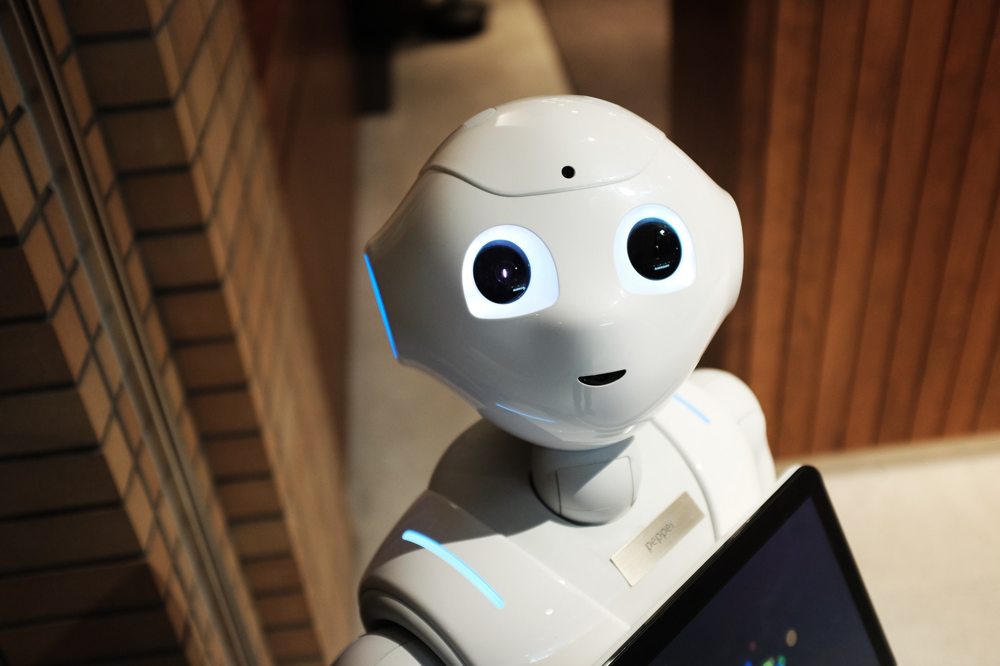

In [66]:
ml_df = clean_df_aux.copy()
ml_df.head()

,AGE_ABOVE65,AGE_PERCENTIL,GENDER,DISEASE GROUPING 1,DISEASE GROUPING 2,DISEASE GROUPING 3,DISEASE GROUPING 4,DISEASE GROUPING 5,DISEASE GROUPING 6,HTN,...,OXYGEN_SATURATION_MEAN,HEART_RATE_MEDIAN,TEMPERATURE_MEDIAN,HEART_RATE_MIN,TEMPERATURE_MIN,HEART_RATE_MAX,TEMPERATURE_MAX,OXYGEN_SATURATION_DIFF_REL,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,,,,,,,,,,,,,,,
0,1,6,0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,...,0.736842,-0.283019,-0.285714,-0.162393,0.208791,-0.432836,-0.420290,-1.000000,0.402205,1
2,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.935673,-0.056604,0.357143,-0.111111,0.604396,0.000000,0.101449,-0.961262,0.345092,1
3,0,4,1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.684211,-0.528302,-0.285714,-0.384615,0.208791,-0.626866,-0.420290,-1.000000,0.400939,0
4,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.868421,0.160377,0.285714,0.196581,0.538462,-0.044776,0.072464,-0.980333,0.438918,0
5,0,1,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.815789,-0.537736,-0.196429,-0.401709,0.252747,-0.626866,-0.333333,-0.980129,0.579625,0


## **7.1. Explicação resumida**

Em resumo, o que acontece é que o computador consegue, a partir de funções matemáticas (algoritmos), encontrar padrões para enfim, prever as futuras entradas. 

Existem dois métodos que são mais utilizados para o aprendizado de máquina, sendo eles o Supervisionado e o Não Supervisionado. A diferença entre estes é que um utiliza uma saída desejada na predição e o outro descobre essa saída por si só, respectivamente. 

Neste *notebook* focarei no **Aprendizado Supervisionado**, já que temos uma variável alvo, aquela que diz se a pessoa vai para a UTI ou não. Aprofundando ainda mais nesse método de aprendizado, temos os modelos de Regressão e de Classificação:

-  Modelos de Regressão: aqui tentamos prever um valor contínuo, como o preço de uma casa por exemplo;

- **Modelos de Classificação**: aqui tentamos prever uma classe, como por exemplo, o nosso próprio problema (admissão de UTI ou não).

Para treinarmos o nosso modelo de *Machine Learning*, precisamos antes seguir um passoa-a-passo, e é isso que será tratado nas próximas seções.

## **7.2. Feature Selection**

Nesta primeira etapa, selecionamos quais as **variáveis importantes** para os nossos algoritmos futuros. Ela é muito importante pois evita que o aprendizado fique muito "atrelado a certas condições" (***overfitting***), não reconhecendo a previsão certa para as futuras entradas mais abrangentes.

Exemplificando o que é o *overfitting*, seria como um reconhecimento de um cão: saber a característica de que o pelo dele é bem macio pode ser uma restrição somente de uma determinada raça, e caso não tenha essa característica em específico, ou seja, se o algoritmo a levar muito em consideração, ele pode apontar que **não é um cachorro**. O mais ideal é saber **se tem pelos, e não se tem pelos macios**!

E você deve estar se perguntando, "**mas já não fizemos isso?**"

A resposta é sim, fizemos uma parte dela na seção 6.4.2, como as *features* que dizem a "mesma coisa" (`MEDIAN`, `MIN` e `MAX`), além de retirar as `DIFF`'s, pois a maioria apresentava valores únicos.

Entretanto, acho que é possível diminuir ainda mais, utilizando técnicas como o **Boruta**.

### **7.2.1. Wrapped Method (Boruta)**

Este algoritmo consiste nos seguintes passos:

1. Criar *shadow features* (cópia) das originais e randomizar cada item da coluna;

2. Aplicar algum algoritmo de avaliação, como por exemplo a *feature importances* da *Random Forest*;

3. Selecionar o maior *score* das *shadow features* e compará-lo com o de todas as colunas originais. A idéia é que se determinada coluna tem um valor maior que algo aleatório, então ela é significativa (1), caso contrário, não é (0);

4. Iteramos os procedimentos 1, 2 e 3, $n$ vezes;

5. No final teremos um dataframe com  linhas preenchidas com 0 ou 1. O passo final é verificar se a contagem de 1 nas colunas é significante, ou seja, conferindo em uma distribuição binomial ($n = n$ e $p = 0.5$) se:

    - $P(X \geq x) < 0.05$: feature é significativa;
    
    - $P(X \leq x) < 0.05$: feature não é significativa.

6. Retorna as colunas significativas e não significativas.

Mas antes disso, precisamos dividir em treino e teste o nosso *DataFrame*.

### **7.2.2. Dividindo nas variáveis independentes e dependente**

In [67]:
# Dividindo o nosso DataFrame em X e y
X = ml_df.drop('ICU', axis=1).values
                 
y = ml_df['ICU'].values

In [68]:
# Dividindo os dados em treino e teste apenas para usar o Boruta
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=42)

### **7.2.3. Aplicando o Boruta**

In [69]:
# Definindo a random forest para o score
rf = RandomForestClassifier(n_jobs=-1)
rf.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1)

In [70]:
# Definindo Boruta e treinando
boruta = BorutaPy(rf, n_estimators='auto', random_state=42)
boruta.fit(X_train, y_train)

BorutaPy(estimator=RandomForestClassifier(n_estimators=44, n_jobs=-1,
                                          random_state=RandomState(MT19937) at 0x1D7530D5240),
         n_estimators='auto',
         random_state=RandomState(MT19937) at 0x1D7530D5240)

In [71]:
# Colunas selecionadas pelo Boruta
cols_selected = boruta.support_.tolist()
cols_selected_boruta = ml_df.drop('ICU', axis=1)\
                       .iloc[:, cols_selected]\
                       .columns.tolist()

print('Features selecionadas pelo Boruta:')
print(cols_selected_boruta)

Features selecionadas pelo Boruta:
['AGE_PERCENTIL', 'LINFOCITOS_MEAN', 'NEUTROPHILES_MEAN', 'PCR_MEAN', 'SODIUM_MEAN', 'UREA_MEAN', 'BLOODPRESSURE_DIASTOLIC_MEAN', 'RESPIRATORY_RATE_MEAN', 'NLR']


Perceba que na seção 6.4.3 vimos que as variáveis ``SODIUM_MEAN``, ``RESPIRATORY_RATE_MEAN``, ``BLOODPRESSURE_DIASTOLIC_MEAN`` e ``PCR_MEAN`` possuíam a maior diferença de médias, quando comparamos se a pessoa iria precisar de UTI ou não. Isso significa que, a nossa visão inferencial a partir da média estava parcialmente correta, pois houveram outras variáveis que o modelo conseguiu ver como importante.

Além disso, na seção 6.4.6 tinhamos a dúvida de qual ``AGE`` escolheríamos, além das diferente medidas de ``HEART_RATE`` e ``TEMPERATURE``. O algoritmo decidiu retirá-las do modelo, sendo assim, para:

- ``AGE``: o ideal foi utilizar ``AGE_PERCENTIL``;

- ``HEART_RATE`` e ``TEMPERATURE``: elas não eram importantes para a classificação.

Ao final desse processo todo, diminuímos consideravelmente o número de variáveis!

In [72]:
# DataFrame de acordo com o Boruta + ICU
cols_selected_boruta.append('ICU')

ml_df_aux = ml_df[cols_selected_boruta]
ml_df_aux.head()

,AGE_PERCENTIL,LINFOCITOS_MEAN,NEUTROPHILES_MEAN,PCR_MEAN,SODIUM_MEAN,UREA_MEAN,BLOODPRESSURE_DIASTOLIC_MEAN,RESPIRATORY_RATE_MEAN,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,,,,
0,6,-0.914938,-0.868747,-0.875236,-0.028571,-0.836145,0.086420,-0.593220,0.402205,1
2,1,-0.908714,-0.412965,-0.939887,0.085714,-0.836145,-0.489712,-0.645951,0.345092,1
3,4,-0.836100,-0.784714,-0.503592,0.200000,-0.937349,0.012346,-0.457627,0.400939,0
4,1,-0.641079,-0.812725,-0.990926,0.142857,-0.903614,0.333333,-0.593220,0.438918,0
5,1,-0.340249,-0.846339,-0.997732,0.085714,-0.884337,-0.037037,-0.525424,0.579625,0


In [73]:
# Quantidade de colunas que removemos
actual_number_of_cols = ml_df_aux.shape[1]
number_of_removed_cols = old_number_of_cols - actual_number_of_cols
old_number_of_cols = actual_number_of_cols

print(f'Foram removidas {number_of_removed_cols} colunas.')
print(f'Agora, estamos com {actual_number_of_cols} colunas em nosso DataFrame.')

Foram removidas 41 colunas.
Agora, estamos com 10 colunas em nosso DataFrame.


Para entender melhor cada uma das variáveis escolhidas pelo Boruta, fiz uma pesquisa no Google para entender melhor o porquê do algoritmo ter escolhido determinadas variáveis:

- **``PCR_MEAN``**: "O teste de PCR-RT ("reação de transcriptase reversa seguida de reação em cadeia da polimerase") é um exame que atua detectando o **material genético do vírus**. Ele apresenta resultados confiáveis, sendo o exame de escolha para **doentes que estejam com sintomas compatíveis com covid-19**". **Obs:** Não consegui achar alguma informação relacionada a admissão de UTI e este teste;

- **`RESPIRATORY_RATE_MEAN`**: A COVID-19 infecta o sistema respiratório, podendo causar **dispnéia** (dificuldade de respiração). Sendo assim, provavelmente esta variável está relacionada a este fato;

- **``NEUTROPHILES_MEAN`` e ``LINFOCITOS_MEAN``**: "a **NLR (*Neutrophiles/Linfocitos Rate*)** é um fator de risco independente para mortalidade intra-hospitalar, especialmente em **homens**, para os quais o **risco de mortalidade aumenta em 10% para cada acréscimo de unidade da NLR**. É importante considerar que esse estudo apresenta limitações importantes, no entanto, a NLR pode ser uma ferramenta útil para estimar a **morbimortalidade de pacientes com COVID-19**";

- **``UREA_MEAN``**: O número de pessoas que se queixam da persistência de alguns sintomas e também de doenças novas aumenta cada vez mais, entre eles o surgimento de **Insuficiência Renal Aguda (IRA)**.Pesquisas apontam que, aproximadamente, 9% dos infectados por Covid-19 desenvolvem Insuficiência Renal, com esse número chegando a **23% em pacientes internados em Unidade de Terapia Intensiva (UTI)**;

- **``BLOODPRESSURE_DIASTOLIC_MEAN``**: A Covid-19 é nova e ainda há muito o que se entender sobre o vírus e suas consequências no organismo. Segundo a cardiologista Lucélia Magalhães, presidente do Departamento de Hipertensão Arterial (DHA) da SBC, há várias ligações entre a pressão arterial e a Covid-19. Uma delas é o dado epidemiológico inicial: em 2020 ficou claro que a **hipertensão arterial foi o fator de risco mais importante para a morte de pacientes com Covid-19**.

- **``AGE_PERCENTIL``**: Pesquisa realizada pelo SindHosp – Sindicato dos Hospitais, Clínicas e Laboratórios do Estado de São Paulo apurou que 60% dos hospitais privados paulistas da amostra consultada informam que **a faixa etária mais frequente dos pacientes internados por Covid-19 em leitos de UTI está acima dos 70 anos**. **Também na internação em leitos clínicos para COVID em 52% dos hospitais os pacientes têm mais de 70 anos**.

- **`SODIUM_MEAN`**: “Um estudo da *Journal of Clinical Endocrinology & Metabolism da Endocrine Society* mostrou que, pela primeira vez, pacientes com Covid-19 e **baixo teor de sódio têm duas vezes mais probabilidade de precisar de intubação ou outros meios de suporte respiratório avançado do que aqueles com sódio normal**.”

Vou deixar os *links* dessas informações abaixo:

- [Teste PCR](https://www.coronavirus.saude.mg.gov.br/blog/70-pcr-rt-para-coronavirus);

- [NLR](https://www.einstein.br/Documentos%20Compartilhados/Neutrofilo_Linfocito-Ratio_Mortalidade.pdf);

- [Dificuldades para respirar](https://gooutside.com.br/quando-a-falta-de-ar-e-um-sintoma-de-covid-19/);

- [Artigo sobre a IRA](https://www.materdei.com.br/fique-por-dentro-imprensa/insuficiencia-renal-aumenta-em-pacientes-pos-infeccao-por-coronavirus);

- [Hipertensão e COVID-19](https://www.vidaeacao.com.br/covid-19-favorece-hipertensao-arterial-e-doencas-cronicas/);

- [Média de sódio no sangue](http://www.sertao24horas.com.br/2021/02/27/covid-19-niveis-anormais-de-sodio-no-sangue-apontam-riscos-para-internados/);

- [Idade e COVID-19](https://medicinasa.com.br/uti-covid-idade/).

Essa pesquisa foi muito importante, porque assim conseguimos entender quais as relações das variáveis independentes para o nosso futuro modelo! 

Além disso, é possível criarmos uma nova feature chamada `NLR`, na qual representa o fator de risco independente para a mortalidade intra-hospitalar, como citado acima. 

**Obs.:** A `NLR` foi criada na etapa de **pré-processamento**, justamente para deixar no mesmo formato das outras variáveis (range de -1 a 1) e assim, manter as mesmas regras. É importante fazer esta variável no começo pois no meio do caminho, deletamos MUITOS dados, e alguns pacientes também!

### **7.2.4. Deletando Neutrófilos e Linfócitos**

Ao invés de usar as duas medidas `NEUTROPHILES_MEAN` e `LINFOCITOS_MEAN`, com o objetivo de diminuir a multicolinearidade, só utilizarei a `NLR`.

In [74]:
# Deletando as 2 variáveis que a compõe
ml_df_aux.drop(['NEUTROPHILES_MEAN', 'LINFOCITOS_MEAN'], axis=1, inplace=True)
ml_df_aux.head()

,AGE_PERCENTIL,PCR_MEAN,SODIUM_MEAN,UREA_MEAN,BLOODPRESSURE_DIASTOLIC_MEAN,RESPIRATORY_RATE_MEAN,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,,
0,6,-0.875236,-0.028571,-0.836145,0.086420,-0.593220,0.402205,1
2,1,-0.939887,0.085714,-0.836145,-0.489712,-0.645951,0.345092,1
3,4,-0.503592,0.200000,-0.937349,0.012346,-0.457627,0.400939,0
4,1,-0.990926,0.142857,-0.903614,0.333333,-0.593220,0.438918,0
5,1,-0.997732,0.085714,-0.884337,-0.037037,-0.525424,0.579625,0


Agora que excluímos essas duas features, o Boruta pode alterar seu resultado, e portanto, devemos rodá-lo novamente. Mas antes de reaplicar o Boruta, não temos noção de como estão distribuídas todas as variáveis e se elas possuem alguma tendência linear nos gráficos dois a dois. Para isso, vou utilizar o `pairplot` do `seaborn` e ver essas distribuições.

### **7.2.5. Pairplots**

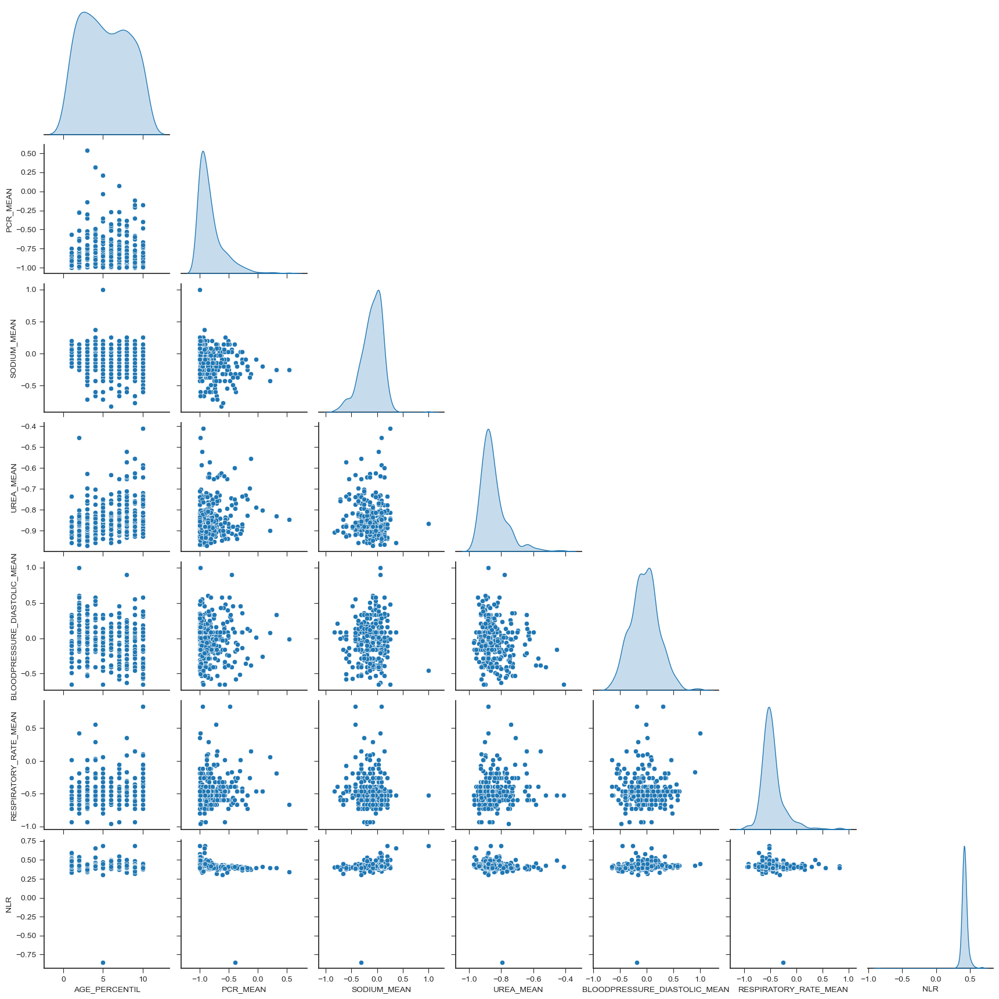

In [75]:
# Tendo uma idéia da distribuição de todas as variáveis 2 a 2
sns.pairplot(ml_df_aux.drop('ICU', axis=1), diag_kind='kde', corner=True);

Perceba que temos um *outlier* muito estranho na nova variável!

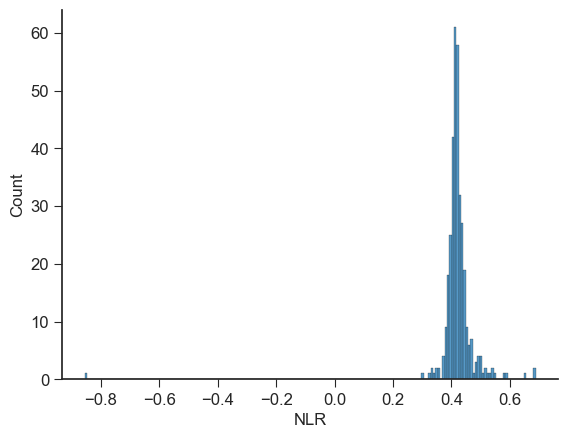

In [76]:
# Histograma da nova variável
histplot(ml_df_aux['NLR'], 'NLR', 'Count')

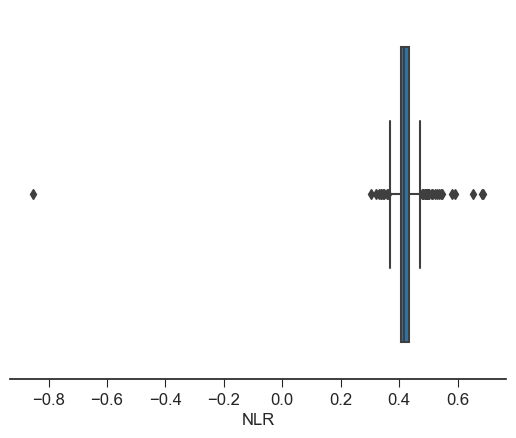

In [77]:
# Boxplot da nova variável
boxplot(ml_df_aux['NLR'], 'NLR')

Sendo assim, como é apenas um paciente, vou retirá-lo dessa análise.

In [78]:
# Como existe apenas um outlier próximo ao -10, vou retirá-lo da análise
ml_df_aux = ml_df_aux[ml_df_aux['NLR'] > -0.8]

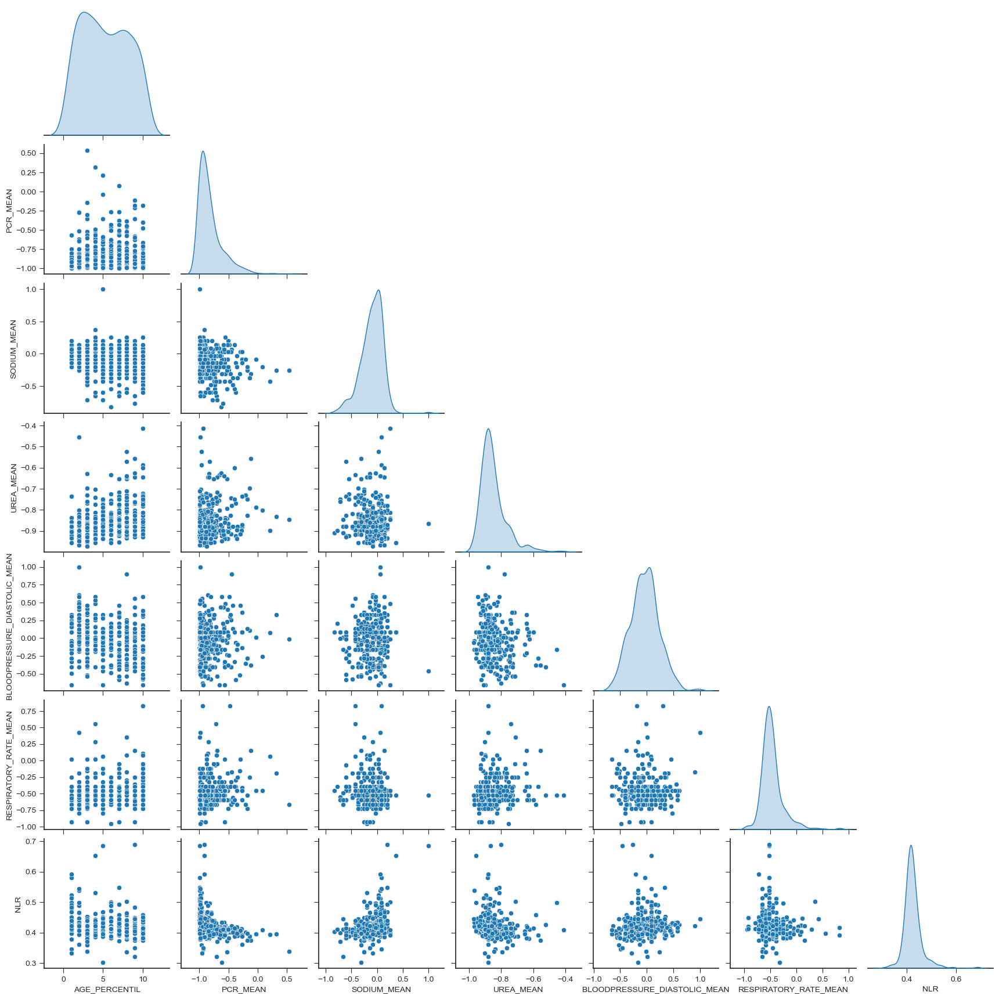

In [79]:
# Tendo uma idéia da distribuição de todas as variáveis 2 a 2
sns.pairplot(ml_df_aux.drop('ICU', axis=1), diag_kind='kde', corner=True);

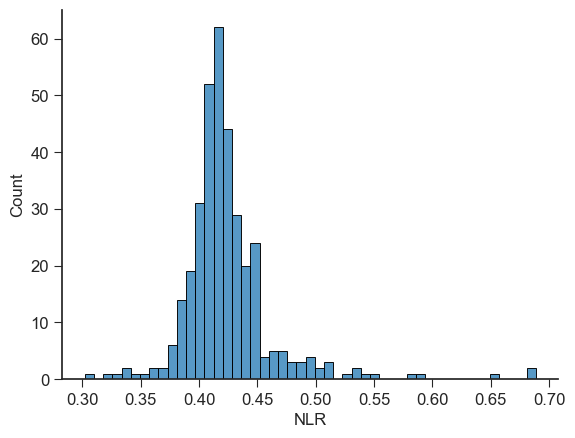

In [80]:
# Histograma da nova variável
histplot(ml_df_aux['NLR'], 'NLR', 'Count')

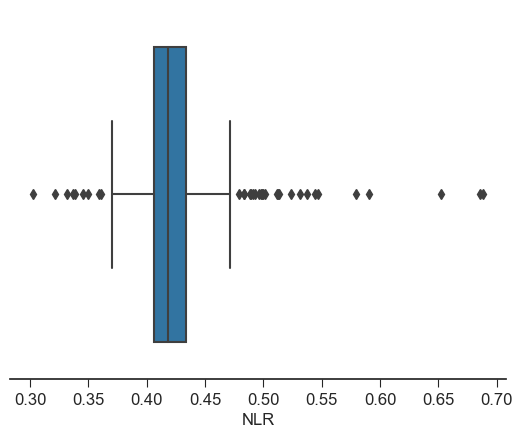

In [81]:
# Histograma da nova variável
boxplot(ml_df_aux['NLR'], 'NLR')

Bem melhor! Vamos ver agora como estão distribuídos esses dados separados por `ICU`.

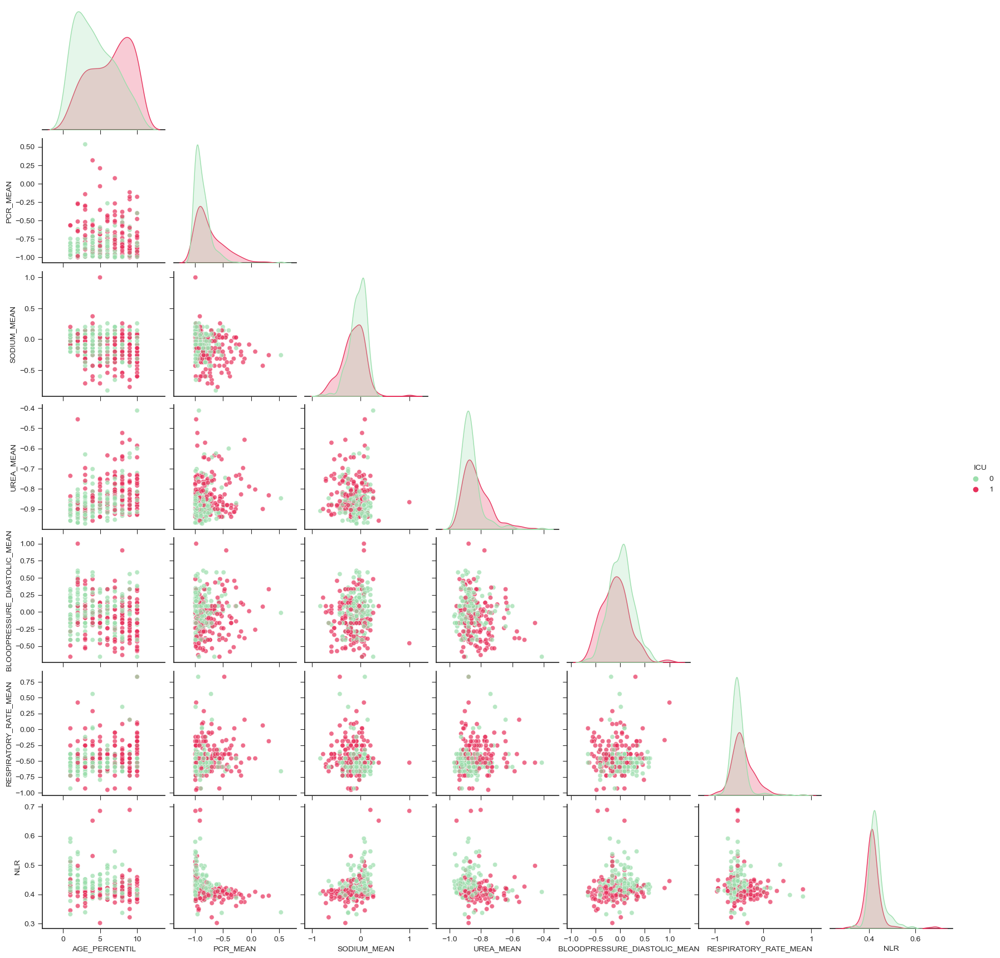

In [82]:
# Tendo uma idéia da distribuição de todas as variáveis 2 a 2 por ICU
sns.pairplot(ml_df_aux, corner=True, hue='ICU', plot_kws={'alpha':0.7}, 
             palette=['#9bdeac', '#e7305b']);

Perceba que não existe tanta diferença entre as distribuições de `ICU` de cada variável, apenas na `AGE_PERCENTIL` que as distribuições ficam bem diferentes. De modo geral, a única coisa que fica muito aparente é a maior concentração em certas faixas de valores quando a pessoa não precisa de UTI, já quando ela precisa, os dados são mais dispersos, em grande parte das variáveis.

Apesar de não observarmos diferenças significativas em suas distribuições, conseguimos observar distinções entre as duas classes quando combinamos variáveis duas a duas, pois parece que os pontos razoavelmente se separam, considerando o `ICU`, o que é muito bom para a modelagem!

Enfim, vamos reaplicar o Boruta e ver se ainda essas variáveis continuam sendo relevantes.

### **7.2.6. Reaplicando o Boruta**

In [83]:
# Dividindo o nosso DataFrame em X e y
X = ml_df_aux.drop('ICU', axis=1).values
                 
y = ml_df_aux['ICU'].values

In [84]:
# Dividindo os dados em treino e teste apenas para usar o Boruta
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=42)

In [85]:
# Definindo a random forest para o score
rf = RandomForestClassifier(n_jobs=-1)
rf.fit(X_train, y_train)

RandomForestClassifier(n_jobs=-1)

In [86]:
# Definindo Boruta e treinando
boruta = BorutaPy(rf, n_estimators='auto', random_state=42)
boruta.fit(X_train, y_train)

BorutaPy(estimator=RandomForestClassifier(n_estimators=37, n_jobs=-1,
                                          random_state=RandomState(MT19937) at 0x1D7536A5740),
         n_estimators='auto',
         random_state=RandomState(MT19937) at 0x1D7536A5740)

In [87]:
# Colunas selecionadas pelo Boruta
cols_selected = boruta.support_.tolist()
cols_selected_boruta = ml_df_aux.drop('ICU', axis=1)\
                       .iloc[:, cols_selected]\
                       .columns.tolist()

print('Features selecionadas pelo Boruta:')
print(cols_selected_boruta)

Features selecionadas pelo Boruta:
['AGE_PERCENTIL', 'PCR_MEAN', 'UREA_MEAN', 'BLOODPRESSURE_DIASTOLIC_MEAN', 'RESPIRATORY_RATE_MEAN', 'NLR']


In [88]:
cols_selected_boruta.append('ICU')
final_df = ml_df_aux[cols_selected_boruta]
final_df.head()

,AGE_PERCENTIL,PCR_MEAN,UREA_MEAN,BLOODPRESSURE_DIASTOLIC_MEAN,RESPIRATORY_RATE_MEAN,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,
0,6,-0.875236,-0.836145,0.086420,-0.593220,0.402205,1
2,1,-0.939887,-0.836145,-0.489712,-0.645951,0.345092,1
3,4,-0.503592,-0.937349,0.012346,-0.457627,0.400939,0
4,1,-0.990926,-0.903614,0.333333,-0.593220,0.438918,0
5,1,-0.997732,-0.884337,-0.037037,-0.525424,0.579625,0


Houve a exclusão de mais uma variável, a `SODIUM_MEAN`. Bom, apesar das minhas pesquisas no Google dizerem que ela tem sua importância, vou confiar no Boruta e continuar assim mesmo. É possível que eu esteja excluindo uma variável boa, mas é um risco que estou assumindo. Em compensação, diminuí muito a complexidade do nosso conjunto de dados, sendo um ótimo fato para as nossas modelagens futuras!

In [89]:
# Quantidade de colunas que removemos
actual_number_of_cols = final_df.shape[1]
number_of_removed_cols = old_number_of_cols - actual_number_of_cols
old_number_of_cols = actual_number_of_cols

print(f'Foram removidas {number_of_removed_cols} colunas.')
print(f'Agora, estamos com {actual_number_of_cols} colunas em nosso DataFrame.')

Foram removidas 3 colunas.
Agora, estamos com 7 colunas em nosso DataFrame.


## **7.3. Rescaling**

Antes de ir para a modelagem, vamos apenas fazer o *rescaling* de ``AGE_PERCENTIL``, isto poque a escala desta variável é muito diferente das outras, entre -1 a 1. Para isso, vou colocar a ``AGE_PERCENTIL``na mesma escala que as outras variáveis.

**Obs. 1:** O ``MinMaxScaler`` coloca os dados na escala de 0 a 1, porém é possível configurá-lo e deixar de -1 a 1 (igual as outras) utilizando a fórmula abaixo:

$$novo \ valor = \frac{[valor - min(coluna)]}{[max(coluna) - min(coluna)]} \times [max(i) - min(i)] + min(i)$$

Em que $i$ é o **intervalo desejado**.

**Obs. 2:** Já foi feito a rescala da `NLR` bem no começo (pré-processamento), sendo assim, não preciso me preocupar com isso, além de que, ele sofreu os mesmos pré-processos que as outras features, não tendo preocupações quanto a vazamento de dados para a validação ou para o conjunto de teste.

**Obs. 3:** Todas as variáveis estavam com a escala entre -1 a 1 no começo, porém como excluímos vários dados de vários pacientes, esses extremos podem acabar não existindo em qualquer variável!

In [90]:
# Definindo o Scaler
scaler = MinMaxScaler(feature_range=(-1, 1))

# Transformando o AGE_PERCENTIL com o Scaler
final_df['AGE_PERCENTIL'] = scaler.fit_transform(final_df[['AGE_PERCENTIL']])

In [91]:
# DataFrame final
final_df.head()

,AGE_PERCENTIL,PCR_MEAN,UREA_MEAN,BLOODPRESSURE_DIASTOLIC_MEAN,RESPIRATORY_RATE_MEAN,NLR,ICU
PATIENT_VISIT_IDENTIFIER,,,,,,,
0,0.111111,-0.875236,-0.836145,0.086420,-0.593220,0.402205,1
2,-1.000000,-0.939887,-0.836145,-0.489712,-0.645951,0.345092,1
3,-0.333333,-0.503592,-0.937349,0.012346,-0.457627,0.400939,0
4,-1.000000,-0.990926,-0.903614,0.333333,-0.593220,0.438918,0
5,-1.000000,-0.997732,-0.884337,-0.037037,-0.525424,0.579625,0


Beleza, antes de irmos para a parte de treino e teste dos modelos, acho que o ideal é dar uma **explicada breve** em alguns conceitos como:

- **Modelos de *Machine Learning* que irei utilizar**;

- **Métricas para avaliação**;

- ***Cross-Validation***;

- **Intervalo de Confiança**.

## **7.4. Explicação dos modelos**

### **7.4.1. Naive-Bayes**

O funcionamento deste algoritmo se dá pelo uso do **Teorema de Bayes**:

$$P(A|B) = \frac{P(B|A) \times P(A)}{P(B)}$$

Basicamente, o **A** seria a nossa variável *target* (y) quando ela é igual a uma determinada label, e o **B** todas as variáveis independentes (X) de cada linha (amostra).

O Naive-Bayes funciona na base da comparação, então é comparado a probabilidade de A = "classe m" dado que B acontece, com m variando entre todas as *labels* de A, no nosso caso, seriam 0 e 1.

No final, a maior probabilidade de A equivalente a uma determinada *label* (**n**) dado B, irá ser a nossa predição final, ou seja, **y predito = n**.

Para mais informações, acesse [esse vídeo](https://www.youtube.com/watch?v=Bk2mSIMw_XE).

### **7.4.2. Logistic Regression**

O modelo de Regressão Logística é utilizado para descrever uma variável quantitativa como algo classificatório (binário). O método utiliza a probabililidade de ocorrer tal valor (quantitativo), sendo assim, se for uma probabilidade menor que 50% (conseguimos mudar esse parâmetro), então ele classifica como "não possível" (0), já se for acima, como "possível" (1).



A função que ela utiliza é a **sigmoid**, com a fórmula abaixo:

$$\sigma(t) = \frac{e^t}{e^t + 1} = \frac{1}{1 + e^{-t}}$$

Dado uma função linear *t*, temos: 

$$t = \beta_0 + \beta_1x$$

Então:

$$p(x) = \sigma(t) = \frac{1}{1 + e^{-(\beta_0 + \beta_1x)}}$$

Vai um exemplo abaixo:

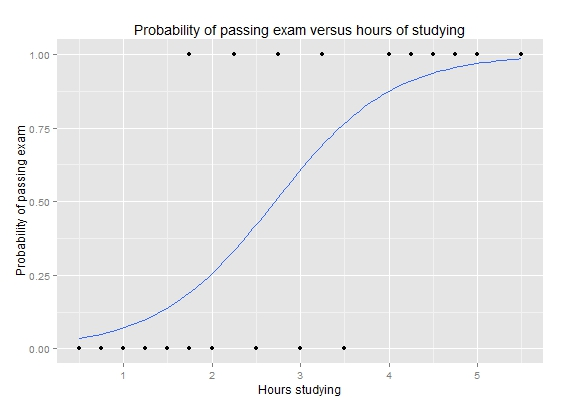

Fonte da imagem acima: [Wikipedia](https://en.wikipedia.org/wiki/Logistic_regression).

A função t pode ter várias variáveis independentes, com seus determinados pesos. Ela é facilmente descoberta com algoritmos no python (`sklearn`), então não precisamos nos atentar com as exigências matemáticas.

### **7.4.3. Decision Tree Classifier**

Esse algoritmo tenta dividir o nosso treinamento a partir de determinadas condições (*labels* das variáveis independentes), então é como se fosse uma "árvore" se dividindo em várias possibilidades (eventos aleatórios).

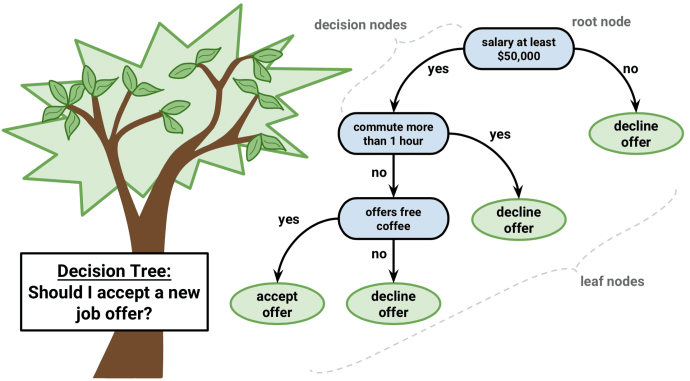

Fonte da imagem acima: [Este link](https://medium.datadriveninvestor.com/decision-trees-lesson-101-f00dad6cba21?gi=b3431d9a04b5).

Para saber como essa Árvore é montada, existe um critério de impureza (divisão) dos ramos chamado de "**Gini**". Este índice mede o grau ou a **probabilidade de uma determinada variável ser classificada erroneamente quando escolhida aleatoriamente**.

Mas o que realmente significa "impureza"? Se todos os elementos pertencerem a uma única classe, ela pode ser chamada de pura. O grau do índice de Gini varia entre 0 e 1, onde 0 denota que todos os elementos pertencem a uma determinada classe ou se existe apenas uma classe, e 1 denota que os elementos estão distribuídos aleatoriamente em várias classes. Um índice de Gini de 0,5 denota elementos igualmente distribuídos em algumas classes.

$$Gini = 1 - \sum_{i=1}^{n}(p_i)^2$$

Onde $p_i$ é a probabilidade de um objeto ser classificado em uma determinada classe.

**Quanto maior for o índice de Gini, mais as variáveis vão ficando significativas e portanto, vão se estabelecendo nos nós mais relevantes de nossa Árvore (primordiais)**. O inverso acontece para os índices menores.

### **7.4.4. Random Forest Classifier**

Esse algoritmo utiliza Árvores de Decisão por baixo dos panos. Na verdade, ela usa uma técnica chamada ***Ensemble Learning***, o qual testa vários algoritmos (iguais ou diferentes, no nosso caso são várias árvores diferenciadas entre si) com amostras e colunas distintas (randomizadas).

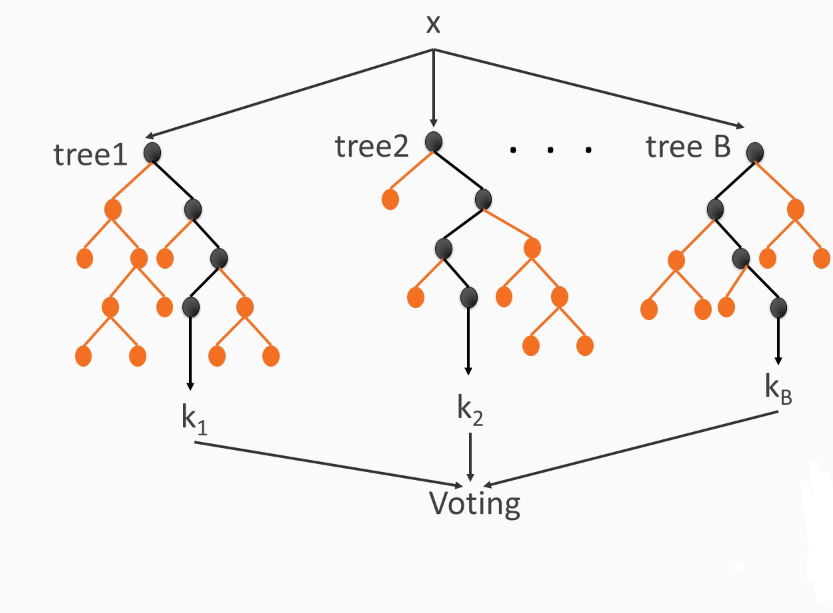

Fonte da imagem acima: [Este link](https://subscription.packtpub.com/book/big_data_and_business_intelligence/9781789539462/2/ch02lvl1sec14/random-forests).

No final, se a **maioria** das árvores apresentar resultados nas predições iguais a 1, por exemplo, então a **predição final** vai ser igual a 1. É esse o funcionamento por trás da *random forest*, de forma intuitiva.

## **7.5. Como avaliar os modelos**

Bom, dada a seleção de alguns algoritmos, o ideal é compará-los através de algumas medidas. Vou listar a explicação delas aqui em baixo.

### **7.5.1. Confusion Matrix**

É a tabela em que separamos os valores que são preditos (colunas), de acordo com os dados de teste reais (linhas), vai uma figura explicativa:

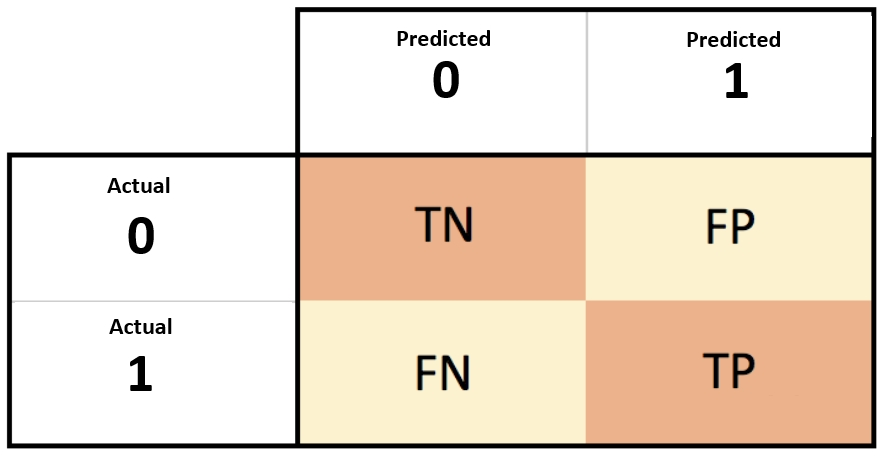

Fonte da imagem acima: [Este link](https://towardsdatascience.com/demystifying-confusion-matrix-29f3037b0cfa).

  - ***True Negative (TN)* ou Verdadeiros Negativos (VN)**: valores reais iguais a **0** e que **foram** preditas corretamente;

  - ***False Positive (FP)* ou Falsos Positivos (FP)**: valores reais iguais a **0** e que **não foram** preditas corretamente;

  - ***False Negative (FN)* ou Falsos Negativos (FN)**: valores reais iguais a **1** e que **não foram** preditas corretamente;

  - ***True Positive (TP)* ou Verdadeiros Positivos (VP)**: valores reais iguais a **1** e que **foram** preditas corretamente;

Todas as métricas da próxima seção são baseadas nesta matriz de confusão!

### **7.5.2. Métricas comparativas**

- ***Accuracy***: dentre todas as classificações, quantas o modelo classificou corretamente. É utilizado mais para ter uma performance geral:

$$Accuracy = \frac{TP + TN}{TP + TN + FP + FN}$$

- ***Precision***: dentre todas as **classificações que o modelo fez**, quantas de **classe 1** estão corretas. É usado em situações em que o **FP é mais prejudicial que FN**:

$$Precision = \frac{TP}{TP + FP}$$

- ***Recall* ou *Sensitivity***: dentre todas as **situações reais**, quantas de **classe 1** o modelo acertou. É usado em situações em que o **FN é mais prejudicial que FP**:

$$Recall = \frac{TP}{TP + FN}$$

- ***F1-Score***: é a média harmônica entre *precision* e *recall*. Mas basicamente, ela é **sensível a valores muito pequenos**, tanto da primeira medida quanto da segunda:

$$F1 Score = 2 * \frac{Precision * Recall}{Precision + Recall}$$

- ***AUC***: é a probabilidade de que um exemplo positivo aleatório seja pontuado acima de um exemplo negativo aleatório. Então **quanto maior a taxa de TP (taxa de TP comparado com os valores reais) em relação a taxa de FP (taxa de FP comparado com os valores reais), maior tende a ser o AUC**. Também existe a **curva ROC**, que explica melhor essa situação, e a AUC é a área abaixo desta curva:

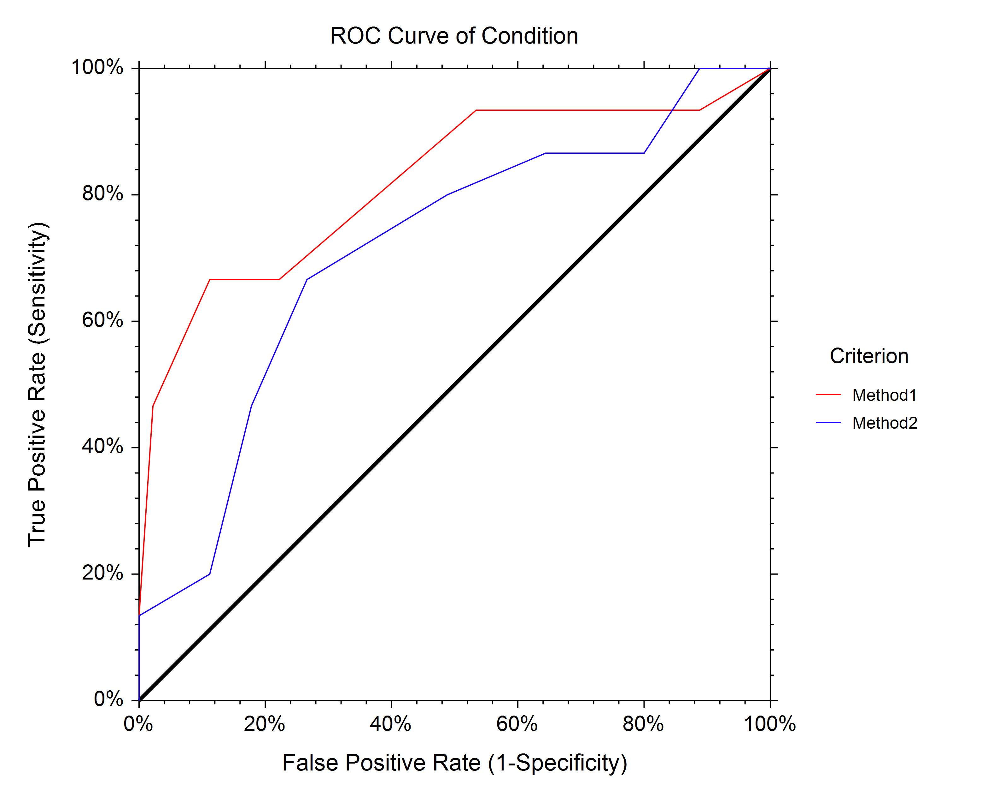

Fonte da imagem acima: [Este link](https://www.ncss.com/software/ncss/nonparametric-analysis-in-ncss/).

No gráfico, pode-se concluir que o "Method1" possui um melhor aprendizado.

**Obs.:** *Specificity* tem como significado: "**quanto dos casos reais iguais a 0 foram acertados pelo modelo?**" Vai a fórmula abaixo, para calculá-lo.

$$Specificity = \frac{TN}{TN + FP}$$

## **7.6. O que é Cross-Validation?**

O *Cross-Validation* **diminui o fator da aleatoriedade** nos modelos, ao selecionar partes para treino e teste. O que eu quero dizer com isso?

A idéia é simples. Se estamos dividindo o nosso conjunto de dados em 80% para treino e 20% para teste, por exemplo, quais partes estamos pegando para fazer essa repartição? Se pegarmos o começo do nosso *DataFrame* para teste, o resultado seria o mesmo se pegássemos o final? É disso que se trata a aleatoriedade.

Os *scores* provavelmente não seriam os mesmos, mas tenderiam a valores próximos! Neste caso, o ideal é pegarmos um valor que tende para o centro, ou seja, a média ou mediana de todos os *scores*. Sendo assim, o procedimento, de forma mais detalhada, seria o seguinte:

1. De acordo com o estimador (existem vários), será feito uma divisão do *DataFrame* em k blocos (*folds*);

2. Treinamento com os k-1 blocos e teste com apenas 1 deles;

3. Iteração deste, variando entre os k blocos. Em cada rodada, será coletada uma métrica para comparar todas as iterações;

4. No final, tiramos a média destas métricas, resultando em um valor mais representativo.


Aqui vai uma imagem ilustrativa dos processos de 1 a 3:

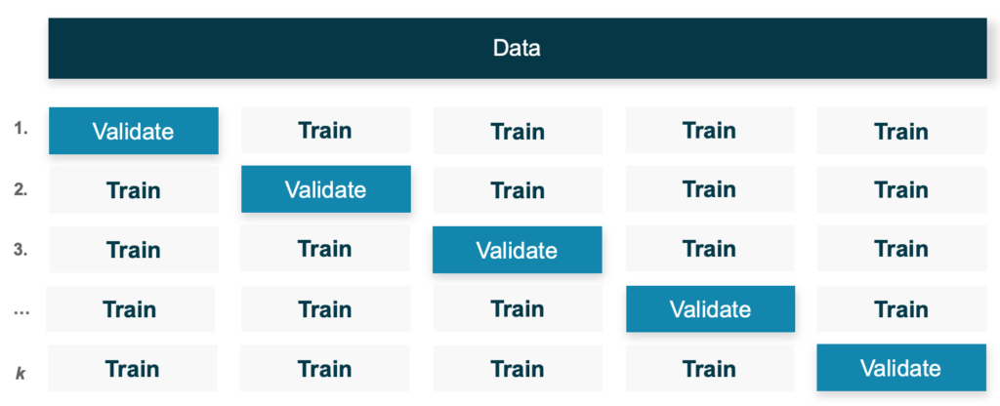

Fonte da imagem acima: [Este link](https://www.statworx.com/de/blog/evaluating-model-performance-by-building-cross-validation-from-scratch/).

**Obs.:** o estimador que irá ser utilizado se chama **`RepeatedStratifiedKFold()`**. Nele diminuímos ainda mais o fator aleatório, pois ele segue as seguintes etapas:

1. Validação cruzada padrão, de início, porém com os dados estratificados, ou seja, os dados de treino e teste são divididos na mesma porcentagem de *target* (y);

2. Após o término da primeira validação, é embaralhado o *DataFrame*, e repetido o mesmo processo n vezes (quantidade definida pelo usuário do código).

Diminuir o fator aleatório, ainda mais neste *Dataset*, em que possui **poucas linhas**, é de extrema importância!

## **7.7. Intervalo de Confiança**

Assumindo que os nossos dados sigam uma **distribuição normal**, temos então que, dada uma média de um conjunto de dados, conseguimos inferir um certo **intervalo de confiança** com o própio **desvios padrão**. 

Em outras palavaras, os valores contínuos de uma determinada variável podem cair dentro deste intervalo, com um **nível de confiabilidade estatístico**. Veja a figura abaixo para entender melhor.

**Obs.:** Interpretando melhor esta confiabilidade, é como se a cada 100 amostras aleatórias desta variável, 95 caem dentro deste intervalo, as outras 5 não.

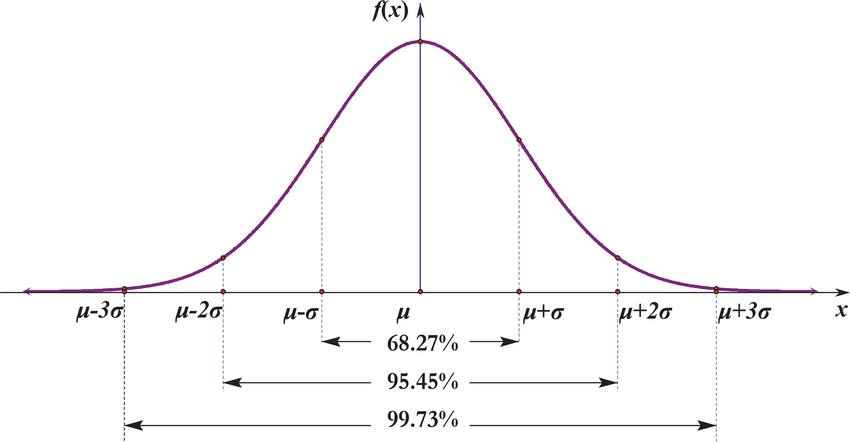

Fonte da imagem acima: [Este link](https://www.researchgate.net/figure/The-confidence-intervals-correspond-to-3-sigma-rule-of-the-normal-distribution_fig3_273955667).

A fórmula para se calcular o intervalo de confiança, em uma distribuição normal, é dada por:

$$CI = \mu \pm n \times \sigma$$

Em que:

- $CI$:  "*confidence interval*", ou intervalo de confiança;
- $\mu$: média da amostra;
- $n$: quantidade de desvios padrões;
- $\sigma$: desvio padrão. 

**Observações:** 

- Normalmente, a probabilidade utilizada nos intervalos de confiança de uma distribuição normal é de **95%**, ou seja, um $n$ igual a **2**;

- Em nosso caso, estou calculando o intervalo de confiança porque existem poucas amostras (linhas), dando a possibilidade do nosso algoritmo estar enviesado pela aleatoriedade!

## **7.8. Qual o meu objetivo com todos esses conceitos?**

Você deve estar se perguntando, depois de tantas definições, **como essas coisas serão usadas?** Então deixarei abaixo uma descrição da minha metodologia para se descobrir qual o melhor modelo de *Machine Learning* (dentre os citados):

1. **Criação dos modelos** com os parâmetros padrões da biblioteca ``sklearn``;

2. ***Cross-validation* com o ``RepeatedStratifiedKFold()`` (5 *folds*, ou blocos, e 10 embaralhamentos do *DataFrame*) em todos os algoritmos**, para inferir a **média** e os **intervalos de confiança (confiabilidade de 95%)** da/o:

  - ***Accuracy***;
  
  - ***Precision***;

  - ***Recall***;

  - ***AUC***;

  - ***F1-Score***.

3. Descobrir o melhor modelo avaliando essas métricas. Caso os resultados fiquem extremamente próximos entre determinados modelos, o desempate será feito no ***tuning* de hiperparâmetros** (explicado nas próximas seções deste *notebook*).

## **7.9. Vamos colocar tudo em prática**

In [92]:
# Dividindo o nosso DataFrame em X e y (agora com as 9 colunas)
X = final_df.drop('ICU', axis=1).values
                 
y = final_df['ICU'].values

### **7.9.1. Definindo os modelos**

In [93]:
# Naive-Bayes
nb = GaussianNB()

# Logistic Regression
lr = LogisticRegression()

# Decision Tree Classifier
dt = DecisionTreeClassifier()

# Random Forest Classifier
rf = RandomForestClassifier()

### **7.9.2. Avaliando as métricas**

In [94]:
models = [nb, lr, dt, rf]
metrics = ['accuracy', 'precision', 'recall', 'roc_auc', 'f1']

for metric in metrics:
    show_ml_metrics_results(models, X, y, 5, 10, metric)
    print('\n')

Score selected: accuracy


,CI min,Final score (mean),CI max
Model,,,
RandomForestClassifier,0.649539,0.734427,0.819314
GaussianNB,0.637036,0.733087,0.829137
LogisticRegression,0.626363,0.714567,0.802772
DecisionTreeClassifier,0.574036,0.657280,0.740524




Score selected: precision


,CI min,Final score (mean),CI max
Model,,,
GaussianNB,0.641405,0.773807,0.906209
LogisticRegression,0.592527,0.713823,0.835118
RandomForestClassifier,0.611540,0.711535,0.811530
DecisionTreeClassifier,0.524360,0.637112,0.749865




Score selected: recall


,CI min,Final score (mean),CI max
Model,,,
RandomForestClassifier,0.556870,0.719754,0.882638
LogisticRegression,0.505721,0.643182,0.780643
DecisionTreeClassifier,0.438201,0.617538,0.796874
GaussianNB,0.444002,0.597027,0.750051




Score selected: roc_auc


,CI min,Final score (mean),CI max
Model,,,
GaussianNB,0.704833,0.799996,0.895160
RandomForestClassifier,0.706028,0.794730,0.883433
LogisticRegression,0.677939,0.776746,0.875554
DecisionTreeClassifier,0.571187,0.654622,0.738058




Score selected: f1


,CI min,Final score (mean),CI max
Model,,,
RandomForestClassifier,0.610024,0.712971,0.815918
LogisticRegression,0.567954,0.674424,0.780893
GaussianNB,0.540562,0.672069,0.803577
DecisionTreeClassifier,0.519177,0.622297,0.725417


O melhor modelo sem dúvidas é a ***Random Forest Classifier***! Isto porque, no nosso caso, queremos saber mais sobre as 3 últimas medidas:

- ***Recall*** é muito importante ser maior, pois os FN pesam muito mais que os FP, ou seja, as **pessoas que não são preditas como UTI = Sim e na verdade deveriam ser, podem literalmente estar morrendo por conta do nosso algoritmo!** É uma medida que precisamos tomar muito cuidado! Nesse quesito, o IC e a média desta medida foram **melhores no *Random Forest***!;

- ***AUC*** é importante porque conseguimos saber a performance dos modelos, e nisso a ***Random Forest*** se saiu pior que o *Naive-Bayes* porém muito próximo, na média;

- ***F1-Score*** é legal ser alto, pois isso indica que a ***precision* e a *recall* não estão variando muito entre si**. A ***Random Forest*** ganha também aqui.

**Observação:** No nosso caso em específico, ***precision* alta quer dizer que estaríamos necessitando de mais UTI, e entretanto, na realidade, isso não é uma urgência**. Sendo assim, não é tão ruim errar esta medida, comparado com a *recall*, mas é legal a *precision* não estar tão baixa, já que em certas situações, isso pode causar a má gerência da quantidade de leitos no hospital. 

Apesar de já descobrirmos o melhor modelo, ainda conseguimos retirar uma informação importante da Regressão Logística, que é o **impacto de cada variável na chance da pessoa precisar de UTI no futuro**.

Não vou entrar muito nos detalhes matemáticos, mas basicamente a chance de um indivíduo precisar de UTI é multiplicada por $e^{\beta{i}}$, em que $\beta{i}$ é o coeficiente de alguma variável $i$ na regressão logística.

Para ver estes coeficientes e suas significâncias, vou modelar utilizando a biblioteca ``statsmodels``.

In [95]:
# Modelo + fit dos dados com statsmodels
log_reg = sm.Logit(y, X).fit()

Optimization terminated successfully.
         Current function value: 0.568660
         Iterations 6


In [96]:
# Sumário dos resultados
display(log_reg.summary())

<class 'statsmodels.iolib.summary.Summary'>
"""
                           Logit Regression Results                           
==============================================================================
Dep. Variable:                      y   No. Observations:                  351
Model:                          Logit   Df Residuals:                      345
Method:                           MLE   Df Model:                            5
Date:                Fri, 06 Jan 2023   Pseudo R-squ.:                  0.1761
Time:                        14:02:26   Log-Likelihood:                -199.60
converged:                       True   LL-Null:                       -242.26
Covariance Type:            nonrobust   LLR p-value:                 6.478e-17
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
x1             1.1353      0.202      5.617      0.000       0.739       1.531
x2             2.9585      0.691      4.280      0.000       1.604       4.313
x3            -0.7600      1.176     -0.646      0.518      -3.065       1.545
x4            -1.7337      0.486     -3.565      0.000      -2.687      -0.781
x5             1.2029      0.622      1.934      0.053      -0.016       2.422
x6             5.0007      2.606      1.919      0.055      -0.108      10.109
==============================================================================
"""

In [97]:
print('x1, x2, x3, x4, x5 e x6 correspondem a, respectivamente:')
print(list(final_df.columns))

x1, x2, x3, x4, x5 e x6 correspondem a, respectivamente:
['AGE_PERCENTIL', 'PCR_MEAN', 'UREA_MEAN', 'BLOODPRESSURE_DIASTOLIC_MEAN', 'RESPIRATORY_RATE_MEAN', 'NLR', 'ICU']


Ao nível de significância de 5%, temos que os coeficientes que são estatisticamente relevantes são **x1**, **x2** e **x4** ($valor-p < 0.05$). Estas variáveis correspondem respectivamente aos seguintes betas:

- $\beta_{\text{AGE_PERCENTIL}} = 1.14$
- $\beta_{\text{PCR_MEAN}} = 2.96$
- $\beta_{\text{BLOODPRESSURE_DIASTOLIC_MEAN}} = -1.73$

E a variável que tem mais importância para a Regressão Logística é a ``PCR_MEAN``, indicando que, quando é aumentado em uma unidade nesta variável, a chance da pessoa precisar de UTI é aumentada em **$e^{2.96} \approx 20$ vezes**! O análogo acontece com ``AGE_PERCENTIL`` e ``BLOODPRESSURE_DIASTOLIC_MEAN``, considerando seus betas.

Acredito eu que, para a *feature importances* da *Random Forest*, estas variáveis vão ser muito importantes para o modelo também.

In [98]:
# Random Forest Classifier
rf = RandomForestClassifier(random_state=42, n_jobs=1)

# Fittando os dados na random forest
rf.fit(X, y)

RandomForestClassifier(n_jobs=1, random_state=42)

In [99]:
# Criando o DataFrame com as features e seus scores
features = final_df.iloc[:, :-1].columns
scores = rf.feature_importances_

feature_scores = {'Feature' : features,
                  'Score' : scores}

feature_scores = pd.DataFrame(feature_scores)
feature_scores.sort_values('Score', ascending=False, 
                           ignore_index=True, inplace=True)
feature_scores.head()

,Feature,Score
0,PCR_MEAN,0.205421
1,NLR,0.183530
2,RESPIRATORY_RATE_MEAN,0.165677
3,UREA_MEAN,0.156411
4,AGE_PERCENTIL,0.148647


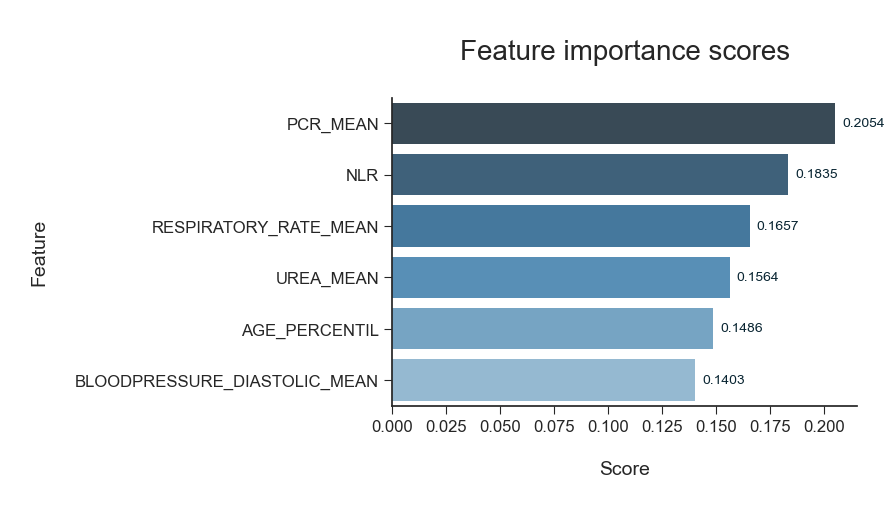

In [100]:
show_barplot(x='Score', y='Feature', df=feature_scores,
             title='Feature importance scores')

Okay, não foi exatamente o que eu esperava, ``BLOODPRESSURE_DIASTOLIC_MEAN``, ``AGE_PERCENTIL`` e ``UREA_MEAN`` não aparecem no topo em importância para a *Random Forest*, entretanto, vemos que a **``PCR_MEAN`` foi a mais importante nos dois modelos**!

Fazer esta comparação é muito rico, pois juntamos informações a respeito das nossas covariáveis com dois modelos diferentes, um linear e outro não-linear!

Bom, mas e agora, o que fazemos depois que descobrimos qual o melhor modelo que se ajusta em nossos dados? Simples, o melhoramos ainda mais!

O processo de otimizar o algoritmo é chamado de ***tuning* dos hiperparâmetros**, e vamos tentar achar quais são estes, por meio de uma função chamada **`GridSearchCV()`**, do `sklearn`.

## **7.10. Tuning de hiperparâmetros**

Este processo basicamente irá **variar alguns parâmetros da nossa *Random Forest***, com o objetivo de **melhorar um dos *scores* já mencionados**. Essa variação é por conta própria, ou seja, o próprio cientista deve selecionar alguns valores para esses argumentos do modelo. O objetivo é obter um conjunto que apresente uma performance boa.

A **experimentação** é a palavra-chave que define essa etapa. Entretanto, é muito difícil testar todos os argumentos existentes com todas as possíveis combinações de valores. Isso porque o **gasto computacional é extremamente alto**, dependendo da quantidade de itens utilizados... Devemos ter ciência disso e não sair testando milhões de números.

Enfim, o procedimento é descrito como na figura abaixo: 

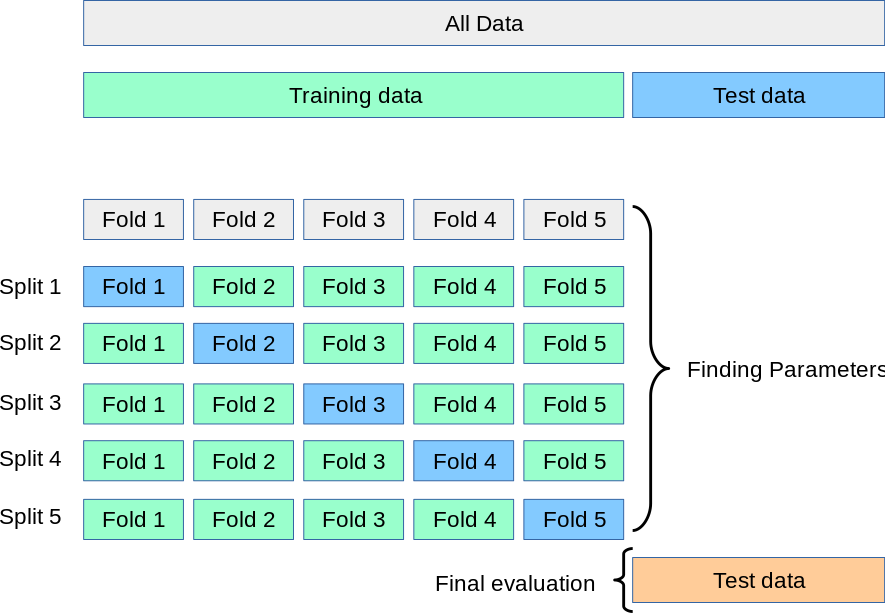

Fonte da imagem acima: [sklearn](https://scikit-learn.org/stable/modules/cross_validation.html).

Aqui vai uma explicação do esquema:

1. **Divisão dos dados em treino e teste;**

2. **Utilização da *cross-validation* nos dados de treino e com cada possível combinação de hiperparâmetros**, tentando atingir o melhor resultado (alguma das métricas de 7.5.2). Dessa forma conseguimos ter uma idéia de qual o melhor valor para se utilizar;

3. **Teste final com dados nunca vistos** (aqueles que foram divididos no processo 1).

> **->** E qual vai ser o nosso passo-a-passo?

> Primeiramente quero ter mais certeza nos meus resultados, **diminuindo o fator de aleatoriedade**. Portanto, após a divisão dos dados de treino e validação final, optarei por um *cross-validation* com o mesmo estimador que foi utilizado em 7.9.2, o **``RepeatedStratifiedKFold()``**, realizando os experimentos com diferentes combinações de hiperparâmetros.

> Após modelar com a *cross-validation*, irei ver o *score* médio para aquela determinada floresta. O meu método de seleção de modelos irá se basear no **maior *score* de validação e em segundo lugar, no maior *score* médio de treinamento**. Isso porque a validação diz respeito a dados nunca vistos, portanto eles possuem um peso maior em minha decisão, já no treinamento médio, é importante que ele não fique baixo também. 

> Para finalizar e ter certeza do melhor modelo, irei ver como se comporta os gráficos dos hiperparâmetros em relação aos scores, ver se conseguimos um "ponto ótimo" com os dados do *CV* e de validação final.

**Obs.:** Há uma **quantidade extremamente baixa de linhas** no nosso *DataFrame*, e se fôssemos dividí-lo como o sugerido:

- A primeira vez para separar em treino (80%) e teste (20%);

- A segunda para separar os dados de treinamento nos k *folds* e realizar o *cross-validation*, ou seja, temos $0.8 \times \frac{k-1}{k}$ do total de dados para treinar e $0.8 \times \frac{1}{k}$ para validar cada *fold*, em $n$ iterações diferentes (`RepeatedStratifiedKFold()`).

Sendo assim, o ideal é aumentar a nossa amostra para este tipo de técnica, porém como não temos mais recursos, seguiremos dessa forma.

> **->** Okay, mas qual vai ser a nossa métrica alvo?

> A resposta é simples, aquela que apresentou um baixo desempenho na seção passada e, além disso, é de extrema importância para a nossa estratégia de negócio: a ***recall***;

> **->** Quais os hiperparâmetros que vamos variar?

> - **`n_estimators`**: número de árvores de decisão na "floresta";

> - **`max_features`**: número máximo de *features* consideradas para dividir apenas um nó das árvores.

> **->** Por que estes?

> Pois mexer no **`n_estimators` é o que dá mais resultado na *Random Forest***, afinal, aumentamos ou diminuímos a nossa gama de árvores (possibilidades de criação) e, assim, impactando no resultado final do modelo. 

> Já se reduzirmos as **`max_features`** por nó, **poderemos encontrar muitas árvores que são bem diferentes das atuais**, modificando, até que bem, o nosso resultado final.

Sendo assim, vamos experimentar os seguintes valores:

- `n_estimators`: 50 até 1000, pulando de 50 em 50;

- `max_features`: de 1 a 3.

Além disso, na documentação da `sklearn`, a `max_features` tem valor igual a "`auto`", por padrão. Este significa que ele pega a raiz quadrada da quantidade de features (7), e assim, o máximo de variáveis por nó irá ser **3** (arredondando). A partir dessa informação, quis testar de baixo para cima essas quantidades máximas. Bom, vamos ver no que dá!

**Observações:** 

- Mais informações sobre os hiperparâmetros e seus valores na documentação da biblioteca [`sklearn`](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html);

- O número total de *recall*'s médios no final vai ser de $20 \times 3 = 60$ (**20** `n_estimators` e **3** `max_features`).

In [101]:
# Dividindo os dados em treino e teste
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=42)

# Redefinindo a floresta
rf = RandomForestClassifier(random_state=42)

In [102]:
# Revendo os resultados apenas para os dados de treino
models = [rf]
metrics = ['recall']

for metric in metrics:
    show_ml_metrics_results(models, X_train, y_train, 5, 10, metric)

Score selected: recall


,CI min,Final score (mean),CI max
Model,,,
RandomForestClassifier,0.504452,0.704900,0.905348


Eu resolvi observar quanto o mesmo processo feito na seção 7.9.2 retorna de resultado para a *Random Forest* padrão do ``sklearn``, utilizando agora **somente os dados de treino**. Perceba que a média diminuiu, pois antes estavamos usando mais dados. Mas enfim, essa média servirá de comparação para a nosso *tuning*, ou seja, nosso *tuning* com o *cross-validation* deve trazer, pelo menos, um *recall* médio maior que este!

In [103]:
# Setando os parâmetros que iremos utilizar
n_estimators_list = np.arange(50, 1050, 50)
max_features_list = np.arange(1, 4, 1)

param_grid = {'n_estimators' : n_estimators_list,
              'max_features' : max_features_list}

# Definindo o cross-validation que eu quero
cv = RepeatedStratifiedKFold(n_splits=5, n_repeats=10)

# Instanciando o GridSearchCV
grid = GridSearchCV(estimator=rf, param_grid=param_grid, cv=cv,
                    scoring='recall', n_jobs=-1)

In [104]:
# Aplicando a validação e descobrindo quais são
# os melhores valores para os nossos hiperparâmetros
grid.fit(X_train, y_train)

GridSearchCV(cv=RepeatedStratifiedKFold(n_repeats=10, n_splits=5, random_state=None),
             estimator=RandomForestClassifier(random_state=42), n_jobs=-1,
             param_grid={'max_features': array([1, 2, 3]),
                         'n_estimators': array([  50,  100,  150,  200,  250,  300,  350,  400,  450,  500,  550,
        600,  650,  700,  750,  800,  850,  900,  950, 1000])},
             scoring='recall')

In [105]:
# DataFrame com os resultados do GridSearchCV
models_scores = pd.DataFrame(grid.cv_results_)[['param_max_features', 
                                                'param_n_estimators', 
                                                'mean_test_score']]
models_scores.head()

,param_max_features,param_n_estimators,mean_test_score
0,1,50,0.696581
1,1,100,0.720684
2,1,150,0.719943
3,1,200,0.720513
4,1,250,0.722849


In [106]:
# Realizando a validação final de cada modelo
validation_recall_list = []

for max_feature in max_features_list:
    for n_estimator in n_estimators_list:
        rf_aux = RandomForestClassifier(random_state=42,
                                        n_estimators=n_estimator,
                                        max_features=max_feature)
        rf_aux.fit(X_train, y_train)
        y_pred = rf_aux.predict(X_test)
        validation_recall = m.recall_score(y_test, y_pred)
        validation_recall_list.append(validation_recall)

models_scores['validation_score'] = validation_recall_list

In [107]:
# Métricas sorteadas de acordo com os dados de validação e a média do CV
models_scores = models_scores\
                .sort_values(['validation_score', 'mean_test_score'], 
                             ascending=False)\
                .reset_index(drop=True)
models_scores.head(10)

,param_max_features,param_n_estimators,mean_test_score,validation_score
0,2,100,0.714558,0.866667
1,2,50,0.704701,0.866667
2,3,500,0.734473,0.833333
3,3,550,0.734444,0.833333
4,3,600,0.734444,0.833333
5,2,650,0.732792,0.833333
6,3,650,0.732137,0.833333
7,2,750,0.732051,0.833333
8,2,1000,0.731994,0.833333
9,2,900,0.731197,0.833333


In [108]:
# Definindo o suposto melhor modelo
best_model = RandomForestClassifier(random_state=42,
                                    max_features=models_scores.iloc[0, 0],
                                    n_estimators=models_scores.iloc[0, 1])

Me parece que o melhor modelo foi a *Random Forest* com:
- ``max_features`` = 2;
- ``n_estimators`` = 100.

Vamos ver como é o comportamento das curvas dos scores feitos por cada floresta, apenas para termos certeza de que este é um ótimo algoritmo.

In [109]:
# Melt do dataframe de metricas anterior
score_df = pd.melt(models_scores, 
                   id_vars=['param_max_features', 'param_n_estimators'], 
                   value_vars=['mean_test_score', 'validation_score'],
                   var_name='metric', value_name='recall')

# Renomeando a coluna para deixar mais intuitivo                              
score_df.rename({'param_n_estimators' : 'n_estimators',
                 'param_max_features' : 'max_features'}, 
                 axis=1, inplace=True)

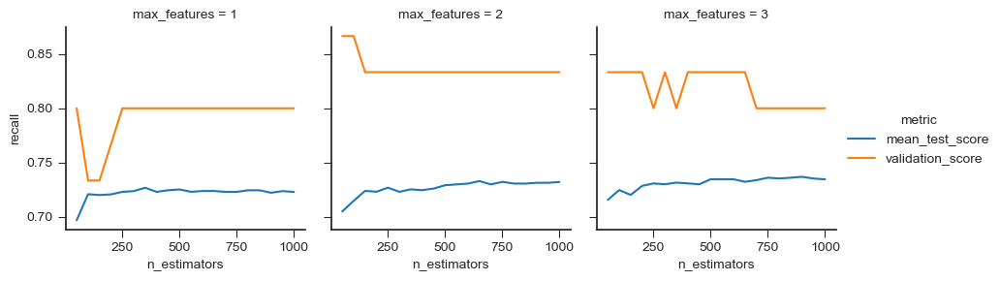

In [110]:
# Valores médios do CV (dados de treino) e recall dos dados de validação final
g = sns.FacetGrid(score_df, 
                  col='max_features',
                  hue='metric')
g.map(sns.lineplot, 'n_estimators', 'recall')
g.add_legend();

Aparentemente o "ponto ótimo" é encontrado com algum valor de **``max_features`` igual a 2**, pois é o mais constante e com os valores mais altos possíveis na `validation_score`. Já o ``n_estimators`` é o que me causa mais dúvida (*recall*'s de validação estão quase todos constantes)... Vamos dar uma olhada nos *countor plots 2D* e *3D*. 

## **7.11. Countor Plots 2D e 3D**

Melhor do que eu ficar explicando o que é esse tipo de gráfico, vou mostrá-lo na prática.

In [111]:
display(score_df.head())

,max_features,n_estimators,metric,recall
0,2,100,mean_test_score,0.714558
1,2,50,mean_test_score,0.704701
2,3,500,mean_test_score,0.734473
3,3,550,mean_test_score,0.734444
4,3,600,mean_test_score,0.734444


In [112]:
# Transformando em tabelas cruzadas
grid_pivot_mean_test = score_df[score_df['metric'] == 'mean_test_score']\
                       .pivot(index='max_features', 
                              columns='n_estimators').drop('metric', axis=1)

grid_pivot_validation = score_df[score_df['metric'] == 'validation_score']\
                        .pivot(index='max_features', 
                               columns='n_estimators').drop('metric', axis=1)

In [113]:
# Definindo as coordenadas
x_coord_mean_test = grid_pivot_mean_test.columns.levels[1].values
y_coord_mean_test = grid_pivot_mean_test.index.values
z_coord_mean_test = grid_pivot_mean_test.values

x_coord_validation = grid_pivot_validation.columns.levels[1].values
y_coord_validation = grid_pivot_validation.index.values
z_coord_validation = grid_pivot_validation.values

In [114]:
# Countor plot 2D (média dos CV's)
layout = go.Layout(
            xaxis=go.layout.XAxis(
            title=go.layout.xaxis.Title(
            text='n_estimators')
             ),
             yaxis=go.layout.YAxis(
             title=go.layout.yaxis.Title(
             text='max_features') 
            ))

fig = go.Figure(data = [go.Contour(z=z_coord_mean_test, 
                                   x=x_coord_mean_test, 
                                   y=y_coord_mean_test)], layout=layout )

fig.update_layout(title='Hyperparameter tuning (CV mean)', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

In [115]:
# Countor plot 2D (validação final)
layout = go.Layout(
            xaxis=go.layout.XAxis(
              title=go.layout.xaxis.Title(
              text='n_estimators')
             ),
             yaxis=go.layout.YAxis(
              title=go.layout.yaxis.Title(
              text='max_features') 
            ) )

fig = go.Figure(data = [go.Contour(z=z_coord_validation, 
                                   x=x_coord_validation, 
                                   y=y_coord_validation)], layout=layout )

fig.update_layout(title='Hyperparameter tuning (Validation)', autosize=False,
                  width=500, height=500,
                  margin=dict(l=65, r=50, b=65, t=90))

fig.show()

Acima temos os nossos *countor plot*'s 2D. Basicamente, para os amantes de Cálculo, temos as nossas superfícies plotadas em 2 dimensões!

E como fica tudo isso em 3D?

In [116]:
fig = go.Figure(data= [go.Surface(z=z_coord_mean_test, 
                                  y=y_coord_mean_test, 
                                  x=x_coord_mean_test)], layout=layout)
fig.update_layout(title='Hyperparameter tuning (CV mean)',
                  scene = dict(
                    xaxis_title='n_estimators',
                    yaxis_title='max_features',
                    zaxis_title='recall'),
                  autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

In [117]:
fig = go.Figure(data= [go.Surface(z=z_coord_validation, 
                                  y=y_coord_validation, 
                                  x=x_coord_validation)], layout=layout)
fig.update_layout(title='Hyperparameter tuning (Validation)',
                  scene = dict(
                    xaxis_title='n_estimators',
                    yaxis_title='max_features',
                    zaxis_title='recall'),
                  autosize=False,
                  width=800, height=800,
                  margin=dict(l=65, r=50, b=65, t=90))
fig.show()

Bem legal estes gráficos não é mesmo? Eles são representações visuais de todos os valores dos hiperparâmetros utilizados, em relação ao *recall*. Quanto mais amarelo, ou seja, quanto mais alto estiver na figura, melhor é o *score*!

**Observação:** a idéia para *plotar* este gráfico foi [desse vídeo](https://www.youtube.com/watch?v=jUxhUgkKAjE).

## **7.12. Qual a melhor floresta?**

Vou manter com a minha regra de seleção, pois além de ser um modelo mais simples, os resultados na validação final foi a melhor com o `n_estimators` igual a 100 (junto com o 50) e os valores de `mean_test_score` não sobem consideravelmente na "montanha".

O ideal mesmo é adicionar mais pacientes no nosso *dataset*, adquirindo mais métricas concisas para a validação final.

In [118]:
print('Boa! E ainda conseguimos aumentar um pouco o nosso recall médio.')
best_score = round(models_scores.iloc[0, 2], 6)
print(f'Fomos para: {best_score}.')

Boa! E ainda conseguimos aumentar um pouco o nosso recall médio.
Fomos para: 0.714558.


Temos o nosso `grid` e a *Random Forest* otimizada! E perceba que, com menos dados, o resultado foi muito próximo do que foi obtido na comparação dos modelos, este utilizando **todo o nosso *dataset***!

## **7.13. Feature Importances do modelo final**

Para finalizar, quero observar suas ***feature importances***.

Como o próprio nome em inglês diz, este conceito está relacionado com a importância que as variáveis possuem neste algoritmo. Esta é calculada através da **média dos coeficientes de Gini em cada *Decision Tree* de nossa floresta**. Se quiser saber como este coeficiente é calculado, deixei uma explicação breve na seção 7.4.3.

In [119]:
# Fittando novamente os dados totais para achar a feature importances
best_model.fit(X_train, y_train)

# Criando o DataFrame com as features e seus scores
features = final_df.iloc[:, :-1].columns
scores = best_model.feature_importances_

feature_scores = {'Feature' : features,
                  'Score' : scores}

feature_scores = pd.DataFrame(feature_scores)
feature_scores.sort_values('Score', ascending=False, 
                           ignore_index=True, inplace=True)
feature_scores.head()

,Feature,Score
0,PCR_MEAN,0.194330
1,NLR,0.193951
2,RESPIRATORY_RATE_MEAN,0.163174
3,UREA_MEAN,0.162707
4,AGE_PERCENTIL,0.144129


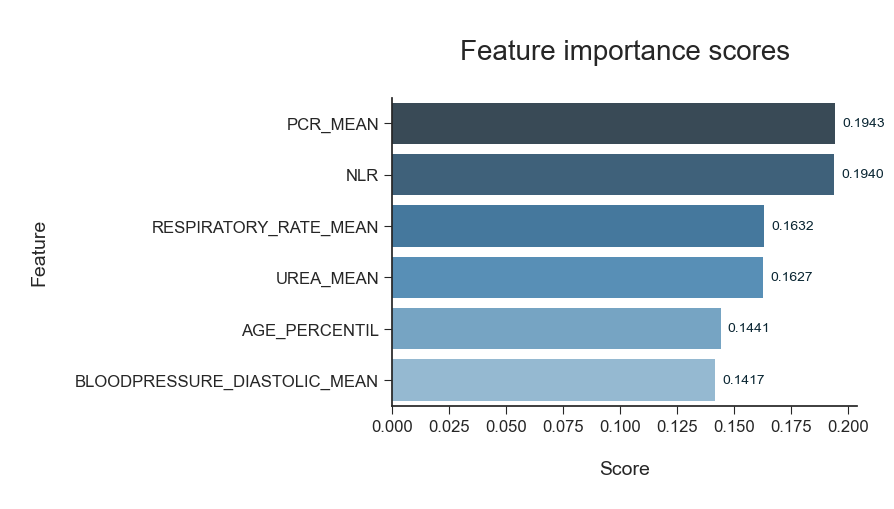

In [120]:
show_barplot(x='Score', y='Feature', df=feature_scores,
             title='Feature importance scores')

Perceba que a ordem das *feature importances* se alterou, comparado com a floresta padrão do ``sklearn``. Entretanto, a característica que mais tem importância para o modelo continua sendo a ``PCR_MEAN``, com o `NLR` em segundo lugar e bem próximo do PCR.

## **7.14. Matriz de Confusão do melhor modelo**

In [121]:
# Dados preditos da validação final
y_pred = best_model.predict(X_test)

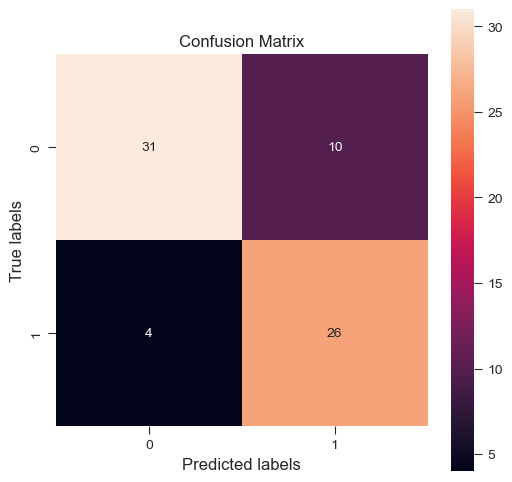

In [122]:
# Matriz de confusão
confusion_matrix(y_test, y_pred)

In [123]:
# Report das métricas
print(m.classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.89      0.76      0.82        41
           1       0.72      0.87      0.79        30

    accuracy                           0.80        71
   macro avg       0.80      0.81      0.80        71
weighted avg       0.82      0.80      0.80        71



Okay, as métricas ``precision``, ``recall`` e ``f1-score`` ficaram muito boas com o novo modelo e com os dados de validação final!

## **7.15. Salvando algumas informações**

Pensando em um futuro uso do meu modelo, ou seja, com o objetivo de colocá-lo em produção, vou salvá-lo, além de deixar os parâmetros listados!

In [124]:
'''
# Código para salvar o modelo final, com o pickle
ml_final_model = "ml_final_model.pkl"
with open(ml_final_model, 'wb') as file:
    pickle.dump(best_model, file)
'''

'\n# Código para salvar o modelo final, com o pickle\nml_final_model = "ml_final_model.pkl"\nwith open(ml_final_model, \'wb\') as file:\n    pickle.dump(best_model, file)\n'

In [125]:
'''
# Código para abrir o modelo, com o pickle
with open(ml_final_model, 'rb') as file:
    model = pickle.load(file)
'''

"\n# Código para abrir o modelo, com o pickle\nwith open(ml_final_model, 'rb') as file:\n    model = pickle.load(file)\n"

Pronto! Agora temos o melhor modelo salvo! Abaixo vão os melhores parâmetros para ele:

In [126]:
print(best_model)

RandomForestClassifier(max_features=2, random_state=42)


---
# **8. RESUMO E CONCLUSÃO DO PROJETO**

Foi um projeto bem trabalhoso, principalmente pelo fato de que existiam **muitas variáveis** para serem tratadas... Porém, em um primeiro processamento:

- Conseguimos sair de 1925 linhas e 231 colunas para **352** linhas e **230** colunas.

Fizemos em seguida a análise exploratória de dados, descobrindo que:

- Os **dados eram bem balanceados**, ou seja, existiam quantidades próximas de pacientes que foram para a UTI e não foram;

- Sobre a idade:

  - Tivemos **mais pacientes abaixo de 65 anos** (191 pessoas) no *Dataset*;

  - Das pessoas que são **acima de 65 anos**, existe uma **quantidade maior das que foram para a UTI** (100 pessoas);

  - Das pessoas que são **abaixo de 65 anos**, aproximadamente o **dobro não foi para a UTI** (128 pessoas);

  - O **maior número de pacientes** que foram para o hospital estão em um **percentil de 20 anos** (42 pessoas);

  - Pode-se notar uma **tendência crescente no número de ocorrências de UTI, conforme se aumenta a idade**;

  - Da mesma forma o oposto acontece, ou seja, a **tendência é decrescente no número de pessoas que não foram para a UTI, conforme se aumenta a idade**.

- Sobre o gênero:

  - Existem **muito mais homens hospitalizados** no *Dataset* (218 homens e 114 mulheres, quase o dobro);

  - Tivemos **mais homens sendo internados na UTI** (111 pessoas), **comparado com as mulheres** (52 pessoas);

  - **Dos homens, temos pouca diferença entre os que vão para a UTI ou não**, são quantidades praticamente iguais;

  - **Das mulheres, podemos notar que uma quantidade maior de pessoas não foram para a UTI** (82 pessoas).

- Sobre as doenças:

  - **Em quase todas as visualizações de doença, a maioria das pessoas não as tiveram**, com **excessão de `OTHER`**;

  - **Dos que tiveram as doenças, em quase todos os gráficos tivemos um maior número de pacientes indo para a UTI, apenas não aconteceu em `DISEASE GROUPING 6` e `OTHER`**;

  - **Quando a pessoa estava com determinada doença, a `HTN` (depois de `OTHER`) foi a que teve mais casos de UTI, totalizando 44 pacientes**.

Depois de ver as variáveis qualitativas, partimos para ver as quantitativas. Entretanto, mais um problema apareceu, eram **MUITAS variáveis** e que, além disso, as distribuições de `MIN`, `MAX` e `MEDIAN` eram bem parecidas, apenas para ``HEART_RATE`` e ``TEMPERATURE`` essas medidas não eram praticamente iguais. Fora esse fato, a maioria das `DIFF`'s e algumas outras variáveis apresentavam valores únicos!

A solução foi retirar essas medidas que poderiam ser redundantes, tanto para a *EDA* quanto para nossos algoritmos de *ML*:

- Depois desse segundo pré-processamento, fomos de 230 colunas para **51**!

Após esta remoção, observamos as variáveis contínuas bem por cima, vimos suas **dispersões**, **médias**, **medianas** e **desvios padrões**. No final dessa etapa, plotamos uma **matriz de correlação** de forma mais intuitiva, com um **mapa de calor**.

Pesquisamos o porquê de algumas correlações serem altas, e após esse entendimento das relações, utilizamos o **Boruta** como método de seleção de variáveis, excluindo quase todas, deixando apenas **7** variáveis no *DataFrame*!

Partimos então para a criação dos modelos de *Machine Learning*, e os selecionados para treino e teste foram:

- *Naive-Bayes*;

- *Logistic Regression*;

- *Decision Tree Classifier*;

- *Random Forest Classifier*.

Analisamos todas as **médias das métricas** e seus **intervalos de confiança**, definidas/os a partir da ***cross-validation*** e o estimador **`RepeatedStratifiedKFold()`**. Enfim, escolhemos a ***Random Forest***, pois em quase todos os resultados ela se saiu melhor.

Apesar da escolha ser a floresta aleatória, fizemos um paralelo com a *feature importances* da *Random Forest* e os betas da *Logistic Regression* e vimos o quanto a **`PCR_MEAN`** era significativa na chance da pessoa precisar de UTI!

Após esta etapa, fizemos o ***tuning* de hiperparâmetros** e, após achar a média dos *recall*'s para os *CV*'s, comparamos em conjunto com os *scores* dos dados de validação final. Com isso, achamos o melhor modelo, e aumentamos o ***recall*** médio do *cross-validation*, quando comparamos com o modelo padrão do ``sklearn``!

In [127]:
print('O melhor modelo foi:')
print(best_model)

O melhor modelo foi:
RandomForestClassifier(max_features=2, random_state=42)


In [128]:
print(f'Conseguindo obter um recall médio de: {best_score}')

Conseguindo obter um recall médio de: 0.714558


E para terminar, vimos as ***feature importances*** do modelo final e o testamos novamente para obter outras métrcas de avaliação, como *precision* e *f1-score*. Para a nossa felicidade, os resultados foram muito bons!

Depois salvamos e finalmente acabamos o trabalho neste *notebook*!

Concluindo, foi muito legal trabalhar em cima de um problema real e que, recentemente (03/2021), vem sendo uma das maiores preocupações dos sistemas de saúde, principalmente porque o **número de leitos de UTI disponíveis, infelizmente, está diminuindo em muitos lugares do Brasil**...

É algo que precisamos resolver com **urgência**, pois se acabarem os equipamentos, um verdadeiro colapso pode se tornar realidade.

---
# **9. AGRADECIMENTOS**

**Meus sinceros agradecimentos a todos os envolvidos do Bootcamp da Alura (*Data Science* Aplicada)**, sinto que consegui me desenvolver bastante nesse período com vocês, além de que, até recebi mimos! :)

Agora, meus próximos passos envolvem muita dedicação e estudo, aprofundando, cada vez mais, meus conhecimentos na área de *Data Science*!

Mais uma vez, muito obrigado por tudo! <3